![purple_net](https://drive.google.com/uc?id=1QSwYGDR-xvvfIrVzfryo-h0rctT2EAME)



# **<font color="purple">Hunter College Deep Learning -- Project - Ken Ko, Muhammad Tanveer</font>**
### **<font color="purple">CSCI 493.77</font>**

---
---

# Mount Data from Google Drive to Colab

In [ ]:
from google.colab import drive

drive.mount('/content/drive/')

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


In [ ]:
# import the packages we will use
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import tensorflow as tf
import os
import zipfile

from tensorflow.random import set_seed

np.random.seed(15)
set_seed(15)

!ls

drive  sample_data


In [ ]:
with zipfile.ZipFile('/content/drive/My Drive/Deep Learning project/project_stages345_data.zip','r') as zip_ref:
  zip_ref.extractall()

!ls

drive  project_stages345_data  sample_data


In [ ]:
# path to store the stratified copy of the dataset at
data_path = '/content/project_stages345_data'

# paths of the test, train, and validation dataset
test_path = data_path + '/test'
train_path = data_path + '/train'
valid_path = data_path + '/val'

# Preprocessing with ImageDataGenerator

ImageDataGenerator is used to set up batches of images to load into the model and to scale the images as they're loaded. It also knows what to label each image because the file structure is set up in a specific way that it recognizes.

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [ ]:
image_shape = (512,512,3) # specify 512 x 512 as the dimensions to resize all images to; will default to (256, 256) if not specified
batch_size = 32 #this is the default
image_gen = ImageDataGenerator(fill_mode='nearest', rescale=1./255.) # Fill in missing pixels with the nearest filled value and rescale pixels

'''image_gen = ImageDataGenerator(fill_mode='nearest', #missing pixels nearest filled value
                               rescale=1./255., # Rescale the image in range [0,1]
                               rotation_range=45, # rotate the image 45 degrees
                               width_shift_range=0.05, # Shift the pic width by a max of 5%
                               height_shift_range=0.05, # Shift the pic height by a max of 5%
                               shear_range=0.05, # Shear angle in degrees% (max 10%)
                               zoom_range=0.1, # Zoom in by 10% max
                               horizontal_flip=True, # Allow horizontal flipping - e.g. bell flipped horizontally is still a bell
                               vertical_flip=False, # Do not allow vertical flipping - e.g. images are all right-side up; upside down images might confuse it
                               #validation_split=0.2,
                               brightness_range=[0.2,1.2] # 20% darken and lighten the image
                               )'''

In [ ]:
# loads and iterates training dataset
# default batch_size is 32
# class_mode='sparse' is used for multi-label classification. 'categorical' is another possibility
train_image_gen = image_gen.flow_from_directory(train_path,
                                                target_size=image_shape[:2],
                                                class_mode='categorical',
                                                batch_size=batch_size)

# loads and iterates test dataset
test_image_gen = image_gen.flow_from_directory(test_path,
                                               target_size=image_shape[:2],
                                               class_mode='categorical',
                                               batch_size=batch_size,
                                               shuffle=False)

# loads and iterates validation dataset
valid_image_gen = image_gen.flow_from_directory(valid_path,
                                               target_size=image_shape[:2],
                                               class_mode='categorical',
                                               batch_size=batch_size,
                                               shuffle=False)

Found 18000 images belonging to 5 classes.
Found 2250 images belonging to 5 classes.
Found 2250 images belonging to 5 classes.


In [ ]:
# check assigned labels in the training set
train_image_gen.class_indices

{'bell': 0, 'dog': 1, 'horse': 2, 'house': 3, 'tiger': 4}

# Stage III Models (M1-M5)

## Model M1

This model is based on Muhammad's M1 model for Lab 7.

In [ ]:
from sklearn.metrics import f1_score as f1
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPool2D
from tensorflow.keras.utils import plot_model

from tensorflow.keras.layers import Dense, Flatten, Dropout
from tensorflow.keras.initializers import he_normal #might want to switch to SELU and use LeCun
from tensorflow.keras.callbacks import EarlyStopping

# early stopping parameters
earlyStop1 = EarlyStopping(monitor='val_loss', mode='min',
                          verbose = 1, patience=10,
                          restore_best_weights=True)#could change the min_delta

model1 = Sequential()

#filters = number of feature maps created
#kernel = size of filter(7,7) deafault stride =1
#using RELU Activation
#padding set to same
#input shape is 512x512 pixel, 1=grayscale (3 for color/rbg img)

#CNN
model1.add(Conv2D(filters=64, kernel_size=5,
                  activation='relu', padding='same',
                  input_shape=[512,512,3]
                  ))
model1.add(MaxPool2D(2))

model1.add(Conv2D(filters=32, kernel_size=3,
                  activation='relu', padding='same'))
model1.add(MaxPool2D(2))

model1.add(Conv2D(filters=16, kernel_size=3,
                  activation='relu', padding='same'))
model1.add(MaxPool2D(2))

model1.add(Conv2D(filters=16, kernel_size=3,
                  activation='relu', padding='same'))
model1.add(MaxPool2D(2))

model1.add(Conv2D(filters=16, kernel_size=3,
                  activation='relu', padding='same'))
model1.add(MaxPool2D(2))

#DNN
model1.add(Flatten())
model1.add(Dense(16,activation="relu"))
model1.add(Dropout(0.5))
model1.add(Dense(8,activation="relu"))
model1.add(Dropout(0.5))

model1.add(Dense(5, activation="softmax"))


model1.compile(loss='sparse_categorical_crossentropy',  #sparse_cat_ent bc this is a multiclass classification problem
               optimizer='nadam',
               metrics = ["accuracy"])

In [ ]:
model1.summary()

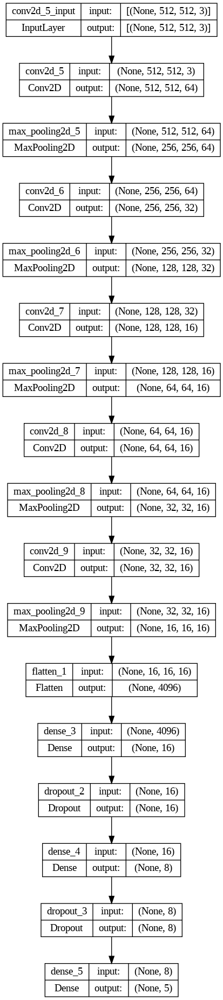

In [ ]:
plot_model(model1, "M1.png", show_shapes=True)

In [ ]:
!pip install visualkeras
import visualkeras
from collections import defaultdict

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 993.0/993.0 kB 13.8 MB/s eta 0:00:00


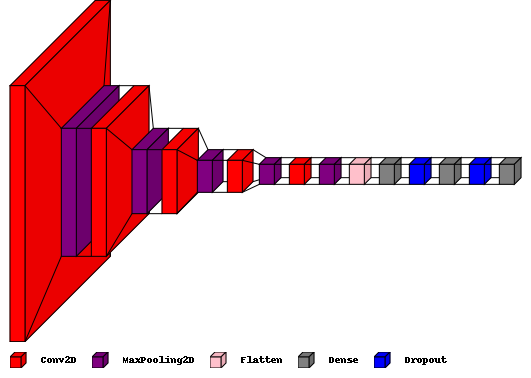

In [ ]:
color_map = defaultdict(dict)
color_map[Conv2D]['fill'] = 'red'
color_map[MaxPool2D]['fill'] = 'purple'
color_map[Dense]['fill'] = 'gray'
color_map[Flatten]['fill'] = 'pink'
color_map[Dropout]['fill'] = 'blue'

visualkeras.layered_view(model1, legend=True, scale_xy=0.5, scale_z=0.5, max_z=15, spacing=15, draw_funnel=True, draw_volume=True, color_map=color_map).show() # display using your system viewer

In [ ]:
history = model1.fit(train_image_gen,
                     validation_data = valid_image_gen,
                     callbacks =[earlyStop1], epochs =30)

Epoch 1/30
282/282 [==============================] - 356s 1s/step - loss: 1.5952 - accuracy: 0.2209 - val_loss: 1.5354 - val_accuracy: 0.3622
Epoch 2/30
282/282 [==============================] - 339s 1s/step - loss: 1.5488 - accuracy: 0.2812 - val_loss: 1.4707 - val_accuracy: 0.4116
Epoch 3/30
282/282 [==============================] - 338s 1s/step - loss: 1.5157 - accuracy: 0.2946 - val_loss: 1.4031 - val_accuracy: 0.4596
Epoch 4/30
282/282 [==============================] - 340s 1s/step - loss: 1.4587 - accuracy: 0.3233 - val_loss: 1.2848 - val_accuracy: 0.4747
Epoch 5/30
282/282 [==============================] - 340s 1s/step - loss: 1.3704 - accuracy: 0.3740 - val_loss: 1.2160 - val_accuracy: 0.5733
Epoch 6/30
282/282 [==============================] - 337s 1s/step - loss: 1.3195 - accuracy: 0.3978 - val_loss: 1.1719 - val_accuracy: 0.5676
Epoch 7/30
282/282 [==============================] - 338s 1s/step - loss: 1.2657 - accuracy: 0.4363 - val_loss: 1.1199 - val_accuracy: 0.5800

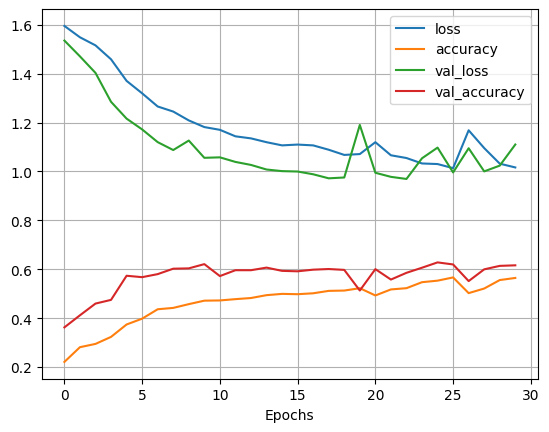

In [ ]:
#history_m1.history can also be used if defined above
losses_m1 = pd.DataFrame(model1.history.history).plot(xlabel="Epochs", grid=True);

In [ ]:
scores_m1 = model1.evaluate(test_image_gen)
print("Evaluation Accuracy: ", np.round(scores_m1[1],4))

36/36 [==============================] - 38s 1s/step - loss: 1.0285 - accuracy: 0.6413
Evaluation Accuracy:  0.6413


In [ ]:
model1.save("Project_M1 zip", save_format="tf")
# to download it from Colab to your computer
from google.colab import files
!zip -r Project_M1.zip "Project_M1 zip"/
files.download("Project_M1.zip")

model1.save("Project_M1", save_format="h5")
files.download("Project_M1")

## Model M2

In [ ]:
from sklearn.metrics import f1_score as f1
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPool2D


from tensorflow.keras.layers import Dense, Flatten, Dropout
from tensorflow.keras.initializers import he_normal #might want to switch to SELU and use LeCun
from tensorflow.keras.callbacks import EarlyStopping

# early stopping parameters
earlyStop2 = EarlyStopping(monitor='val_loss', mode='min',
                          verbose = 1, patience=10,
                          restore_best_weights=True)#could change the min_delta

model2 = Sequential()

#filters = number of feature maps created
#kernel = size of filter(7,7) deafault stride =1
#using RELU Activation
#padding set to same
#input shape is 512x512 pixel, 1=grayscale (3 for color/rbg img)

#CNN
model2.add(Conv2D(filters=64, kernel_size=5,
                  activation='relu', padding='same',
                  input_shape=[512,512,3]
                  ))
model2.add(MaxPool2D(2))

model2.add(Conv2D(filters=32, kernel_size=3,
                  activation='relu', padding='same'))
model2.add(MaxPool2D(2))

model2.add(Conv2D(filters=16, kernel_size=3,
                  activation='relu', padding='same'))
model2.add(MaxPool2D(2))

model2.add(Conv2D(filters=16, kernel_size=3,
                  activation='relu', padding='same'))
model2.add(MaxPool2D(2))

model2.add(Conv2D(filters=16, kernel_size=3,
                  activation='relu', padding='same'))
model2.add(MaxPool2D(2))

#DNN
model2.add(Flatten())
model2.add(Dense(128,activation="relu"))
model2.add(Dropout(0.5))
model2.add(Dense(64,activation="relu"))
model2.add(Dropout(0.5))

model2.add(Dense(5, activation="softmax"))


model2.compile(loss='sparse_categorical_crossentropy',  #sparse_cat_ent bc this is a multiclass classification problem
               optimizer='nadam',
               metrics = ["accuracy"])

In [ ]:
model2.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_10 (Conv2D)          (None, 512, 512, 64)      4864      
                                                                 
 max_pooling2d_10 (MaxPoolin  (None, 256, 256, 64)     0         
 g2D)                                                            
                                                                 
 conv2d_11 (Conv2D)          (None, 256, 256, 32)      18464     
                                                                 
 max_pooling2d_11 (MaxPoolin  (None, 128, 128, 32)     0         
 g2D)                                                            
                                                                 
 conv2d_12 (Conv2D)          (None, 128, 128, 16)      4624      
                                                                 
 max_pooling2d_12 (MaxPoolin  (None, 64, 64, 16)      

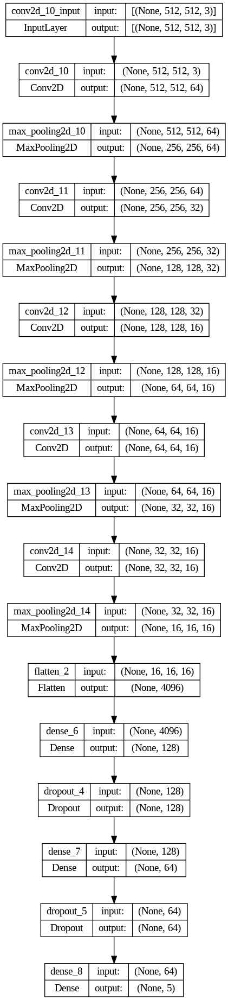

In [ ]:
plot_model(model2, "M2.png", show_shapes=True)

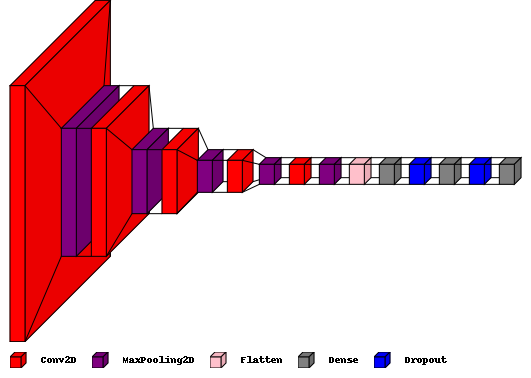

In [ ]:
color_map = defaultdict(dict)
color_map[Conv2D]['fill'] = 'red'
color_map[MaxPool2D]['fill'] = 'purple'
color_map[Dense]['fill'] = 'gray'
color_map[Flatten]['fill'] = 'pink'
color_map[Dropout]['fill'] = 'blue'

visualkeras.layered_view(model2, legend=True, scale_xy=0.5, scale_z=0.5, max_z=15, spacing=15, draw_funnel=True, draw_volume=True, color_map=color_map).show() # display using your system viewer

In [ ]:
history2 = model2.fit(train_image_gen,
                     validation_data = valid_image_gen,
                     callbacks =[earlyStop2], epochs =30)

Epoch 1/30
563/563 [==============================] - 352s 616ms/step - loss: 1.4379 - accuracy: 0.3664 - val_loss: 1.1351 - val_accuracy: 0.5689
Epoch 2/30
563/563 [==============================] - 343s 608ms/step - loss: 1.0795 - accuracy: 0.5826 - val_loss: 0.8837 - val_accuracy: 0.6644
Epoch 3/30
563/563 [==============================] - 342s 608ms/step - loss: 0.8983 - accuracy: 0.6533 - val_loss: 0.7857 - val_accuracy: 0.7098
Epoch 4/30
563/563 [==============================] - 343s 610ms/step - loss: 0.7867 - accuracy: 0.7022 - val_loss: 0.7359 - val_accuracy: 0.7236
Epoch 5/30
563/563 [==============================] - 342s 608ms/step - loss: 0.7230 - accuracy: 0.7277 - val_loss: 0.7353 - val_accuracy: 0.7284
Epoch 6/30
563/563 [==============================] - 345s 613ms/step - loss: 0.6659 - accuracy: 0.7528 - val_loss: 0.7822 - val_accuracy: 0.7071
Epoch 7/30
563/563 [==============================] - 341s 606ms/step - loss: 0.5995 - accuracy: 0.7766 - val_loss: 0.7363 -

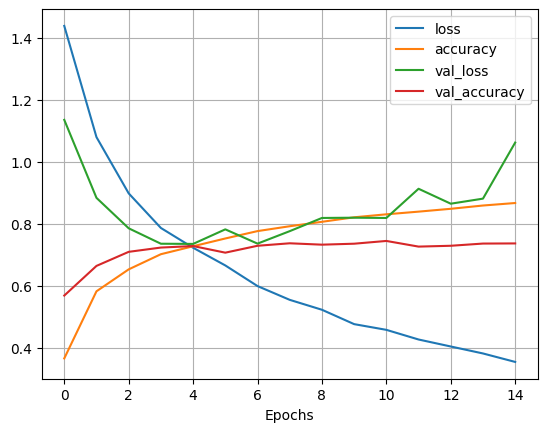

In [ ]:
#history_m1.history can also be used if defined above
losses_m2 = pd.DataFrame(model2.history.history).plot(xlabel="Epochs", grid=True);

In [ ]:
scores_m2 = model2.evaluate(test_image_gen)
print("Evaluation Accuracy: ", np.round(scores_m2[1],4))

71/71 [==============================] - 37s 526ms/step - loss: 0.7236 - accuracy: 0.7227
Evaluation Accuracy:  0.7227


In [ ]:
model2.save("Project_M2 zip", save_format="tf")
# to download it from Colab to your computer
from google.colab import files
!zip -r Project_M2.zip "Project_M2 zip"/
files.download("Project_M2.zip")

model2.save("Project_M2", save_format="h5")
# to download it from Colab to your computer
from google.colab import files
files.download("Project_M2")

## Model M3

In [ ]:
from sklearn.metrics import f1_score as f1
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPool2D


from tensorflow.keras.layers import Dense, Flatten, Dropout
from tensorflow.keras.initializers import he_normal #might want to switch to SELU and use LeCun
from tensorflow.keras.callbacks import EarlyStopping

# early stopping parameters
earlyStop3 = EarlyStopping(monitor='val_loss', mode='min',
                          verbose = 1, patience=10,
                          restore_best_weights=True)#could change the min_delta

model3 = Sequential()

#filters = number of feature maps created
#kernel = size of filter(7,7) deafault stride =1
#using RELU Activation
#padding set to same
#input shape is 512x512 pixel, 1=grayscale (3 for color/rbg img)

#CNN
model3.add(Conv2D(filters=64, kernel_size=5,
                  activation='relu', padding='same',
                  input_shape=[512,512,3]
                  ))
model3.add(MaxPool2D(2))

model3.add(Conv2D(filters=32, kernel_size=3,
                  activation='relu', padding='same'))
model3.add(MaxPool2D(2))

model3.add(Conv2D(filters=16, kernel_size=3,
                  activation='relu', padding='same'))
model3.add(MaxPool2D(2))

model3.add(Conv2D(filters=16, kernel_size=3,
                  activation='relu', padding='same'))
model3.add(MaxPool2D(2))

model3.add(Conv2D(filters=16, kernel_size=3,
                  activation='relu', padding='same'))
model3.add(MaxPool2D(2))

#DNN
model3.add(Flatten())
model3.add(Dense(4096,activation="relu"))
model3.add(Dropout(0.5))

model3.add(Dense(5, activation="softmax"))


model3.compile(loss='sparse_categorical_crossentropy',  #sparse_cat_ent bc this is a multiclass classification problem
               optimizer='nadam',
               metrics = ["accuracy"])

In [ ]:
history3 = model3.fit(train_image_gen,
                     validation_data = valid_image_gen,
                     callbacks =[earlyStop3], epochs =30)

Epoch 1/30
563/563 [==============================] - 343s 602ms/step - loss: 1.2092 - accuracy: 0.4966 - val_loss: 0.9652 - val_accuracy: 0.6222
Epoch 2/30
563/563 [==============================] - 339s 602ms/step - loss: 0.8050 - accuracy: 0.6912 - val_loss: 0.7864 - val_accuracy: 0.6920
Epoch 3/30
563/563 [==============================] - 340s 603ms/step - loss: 0.6489 - accuracy: 0.7533 - val_loss: 0.7740 - val_accuracy: 0.7107
Epoch 4/30
563/563 [==============================] - 340s 603ms/step - loss: 0.5132 - accuracy: 0.8093 - val_loss: 0.8195 - val_accuracy: 0.7151
Epoch 5/30
563/563 [==============================] - 340s 604ms/step - loss: 0.3600 - accuracy: 0.8695 - val_loss: 0.9250 - val_accuracy: 0.7058
Epoch 6/30
563/563 [==============================] - 341s 605ms/step - loss: 0.2169 - accuracy: 0.9235 - val_loss: 1.0482 - val_accuracy: 0.7142
Epoch 7/30
563/563 [==============================] - 341s 605ms/step - loss: 0.1481 - accuracy: 0.9508 - val_loss: 1.3206 -

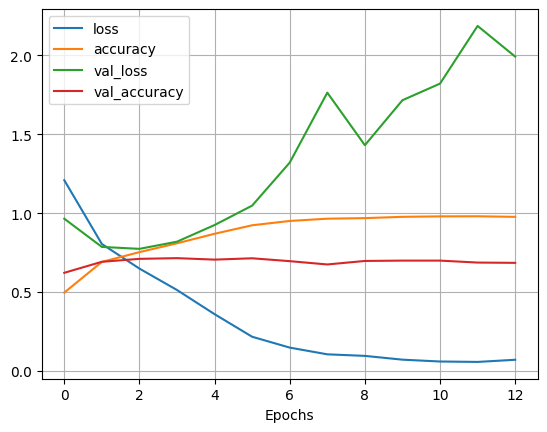

In [ ]:
#history_m1.history can also be used if defined above
losses_m3 = pd.DataFrame(model3.history.history).plot(xlabel="Epochs", grid=True);

In [ ]:
scores_m3 = model3.evaluate(test_image_gen)
print("Evaluation Accuracy: ", np.round(scores_m3[1],4))

71/71 [==============================] - 38s 531ms/step - loss: 0.7496 - accuracy: 0.7213
Evaluation Accuracy:  0.7213


In [ ]:
model3.save("Project_M3 zip", save_format="tf")
# to download it from Colab to your computer
from google.colab import files
!zip -r Project_M3.zip "Project_M3 zip"/
files.download("Project_M3.zip")

model3.save("Project_M3", save_format="h5")
files.download("Project_M3")

## Model M4

In [ ]:
from sklearn.metrics import f1_score as f1
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPool2D


from tensorflow.keras.layers import Dense, Flatten, Dropout
from tensorflow.keras.initializers import he_normal #might want to switch to SELU and use LeCun
from tensorflow.keras.callbacks import EarlyStopping

# early stopping parameters
earlyStop4 = EarlyStopping(monitor='val_loss', mode='min',
                          verbose = 1, patience=10,
                          restore_best_weights=True)#could change the min_delta

model4 = Sequential()

#filters = number of feature maps created
#kernel = size of filter(7,7) deafault stride =1
#using RELU Activation
#padding set to same
#input shape is 512x512 pixel, 1=grayscale (3 for color/rbg img)

#CNN
model4.add(Conv2D(filters=128, kernel_size=5,
                  activation='relu', padding='same',
                  input_shape=[512,512,3]
                  ))
model4.add(MaxPool2D(2))

model4.add(Conv2D(filters=128, kernel_size=3,
                  activation='relu', padding='same'))
model4.add(MaxPool2D(2))

model4.add(Conv2D(filters=64, kernel_size=3,
                  activation='relu', padding='same'))
model4.add(MaxPool2D(2))

model4.add(Conv2D(filters=64, kernel_size=3,
                  activation='relu', padding='same'))
model4.add(MaxPool2D(2))

model4.add(Conv2D(filters=32, kernel_size=3,
                  activation='relu', padding='same'))
model4.add(MaxPool2D(2))

model4.add(Conv2D(filters=32, kernel_size=3,
                  activation='relu', padding='same'))
model4.add(MaxPool2D(2))

model4.add(Conv2D(filters=16, kernel_size=3,
                  activation='relu', padding='same'))
model4.add(MaxPool2D(2))

#DNN
model4.add(Flatten())
model4.add(Dense(128,activation="relu"))
model4.add(Dropout(0.5))
model4.add(Dense(64,activation="relu"))
model4.add(Dropout(0.5))

model4.add(Dense(5, activation="softmax"))


model4.compile(loss='sparse_categorical_crossentropy',  #sparse_cat_ent bc this is a multiclass classification problem
               optimizer='nadam',
               metrics = ["accuracy"])

In [ ]:
model4.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_15 (Conv2D)          (None, 512, 512, 128)     9728      
                                                                 
 max_pooling2d_15 (MaxPoolin  (None, 256, 256, 128)    0         
 g2D)                                                            
                                                                 
 conv2d_16 (Conv2D)          (None, 256, 256, 128)     147584    
                                                                 
 max_pooling2d_16 (MaxPoolin  (None, 128, 128, 128)    0         
 g2D)                                                            
                                                                 
 conv2d_17 (Conv2D)          (None, 128, 128, 64)      73792     
                                                                 
 max_pooling2d_17 (MaxPoolin  (None, 64, 64, 64)      

In [ ]:
history4 = model4.fit(train_image_gen,
                     validation_data = valid_image_gen,
                     callbacks =[earlyStop4], epochs =30)

Epoch 1/30
563/563 [==============================] - 354s 611ms/step - loss: 1.5596 - accuracy: 0.2631 - val_loss: 1.3913 - val_accuracy: 0.4053
Epoch 2/30
563/563 [==============================] - 339s 603ms/step - loss: 1.4008 - accuracy: 0.4030 - val_loss: 1.2940 - val_accuracy: 0.4756
Epoch 3/30
563/563 [==============================] - 341s 605ms/step - loss: 1.3207 - accuracy: 0.4568 - val_loss: 1.2255 - val_accuracy: 0.5142
Epoch 4/30
563/563 [==============================] - 339s 602ms/step - loss: 1.2165 - accuracy: 0.5128 - val_loss: 1.0167 - val_accuracy: 0.6102
Epoch 5/30
563/563 [==============================] - 339s 602ms/step - loss: 1.0020 - accuracy: 0.6199 - val_loss: 0.8728 - val_accuracy: 0.6680
Epoch 6/30
563/563 [==============================] - 341s 605ms/step - loss: 0.8653 - accuracy: 0.6721 - val_loss: 0.7972 - val_accuracy: 0.7004
Epoch 7/30
563/563 [==============================] - 341s 606ms/step - loss: 0.7926 - accuracy: 0.7036 - val_loss: 0.7858 -

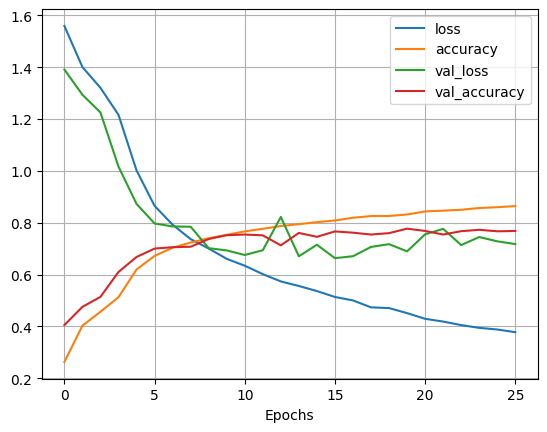

In [ ]:
#history_m1.history can also be used if defined above
losses_m4 = pd.DataFrame(model4.history.history).plot(xlabel="Epochs", grid=True);

In [ ]:
scores_m4 = model4.evaluate(test_image_gen)
print("Evaluation Accuracy: ", np.round(scores_m4[1],4))

71/71 [==============================] - 38s 535ms/step - loss: 0.6259 - accuracy: 0.7769
Evaluation Accuracy:  0.7769


In [ ]:
model4.save("Project_M4 zip", save_format="tf")
# to download it from Colab to your computer
from google.colab import files
!zip -r Project_M4.zip "Project_M4 zip"/
files.download("Project_M4.zip")

model4.save("Project_M4", save_format="h5")
files.download("Project_M4")

  adding: Project_M4 zip/ (stored 0%)
  adding: Project_M4 zip/variables/ (stored 0%)
  adding: Project_M4 zip/variables/variables.data-00000-of-00001 (deflated 24%)
  adding: Project_M4 zip/variables/variables.index (deflated 68%)
  adding: Project_M4 zip/assets/ (stored 0%)
  adding: Project_M4 zip/fingerprint.pb (stored 0%)
  adding: Project_M4 zip/saved_model.pb (deflated 90%)
  adding: Project_M4 zip/keras_metadata.pb (deflated 94%)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## Model M5

In [ ]:
from sklearn.metrics import f1_score as f1
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPool2D


from tensorflow.keras.layers import Dense, Flatten, Dropout
from tensorflow.keras.initializers import he_normal #might want to switch to SELU and use LeCun
from tensorflow.keras.callbacks import EarlyStopping

# early stopping parameters
earlyStop5 = EarlyStopping(monitor='val_loss', mode='min',
                          verbose = 1, patience=10,
                          restore_best_weights=True)#could change the min_delta

model5 = Sequential()

#filters = number of feature maps created
#kernel = size of filter(7,7) deafault stride =1
#using RELU Activation
#padding set to same
#input shape is 512x512 pixel, 1=grayscale (3 for color/rbg img)

#CNN
model5.add(Conv2D(filters=128, kernel_size=5,
                  activation='relu', padding='same',
                  input_shape=[512,512,3]
                  ))
model5.add(MaxPool2D(2))

model5.add(Conv2D(filters=128, kernel_size=3,
                  activation='relu', padding='same'))
model5.add(MaxPool2D(2))

model5.add(Conv2D(filters=64, kernel_size=3,
                  activation='relu', padding='same'))
model5.add(MaxPool2D(2))

model5.add(Conv2D(filters=64, kernel_size=3,
                  activation='relu', padding='same'))
model5.add(MaxPool2D(2))

model5.add(Conv2D(filters=32, kernel_size=3,
                  activation='relu', padding='same'))
model5.add(MaxPool2D(2))

model5.add(Conv2D(filters=32, kernel_size=3,
                  activation='relu', padding='same'))
model5.add(Conv2D(filters=16, kernel_size=3,
                  activation='relu', padding='same'))
model5.add(MaxPool2D(2))

#DNN
model5.add(Flatten())
model5.add(Dense(128,activation="relu"))
model5.add(Dropout(0.5))
model5.add(Dense(64,activation="relu"))
model5.add(Dropout(0.5))

model5.add(Dense(5, activation="softmax"))


model5.compile(loss='sparse_categorical_crossentropy',  #sparse_cat_ent bc this is a multiclass classification problem
               optimizer='adam',
               metrics = ["accuracy"])

In [ ]:
history5 = model5.fit(train_image_gen,
                     validation_data = valid_image_gen,
                     callbacks =[earlyStop5], epochs =30)

Epoch 1/30
563/563 [==============================] - 343s 604ms/step - loss: 1.5396 - accuracy: 0.2862 - val_loss: 1.3579 - val_accuracy: 0.4302
Epoch 2/30
563/563 [==============================] - 340s 604ms/step - loss: 1.4066 - accuracy: 0.3976 - val_loss: 1.3641 - val_accuracy: 0.4271
Epoch 3/30
563/563 [==============================] - 341s 606ms/step - loss: 1.3532 - accuracy: 0.4271 - val_loss: 1.2662 - val_accuracy: 0.4769
Epoch 4/30
563/563 [==============================] - 344s 611ms/step - loss: 1.2615 - accuracy: 0.4887 - val_loss: 1.1536 - val_accuracy: 0.5347
Epoch 5/30
563/563 [==============================] - 342s 607ms/step - loss: 1.1795 - accuracy: 0.5331 - val_loss: 1.0757 - val_accuracy: 0.5649
Epoch 6/30
563/563 [==============================] - 338s 600ms/step - loss: 1.0700 - accuracy: 0.5874 - val_loss: 0.9629 - val_accuracy: 0.6262
Epoch 7/30
563/563 [==============================] - 342s 608ms/step - loss: 0.9740 - accuracy: 0.6304 - val_loss: 0.9093 -

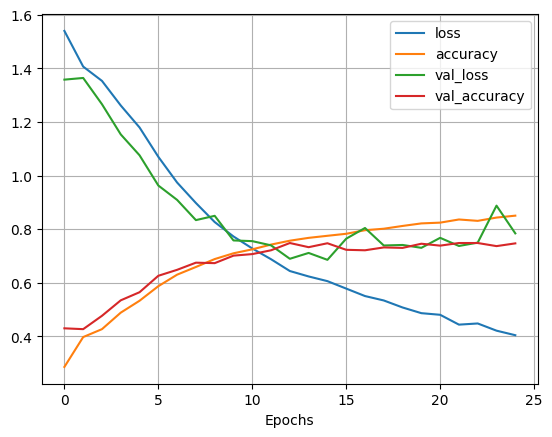

In [ ]:
#history_m5.history can also be used if defined above
losses_m5 = pd.DataFrame(model5.history.history).plot(xlabel="Epochs", grid=True);

In [ ]:
scores_m5 = model5.evaluate(test_image_gen)
print("Evaluation Accuracy: ", np.round(scores_m5[1],4))

71/71 [==============================] - 39s 541ms/step - loss: 0.7077 - accuracy: 0.7471
Evaluation Accuracy:  0.7471


In [ ]:
model5.save("Project_M5 zip", save_format="tf")
# to download it from Colab to your computer
from google.colab import files
!zip -r Project_M5.zip "Project_M5 zip"/
files.download("Project_M5.zip")

model5.save("Project_M5", save_format="h5")
files.download("Project_M5")

  adding: Project_M5 zip/ (stored 0%)
  adding: Project_M5 zip/variables/ (stored 0%)
  adding: Project_M5 zip/variables/variables.data-00000-of-00001 (deflated 22%)
  adding: Project_M5 zip/variables/variables.index (deflated 68%)
  adding: Project_M5 zip/assets/ (stored 0%)
  adding: Project_M5 zip/fingerprint.pb (stored 0%)
  adding: Project_M5 zip/saved_model.pb (deflated 89%)
  adding: Project_M5 zip/keras_metadata.pb (deflated 94%)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## Model M5 v2.0

In [ ]:
from sklearn.metrics import f1_score as f1
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPool2D


from tensorflow.keras.layers import Dense, Flatten, Dropout
from tensorflow.keras.initializers import he_normal #might want to switch to SELU and use LeCun
from tensorflow.keras.callbacks import EarlyStopping

# early stopping parameters
earlyStop5 = EarlyStopping(monitor='val_loss', mode='min',
                          verbose = 1, patience=10,
                          restore_best_weights=True)#could change the min_delta

model5 = Sequential()

#filters = number of feature maps created
#kernel = size of filter(7,7) deafault stride =1
#using RELU Activation
#padding set to same
#input shape is 512x512 pixel, 1=grayscale (3 for color/rbg img)

#CNN
model5.add(Conv2D(filters=128, kernel_size=5,
                  activation='relu', padding='same',
                  input_shape=[512,512,3]
                  ))
model5.add(MaxPool2D(2))

model5.add(Conv2D(filters=128, kernel_size=3,
                  activation='relu', padding='same'))
model5.add(MaxPool2D(2))

model5.add(Conv2D(filters=64, kernel_size=3,
                  activation='relu', padding='same'))
model5.add(MaxPool2D(2))

model5.add(Conv2D(filters=64, kernel_size=3,
                  activation='relu', padding='same'))
model5.add(MaxPool2D(2))

model5.add(Conv2D(filters=32, kernel_size=3,
                  activation='relu', padding='same'))
model5.add(MaxPool2D(2))

model5.add(Conv2D(filters=32, kernel_size=3,
                  activation='relu', padding='same'))
model5.add(MaxPool2D(2))

model5.add(Conv2D(filters=16, kernel_size=3,
                  activation='relu', padding='same'))
model5.add(MaxPool2D(2))

#DNN
model5.add(Flatten())
model5.add(Dense(128,activation="relu"))
model5.add(Dropout(0.5))
model5.add(Dense(64,activation="relu"))
model5.add(Dropout(0.5))

model5.add(Dense(5, activation="softmax"))


model5.compile(loss='categorical_crossentropy',  #cat_ent for one-hot encoding classification problem
               optimizer='adam',
               metrics = ["accuracy"])

In [ ]:
model5.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_14 (Conv2D)          (None, 512, 512, 128)     9728      
                                                                 
 max_pooling2d_14 (MaxPoolin  (None, 256, 256, 128)    0         
 g2D)                                                            
                                                                 
 conv2d_15 (Conv2D)          (None, 256, 256, 128)     147584    
                                                                 
 max_pooling2d_15 (MaxPoolin  (None, 128, 128, 128)    0         
 g2D)                                                            
                                                                 
 conv2d_16 (Conv2D)          (None, 128, 128, 64)      73792     
                                                                 
 max_pooling2d_16 (MaxPoolin  (None, 64, 64, 64)      

In [ ]:
history5 = model5.fit(train_image_gen,
                     validation_data = valid_image_gen,
                     callbacks =[earlyStop5], epochs =30)

Epoch 1/30
563/563 [==============================] - 363s 611ms/step - loss: 1.5283 - accuracy: 0.2914 - val_loss: 1.3668 - val_accuracy: 0.4173
Epoch 2/30
563/563 [==============================] - 340s 604ms/step - loss: 1.3964 - accuracy: 0.4077 - val_loss: 1.3277 - val_accuracy: 0.4551
Epoch 3/30
563/563 [==============================] - 342s 607ms/step - loss: 1.3528 - accuracy: 0.4337 - val_loss: 1.2552 - val_accuracy: 0.4853
Epoch 4/30
563/563 [==============================] - 341s 606ms/step - loss: 1.2882 - accuracy: 0.4751 - val_loss: 1.1979 - val_accuracy: 0.5098
Epoch 5/30
563/563 [==============================] - 340s 604ms/step - loss: 1.1578 - accuracy: 0.5429 - val_loss: 1.0543 - val_accuracy: 0.5747
Epoch 6/30
563/563 [==============================] - 341s 605ms/step - loss: 1.0109 - accuracy: 0.6140 - val_loss: 0.8848 - val_accuracy: 0.6644
Epoch 7/30
563/563 [==============================] - 340s 605ms/step - loss: 0.9172 - accuracy: 0.6538 - val_loss: 0.8679 -

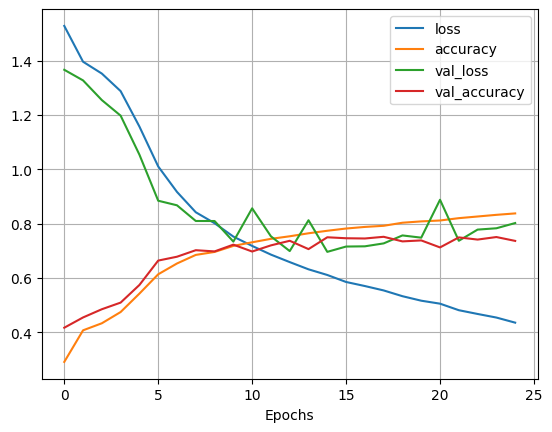

In [ ]:
#history_m5.history can also be used if defined above
losses_m5 = pd.DataFrame(model5.history.history).plot(xlabel="Epochs", grid=True);

In [ ]:
scores_m5 = model5.evaluate(test_image_gen)
print("Evaluation Accuracy: ", np.round(scores_m5[1],4))

71/71 [==============================] - 38s 533ms/step - loss: 0.6571 - accuracy: 0.7502
Evaluation Accuracy:  0.7502


In [ ]:
model5.save("Project_M5_v2 zip", save_format="tf")
# to download it from Colab to your computer
from google.colab import files
!zip -r Project_M5_v2.zip "Project_M5_v2 zip"/
files.download("Project_M5_v2.zip")

model5.save("Project_M5_v2", save_format="h5")
files.download("Project_M5_v2")

  adding: Project_M5_v2 zip/ (stored 0%)
  adding: Project_M5_v2 zip/variables/ (stored 0%)
  adding: Project_M5_v2 zip/variables/variables.data-00000-of-00001 (deflated 27%)
  adding: Project_M5_v2 zip/variables/variables.index (deflated 68%)
  adding: Project_M5_v2 zip/assets/ (stored 0%)
  adding: Project_M5_v2 zip/fingerprint.pb (stored 0%)
  adding: Project_M5_v2 zip/saved_model.pb (deflated 89%)
  adding: Project_M5_v2 zip/keras_metadata.pb (deflated 94%)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# Stage IV Models (M6-M9)

## Model M6

From this point, we will try to implement residual connections (as in ResNet) using Keras' functional API. Model M6 is modeled after ResNet.

In [ ]:
from sklearn.metrics import f1_score as f1
from tensorflow.keras import Model, Input
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPool2D, Dense, Flatten, Dropout, add, GlobalAveragePooling2D, BatchNormalization
from tensorflow.keras.utils import plot_model

from tensorflow.keras.initializers import he_normal #might want to switch to SELU and use LeCun
from tensorflow.keras.callbacks import EarlyStopping

# early stopping parameters
earlyStop6 = EarlyStopping(monitor='val_loss', mode='min',
                          verbose = 1, patience=10,
                          restore_best_weights=True)#could change the min_delta

#filters = number of feature maps created
#kernel = size of filter(7,7) deafault stride =1
#using RELU Activation
#padding set to same
#input shape is 512x512 pixel, 1=grayscale (3 for color/rbg img)

#CNN
inputs = Input(shape=(512,512,3))

x = Conv2D(filters=64, kernel_size=5,
            activation='relu', padding='same',)(inputs)
x = BatchNormalization()(x)
block_1_output = MaxPool2D(2)(x)

x = Conv2D(filters=64, kernel_size=3,
            activation='relu', padding='same',)(block_1_output)
x = Conv2D(filters=64, kernel_size=3,
            activation='relu', padding='same',)(x)
x = BatchNormalization()(x)

x = add([x,block_1_output])

block_2_output = Conv2D(filters=64, kernel_size=3,
            activation='relu', padding='same',)(x)
x = Conv2D(filters=64, kernel_size=3,
            activation='relu', padding='same',)(block_2_output)
x = Conv2D(filters=64, kernel_size=3,
            activation='relu', padding='same',)(x)
x = BatchNormalization()(x)

x = add([x,block_2_output])

block_3_output = Conv2D(filters=64, kernel_size=3,
            activation='relu', padding='same',)(x)
x = Conv2D(filters=64, kernel_size=3,
            activation='relu', padding='same',)(block_3_output)
x = Conv2D(filters=64, kernel_size=3,
            activation='relu', padding='same',)(x)
x = BatchNormalization()(x)

x = add([x,block_3_output])

block_4_output = Conv2D(filters=64, kernel_size=3,
            activation='relu', padding='same',)(x)
x = Conv2D(filters=64, kernel_size=3,
            activation='relu', padding='same',)(block_4_output)
x = Conv2D(filters=64, kernel_size=3,
            activation='relu', padding='same',)(x)
x = BatchNormalization()(x)

x = add([x,block_4_output])

block_5_output = Conv2D(filters=64, kernel_size=3,
            activation='relu', padding='same',)(x)
x = Conv2D(filters=64, kernel_size=3,
            activation='relu', padding='same',)(block_5_output)
x = Conv2D(filters=64, kernel_size=3,
            activation='relu', padding='same',)(x)
x = BatchNormalization()(x)

x = add([x,block_5_output])

block_6_output = Conv2D(filters=64, kernel_size=3,
            activation='relu', padding='same',)(x)
x = Conv2D(filters=64, kernel_size=3,
            activation='relu', padding='same',)(block_6_output)
x = Conv2D(filters=64, kernel_size=3,
            activation='relu', padding='same',)(x)
x = BatchNormalization()(x)

x = add([x,block_6_output])

# DNN
x = GlobalAveragePooling2D()(x)
x = Dense(256,activation="relu")(x)
x = Dropout(0.5)(x)
#x = Dense(64,activation="relu")(x)
#x = Dropout(0.5)(x)
outputs = Dense(5, activation="softmax")(x)

model6 = Model(inputs, outputs)

model6.compile(loss='categorical_crossentropy',  #cat_ent for one-hot encoding classification problem
               optimizer='adam',
               metrics = ["accuracy"])

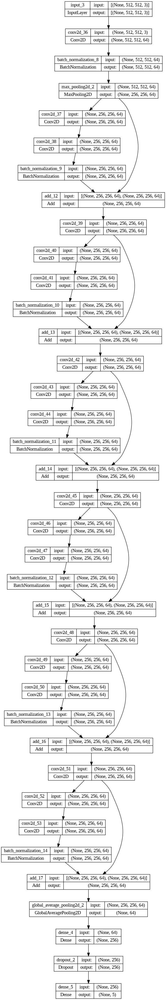

In [ ]:
plot_model(model6, "M6.png", show_shapes=True)

In [ ]:
model6.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 512, 512, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_36 (Conv2D)             (None, 512, 512, 64  4864        ['input_3[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization_8 (BatchNo  (None, 512, 512, 64  256        ['conv2d_36[0][0]']              
 rmalization)                   )                                                           

In [ ]:
history6 = model6.fit(train_image_gen,
                     validation_data = valid_image_gen,
                     callbacks =[earlyStop6], epochs =30)

Epoch 1/30
563/563 [==============================] - 328s 563ms/step - loss: 1.3510 - accuracy: 0.4376 - val_loss: 1.4550 - val_accuracy: 0.3942
Epoch 2/30
563/563 [==============================] - 313s 555ms/step - loss: 1.0261 - accuracy: 0.5966 - val_loss: 1.8383 - val_accuracy: 0.4311
Epoch 3/30
563/563 [==============================] - 314s 557ms/step - loss: 0.8925 - accuracy: 0.6499 - val_loss: 0.9285 - val_accuracy: 0.6502
Epoch 4/30
563/563 [==============================] - 313s 556ms/step - loss: 0.7980 - accuracy: 0.6971 - val_loss: 0.7537 - val_accuracy: 0.7129
Epoch 5/30
563/563 [==============================] - 319s 565ms/step - loss: 0.7427 - accuracy: 0.7176 - val_loss: 0.7746 - val_accuracy: 0.7093
Epoch 6/30
563/563 [==============================] - 315s 560ms/step - loss: 0.6883 - accuracy: 0.7414 - val_loss: 0.6923 - val_accuracy: 0.7378
Epoch 7/30
563/563 [==============================] - 314s 557ms/step - loss: 0.6550 - accuracy: 0.7502 - val_loss: 0.9063 -

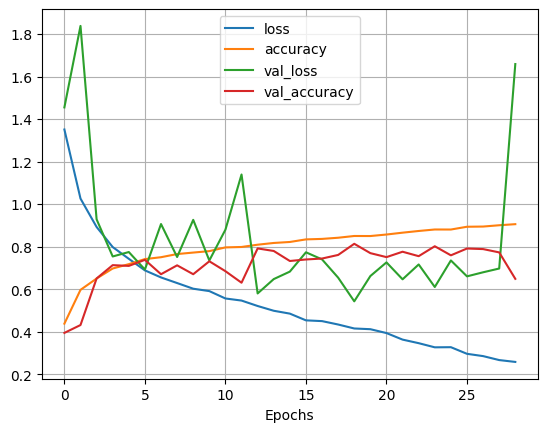

In [ ]:
losses_m6 = pd.DataFrame(model6.history.history).plot(xlabel="Epochs", grid=True);

In [ ]:
scores_m6 = model6.evaluate(test_image_gen)
print("Evaluation Accuracy: ", np.round(scores_m6[1],4))

71/71 [==============================] - 35s 491ms/step - loss: 0.5187 - accuracy: 0.8089
Evaluation Accuracy:  0.8089


In [ ]:
!pip install visualkeras
import visualkeras
from collections import defaultdict

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 992.0/992.0 kB 16.2 MB/s eta 0:00:00


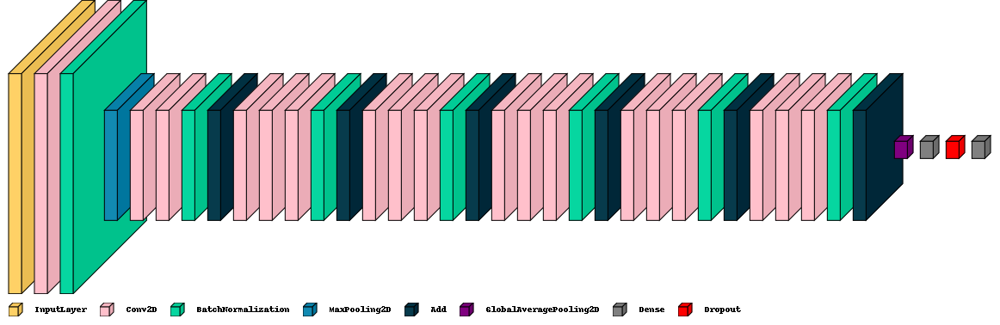

In [ ]:
color_map = defaultdict(dict)
color_map[Dropout]['fill'] = 'red'
color_map[GlobalAveragePooling2D]['fill'] = 'purple'
color_map[Dense]['fill'] = 'gray'
color_map[Conv2D]['fill'] = 'pink'

visualkeras.layered_view(model6, legend=True, scale_xy=0.5, scale_z=0.5, max_z=15, spacing=15, draw_funnel=False, draw_volume=True, color_map=color_map).show() # display using your system viewer

In [ ]:
model6.save("Project_M6 zip", save_format="tf")
# to download it from Colab to your computer
from google.colab import files
!zip -r Project_M6.zip "Project_M6 zip"/
files.download("Project_M6.zip")

model6.save("Project_M6", save_format="h5")
files.download("Project_M6")

  adding: Project_M6 zip/ (stored 0%)
  adding: Project_M6 zip/assets/ (stored 0%)
  adding: Project_M6 zip/saved_model.pb (deflated 91%)
  adding: Project_M6 zip/variables/ (stored 0%)
  adding: Project_M6 zip/variables/variables.data-00000-of-00001 (deflated 7%)
  adding: Project_M6 zip/variables/variables.index (deflated 77%)
  adding: Project_M6 zip/keras_metadata.pb (deflated 95%)
  adding: Project_M6 zip/fingerprint.pb (stored 0%)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## Model M7

In [ ]:
from sklearn.metrics import f1_score as f1
from tensorflow.keras import Model, Input
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPool2D, Dense, Flatten, Dropout, add, GlobalAveragePooling2D, BatchNormalization, Activation
from tensorflow.keras.utils import plot_model

from tensorflow.keras.initializers import he_normal #might want to switch to SELU and use LeCun
from tensorflow.keras.callbacks import EarlyStopping

# early stopping parameters
earlyStop7 = EarlyStopping(monitor='val_loss', mode='min',
                          verbose = 1, patience=10,
                          restore_best_weights=True)#could change the min_delta

#filters = number of feature maps created
#kernel = size of filter(7,7) deafault stride =1
#using RELU Activation
#padding set to same
#input shape is 512x512 pixel, 1=grayscale (3 for color/rbg img)

#CNN
inputs = Input(shape=(512,512,3))

x = Conv2D(filters=32, kernel_size=5, padding='same',)(inputs)
x = BatchNormalization()(x)
x = Activation('relu')(x)
block_1_output = MaxPool2D(2)(x)

x = Conv2D(filters=32, kernel_size=3, padding='same',)(block_1_output)
x = BatchNormalization()(x)
x = Activation('relu')(x)
x = Conv2D(filters=32, kernel_size=3, padding='same',)(x)
x = BatchNormalization()(x)
x = Activation('relu')(x)

x = add([x,block_1_output])

block_2_output = Conv2D(filters=32, kernel_size=3, padding='same',)(x)
x = BatchNormalization()(x)
x = Activation('relu')(x)
x = Conv2D(filters=32, kernel_size=3, padding='same',)(block_2_output)
x = BatchNormalization()(x)
x = Activation('relu')(x)
x = Conv2D(filters=32, kernel_size=3,padding='same',)(x)
x = BatchNormalization()(x)
x = Activation('relu')(x)

x = add([x,block_2_output])

block_3_output = Conv2D(filters=64, kernel_size=3, padding='same',)(x)
x = BatchNormalization()(x)
x = Activation('relu')(x)
x = Conv2D(filters=64, kernel_size=3, padding='same',)(block_3_output)
x = BatchNormalization()(x)
x = Activation('relu')(x)
x = Conv2D(filters=64, kernel_size=3, padding='same',)(x)
x = BatchNormalization()(x)
x = Activation('relu')(x)

x = add([x,block_3_output])

block_4_output = Conv2D(filters=64, kernel_size=3, padding='same',)(x)
x = BatchNormalization()(x)
x = Activation('relu')(x)
x = Conv2D(filters=64, kernel_size=3, padding='same',)(block_4_output)
x = BatchNormalization()(x)
x = Activation('relu')(x)
x = Conv2D(filters=64, kernel_size=3, padding='same',)(x)
x = BatchNormalization()(x)
x = Activation('relu')(x)

x = add([x,block_4_output])

block_5_output = Conv2D(filters=128, kernel_size=3, padding='same',)(x)
x = BatchNormalization()(x)
x = Activation('relu')(x)
x = Conv2D(filters=128, kernel_size=3, padding='same',)(block_5_output)
x = BatchNormalization()(x)
x = Activation('relu')(x)
x = Conv2D(filters=128, kernel_size=3, padding='same',)(x)
x = BatchNormalization()(x)
x = Activation('relu')(x)
x = BatchNormalization()(x)
x = Activation('relu')(x)

x = add([x,block_5_output])

block_6_output = Conv2D(filters=128, kernel_size=3, padding='same',)(x)
x = BatchNormalization()(x)
x = Activation('relu')(x)
x = Conv2D(filters=128, kernel_size=3, padding='same',)(block_6_output)
x = BatchNormalization()(x)
x = Activation('relu')(x)
x = Conv2D(filters=128, kernel_size=3, padding='same',)(x)
x = BatchNormalization()(x)
x = Activation('relu')(x)

x = add([x,block_6_output])

# DNN
x = GlobalAveragePooling2D()(x)
x = Dense(256,activation="relu")(x)
x = Dropout(0.5)(x)
#x = Dense(64,activation="relu")(x)
#x = Dropout(0.5)(x)
outputs = Dense(5, activation="softmax")(x)

model7 = Model(inputs, outputs)

model7.compile(loss='categorical_crossentropy',  #cat_ent for one-hot encoding classification problem
               optimizer='nadam',
               metrics = ["accuracy"])

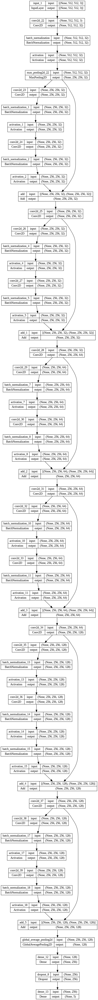

In [ ]:
plot_model(model7, "M7.png", show_shapes=True)

In [ ]:
model7.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 512, 512, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_36 (Conv2D)             (None, 512, 512, 32  2432        ['input_3[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization_38 (BatchN  (None, 512, 512, 32  128        ['conv2d_36[0][0]']              
 ormalization)                  )                                                           

In [ ]:
history7 = model7.fit(train_image_gen,
                     validation_data = valid_image_gen,
                     callbacks =[earlyStop7], epochs =30)

Epoch 1/30
1125/1125 [==============================] - 328s 276ms/step - loss: 1.3314 - accuracy: 0.4573 - val_loss: 1.5617 - val_accuracy: 0.4142
Epoch 2/30
1125/1125 [==============================] - 304s 270ms/step - loss: 1.0993 - accuracy: 0.5722 - val_loss: 1.5497 - val_accuracy: 0.4400
Epoch 3/30
1125/1125 [==============================] - 304s 270ms/step - loss: 1.0153 - accuracy: 0.6058 - val_loss: 2.0519 - val_accuracy: 0.3707
Epoch 4/30
1125/1125 [==============================] - 305s 271ms/step - loss: 0.9581 - accuracy: 0.6356 - val_loss: 1.9732 - val_accuracy: 0.4893
Epoch 5/30
1125/1125 [==============================] - 305s 271ms/step - loss: 0.9036 - accuracy: 0.6611 - val_loss: 1.0412 - val_accuracy: 0.6027
Epoch 6/30
1125/1125 [==============================] - 305s 271ms/step - loss: 0.8829 - accuracy: 0.6647 - val_loss: 1.1877 - val_accuracy: 0.5827
Epoch 7/30
1125/1125 [==============================] - 304s 270ms/step - loss: 0.8341 - accuracy: 0.6843 - val_

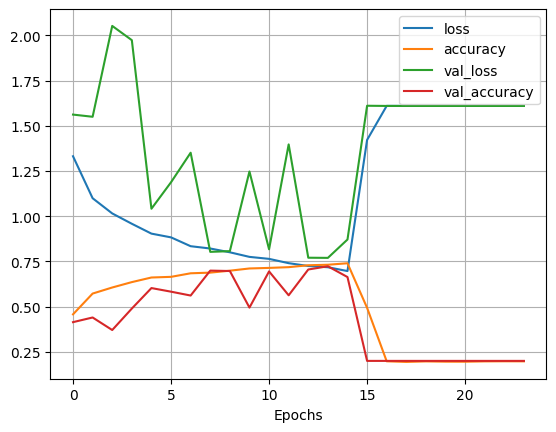

In [ ]:
losses_m7 = pd.DataFrame(model7.history.history).plot(xlabel="Epochs", grid=True);

In [ ]:
scores_m7 = model7.evaluate(test_image_gen)
print("Evaluation Accuracy: ", np.round(scores_m7[1],4))

141/141 [==============================] - 32s 226ms/step - loss: 0.7233 - accuracy: 0.7289
Evaluation Accuracy:  0.7289


In [ ]:
!pip install visualkeras
import visualkeras
from collections import defaultdict

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 992.0/992.0 kB 17.3 MB/s eta 0:00:00


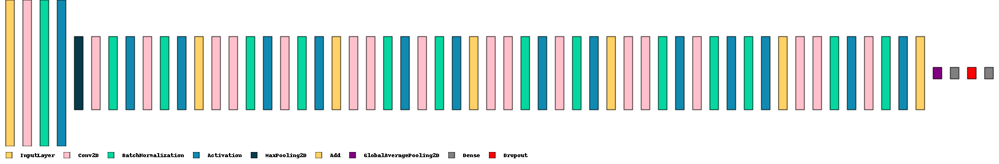

In [ ]:
color_map = defaultdict(dict)
color_map[Dropout]['fill'] = 'red'
color_map[GlobalAveragePooling2D]['fill'] = 'purple'
color_map[Dense]['fill'] = 'gray'
color_map[Conv2D]['fill'] = 'pink'

visualkeras.layered_view(model7, legend=True, scale_xy=0.5, scale_z=0.5, max_z=15, spacing=15, draw_funnel=False, draw_volume=False, color_map=color_map).show() # display using your system viewer

In [ ]:
model7.save("Project_M7 zip", save_format="tf")
# to download it from Colab to your computer
from google.colab import files
!zip -r Project_M7.zip "Project_M7 zip"/
files.download("Project_M7.zip")

model7.save("Project_M7", save_format="h5")
files.download("Project_M7")

  adding: Project_M7 zip/ (stored 0%)
  adding: Project_M7 zip/assets/ (stored 0%)
  adding: Project_M7 zip/saved_model.pb (deflated 91%)
  adding: Project_M7 zip/variables/ (stored 0%)
  adding: Project_M7 zip/variables/variables.data-00000-of-00001 (deflated 36%)
  adding: Project_M7 zip/variables/variables.index (deflated 77%)
  adding: Project_M7 zip/keras_metadata.pb (deflated 95%)
  adding: Project_M7 zip/fingerprint.pb (stored 0%)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## Model M8

In [ ]:
from sklearn.metrics import f1_score as f1
from tensorflow.keras import Model, Input
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPool2D, Dense, Flatten, Dropout, add, GlobalAveragePooling2D, BatchNormalization, Activation, LeakyReLU
from tensorflow.keras.utils import plot_model

from tensorflow.keras.initializers import he_normal #might want to switch to SELU and use LeCun
from tensorflow.keras.callbacks import EarlyStopping

# early stopping parameters
earlyStop8 = EarlyStopping(monitor='val_loss', mode='min',
                          verbose = 1, patience=10,
                          restore_best_weights=True)#could change the min_delta

#filters = number of feature maps created
#kernel = size of filter(7,7) deafault stride =1
#using RELU Activation
#padding set to same
#input shape is 512x512 pixel, 1=grayscale (3 for color/rbg img)

#CNN
inputs = Input(shape=(512,512,3))

x = Conv2D(filters=64, kernel_size=5, padding='same',)(inputs)
x = BatchNormalization()(x)
x = LeakyReLU()(x)
block_1_output = MaxPool2D(2)(x)
block_1_output_2 = BatchNormalization()(block_1_output)
block_1_output_2 = LeakyReLU()(block_1_output_2)

x = Conv2D(filters=64, kernel_size=3, padding='same',)(block_1_output)
x = BatchNormalization()(x)
x = LeakyReLU()(x)
x = Conv2D(filters=64, kernel_size=3, padding='same',)(x)
x = BatchNormalization()(x)
x = LeakyReLU()(x)

x = add([x,block_1_output_2])

block_2_output = Conv2D(filters=64, kernel_size=3, padding='same',)(x)
block_2_output_2 = BatchNormalization()(block_2_output)
block_2_output_2 = LeakyReLU()(block_2_output_2)

x = BatchNormalization()(x)
x = LeakyReLU()(x)
x = Conv2D(filters=64, kernel_size=3, padding='same',)(block_2_output)
x = BatchNormalization()(x)
x = LeakyReLU()(x)
x = Conv2D(filters=64, kernel_size=3,padding='same',)(x)
x = BatchNormalization()(x)
x = LeakyReLU()(x)

x = add([x,block_2_output_2])

block_3_output = Conv2D(filters=64, kernel_size=3, padding='same',)(x)
block_3_output_2 = BatchNormalization()(block_3_output)
block_3_output_2 = Activation('relu')(block_3_output_2)

x = BatchNormalization()(x)
x = LeakyReLU()(x)
x = Conv2D(filters=64, kernel_size=3, padding='same',)(block_3_output)
x = BatchNormalization()(x)
x = LeakyReLU()(x)
x = Conv2D(filters=64, kernel_size=3, padding='same',)(x)
x = BatchNormalization()(x)
x = LeakyReLU()(x)

x = add([x,block_3_output_2])

block_4_output = Conv2D(filters=64, kernel_size=3, padding='same',)(x)
block_4_output_2 = BatchNormalization()(block_4_output)
block_4_output_2 = Activation('relu')(block_4_output_2)

x = BatchNormalization()(x)
x = LeakyReLU()(x)
x = Conv2D(filters=64, kernel_size=3, padding='same',)(block_4_output)
x = BatchNormalization()(x)
x = LeakyReLU()(x)
x = Conv2D(filters=64, kernel_size=3, padding='same',)(x)
x = BatchNormalization()(x)
x = LeakyReLU()(x)

x = add([x,block_4_output_2])

block_5_output = Conv2D(filters=64, kernel_size=3, padding='same',)(x)
block_5_output_2 = BatchNormalization()(block_5_output)
block_5_output_2 = Activation('relu')(block_5_output_2)

x = BatchNormalization()(x)
x = LeakyReLU()(x)
x = Conv2D(filters=64, kernel_size=3, padding='same',)(block_5_output)
x = BatchNormalization()(x)
x = LeakyReLU()(x)
x = Conv2D(filters=64, kernel_size=3, padding='same',)(x)
x = BatchNormalization()(x)
x = LeakyReLU()(x)
x = BatchNormalization()(x)
x = LeakyReLU()(x)

x = add([x,block_5_output_2])

block_6_output = Conv2D(filters=64, kernel_size=3, padding='same',)(x)
block_6_output_2 = BatchNormalization()(block_6_output)
block_6_output_2 = LeakyReLU()(block_6_output_2)

x = BatchNormalization()(x)
x = LeakyReLU()(x)
x = Conv2D(filters=64, kernel_size=3, padding='same',)(block_6_output)
x = BatchNormalization()(x)
x = LeakyReLU()(x)
x = Conv2D(filters=64, kernel_size=3, padding='same',)(x)
x = BatchNormalization()(x)
x = LeakyReLU()(x)

x = add([x,block_6_output_2])

# DNN
x = GlobalAveragePooling2D()(x)
x = Dense(256,activation="relu")(x)
x = Dropout(0.5)(x)
#x = Dense(64,activation="relu")(x)
#x = Dropout(0.5)(x)
outputs = Dense(5, activation="softmax")(x)

model8 = Model(inputs, outputs)

model8.compile(loss='categorical_crossentropy',  #cat_ent for one-hot encoding classification problem
               optimizer='nadam',
               metrics = ["accuracy"])

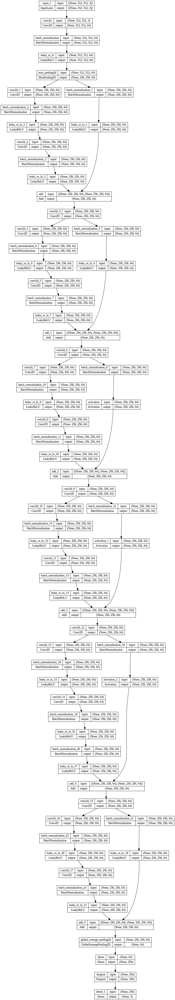

In [ ]:
plot_model(model8, "M8.png", show_shapes=True)

In [ ]:
!pip install visualkeras
import visualkeras
from collections import defaultdict

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 992.0/992.0 kB 53.4 MB/s eta 0:00:00


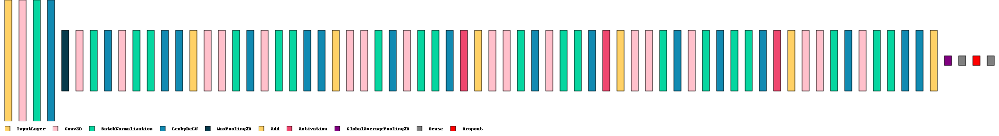

In [ ]:
color_map = defaultdict(dict)
color_map[Dropout]['fill'] = 'red'
color_map[GlobalAveragePooling2D]['fill'] = 'purple'
color_map[Dense]['fill'] = 'gray'
color_map[Conv2D]['fill'] = 'pink'

visualkeras.layered_view(model8, legend=True, scale_xy=0.5, scale_z=0.5, max_z=15, spacing=15, draw_funnel=False, draw_volume=False, color_map=color_map).show() # display using your system viewer

In [ ]:
model8.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 512, 512, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 512, 512, 64  4864        ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 512, 512, 64  256        ['conv2d[0][0]']                 
 alization)                     )                                                             

In [ ]:
history8 = model8.fit(train_image_gen,
                     validation_data = valid_image_gen,
                     callbacks =[earlyStop8], epochs =30)

Epoch 1/30
563/563 [==============================] - 356s 573ms/step - loss: 1.3907 - accuracy: 0.4191 - val_loss: 4.5618 - val_accuracy: 0.2711
Epoch 2/30
563/563 [==============================] - 320s 568ms/step - loss: 1.1809 - accuracy: 0.5288 - val_loss: 2.0977 - val_accuracy: 0.3093
Epoch 3/30
563/563 [==============================] - 320s 567ms/step - loss: 1.0299 - accuracy: 0.5963 - val_loss: 1.5640 - val_accuracy: 0.4573
Epoch 4/30
563/563 [==============================] - 320s 567ms/step - loss: 0.9272 - accuracy: 0.6418 - val_loss: 1.3345 - val_accuracy: 0.4769
Epoch 5/30
563/563 [==============================] - 320s 568ms/step - loss: 0.8665 - accuracy: 0.6639 - val_loss: 1.3717 - val_accuracy: 0.5569
Epoch 6/30
563/563 [==============================] - 320s 568ms/step - loss: 0.8193 - accuracy: 0.6849 - val_loss: 1.1699 - val_accuracy: 0.5471
Epoch 7/30
563/563 [==============================] - 318s 564ms/step - loss: 0.7812 - accuracy: 0.6999 - val_loss: 0.8614 -

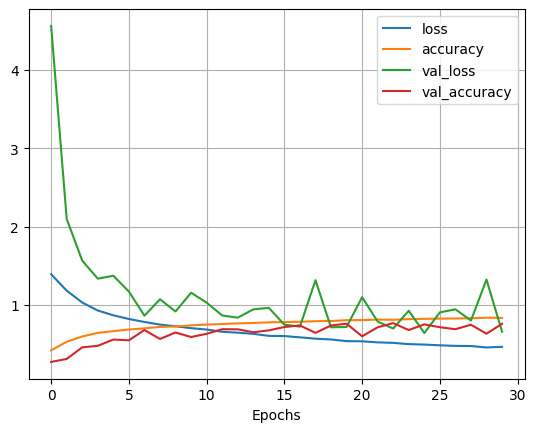

In [ ]:
losses_m8 = pd.DataFrame(model8.history.history).plot(xlabel="Epochs", grid=True);

In [ ]:
scores_m8 = model8.evaluate(test_image_gen)
print("Evaluation Accuracy: ", np.round(scores_m8[1],4))

71/71 [==============================] - 35s 487ms/step - loss: 0.6508 - accuracy: 0.7596
Evaluation Accuracy:  0.7596


In [ ]:
model8.save("Project_M8 zip", save_format="tf")
# to download it from Colab to your computer
from google.colab import files
!zip -r Project_M8.zip "Project_M8 zip"/
files.download("Project_M8.zip")

model8.save("Project_M8", save_format="h5")
files.download("Project_M8")

  adding: Project_M8 zip/ (stored 0%)
  adding: Project_M8 zip/assets/ (stored 0%)
  adding: Project_M8 zip/saved_model.pb (deflated 91%)
  adding: Project_M8 zip/variables/ (stored 0%)
  adding: Project_M8 zip/variables/variables.data-00000-of-00001 (deflated 8%)
  adding: Project_M8 zip/variables/variables.index (deflated 79%)
  adding: Project_M8 zip/keras_metadata.pb (deflated 94%)
  adding: Project_M8 zip/fingerprint.pb (stored 0%)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## Model M9

The runtime for this model was disconnected before it could complete. The final output can be found in Muhammad's notebook instead.

In [ ]:
from sklearn.metrics import f1_score as f1
from tensorflow.keras import Model, Input
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPool2D, Dense, Flatten, Dropout, add, GlobalAveragePooling2D, BatchNormalization, Activation, LeakyReLU
from tensorflow.keras.utils import plot_model

from tensorflow.keras.initializers import he_normal #might want to switch to SELU and use LeCun
from tensorflow.keras.callbacks import EarlyStopping
from numpy.random import randint, choice

randomArray = randint(100,size = 19)

# early stopping parameters
earlyStop9 = EarlyStopping(monitor='val_loss', mode='min',
                          verbose = 1, patience=10,
                          restore_best_weights=True)#could change the min_delta

#filters = number of feature maps created
#kernel = size of filter(7,7) deafault stride =1
#using RELU Activation
#padding set to same
#input shape is 512x512 pixel, 1=grayscale (3 for color/rbg img)

#CNN
inputs = Input(shape=(512,512,3))

x = Conv2D(filters=64, kernel_size=5, padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(inputs)
x = BatchNormalization()(x)
x = LeakyReLU()(x)
block_1_output = MaxPool2D(2)(x)
block_1_output_2 = BatchNormalization()(block_1_output)
block_1_output_2 = LeakyReLU()(block_1_output_2)

x = Conv2D(filters=64, kernel_size=3, padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(block_1_output)
x = BatchNormalization()(x)
x = LeakyReLU()(x)
x = Conv2D(filters=64, kernel_size=3, padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(x)
x = BatchNormalization()(x)
x = LeakyReLU()(x)

x = add([x,block_1_output_2])

block_2_output = Conv2D(filters=64, kernel_size=3, padding='same',
                        kernel_initializer = he_normal(seed = choice(randomArray)))(x)
block_2_output_2 = BatchNormalization()(block_2_output)
block_2_output_2 = LeakyReLU()(block_2_output_2)

x = BatchNormalization()(x)
x = LeakyReLU()(x)
x = Conv2D(filters=64, kernel_size=3, padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(block_2_output)
x = BatchNormalization()(x)
x = LeakyReLU()(x)
x = Conv2D(filters=64, kernel_size=3,padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(x)
x = BatchNormalization()(x)
x = LeakyReLU()(x)

x = add([x,block_2_output_2])

block_3_output = Conv2D(filters=64, kernel_size=3, padding='same',
                        kernel_initializer = he_normal(seed = choice(randomArray)))(x)
block_3_output_2 = BatchNormalization()(block_3_output)
block_3_output_2 = LeakyReLU()(block_3_output_2)

x = BatchNormalization()(x)
x = LeakyReLU()(x)
x = Conv2D(filters=64, kernel_size=3, padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(block_3_output)
x = BatchNormalization()(x)
x = LeakyReLU()(x)
x = Conv2D(filters=64, kernel_size=3, padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(x)
x = BatchNormalization()(x)
x = LeakyReLU()(x)

x = add([x,block_3_output_2])

block_4_output = Conv2D(filters=64, kernel_size=3, padding='same',
                        kernel_initializer = he_normal(seed = choice(randomArray)))(x)
block_4_output_2 = BatchNormalization()(block_4_output)
block_4_output_2 = LeakyReLU()(block_4_output_2)

x = BatchNormalization()(x)
x = LeakyReLU()(x)
x = Conv2D(filters=64, kernel_size=3, padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(block_4_output)
x = BatchNormalization()(x)
x = LeakyReLU()(x)
x = Conv2D(filters=64, kernel_size=3, padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(x)
x = BatchNormalization()(x)
x = LeakyReLU()(x)

x = add([x,block_4_output_2])

block_5_output = Conv2D(filters=64, kernel_size=3, padding='same',
                        kernel_initializer = he_normal(seed = choice(randomArray)))(x)
block_5_output_2 = BatchNormalization()(block_5_output)
block_5_output_2 = LeakyReLU()(block_5_output_2)

x = BatchNormalization()(x)
x = LeakyReLU()(x)
x = Conv2D(filters=64, kernel_size=3, padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(block_5_output)
x = BatchNormalization()(x)
x = LeakyReLU()(x)
x = Conv2D(filters=64, kernel_size=3, padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(x)
x = BatchNormalization()(x)
x = LeakyReLU()(x)

x = add([x,block_5_output_2])

block_6_output = Conv2D(filters=64, kernel_size=3, padding='same',
                        kernel_initializer = he_normal(seed = choice(randomArray)))(x)
block_6_output_2 = BatchNormalization()(block_6_output)
block_6_output_2 = LeakyReLU()(block_6_output_2)

x = BatchNormalization()(x)
x = LeakyReLU()(x)
x = Conv2D(filters=64, kernel_size=3, padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(block_6_output)
x = BatchNormalization()(x)
x = LeakyReLU()(x)
x = Conv2D(filters=64, kernel_size=3, padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(x)
x = BatchNormalization()(x)
x = LeakyReLU()(x)

x = add([x,block_6_output_2])

# DNN
x = GlobalAveragePooling2D()(x)
x = Dense(256, kernel_initializer = he_normal(seed = choice(randomArray)))(x)
x = LeakyReLU()(x)
x = Dropout(0.5)(x)
outputs = Dense(5, activation="softmax")(x)

model9 = Model(inputs, outputs)

model9.compile(loss='categorical_crossentropy',  #cat_ent for one-hot encoding classification problem
               optimizer='nadam',
               metrics = ["accuracy"])

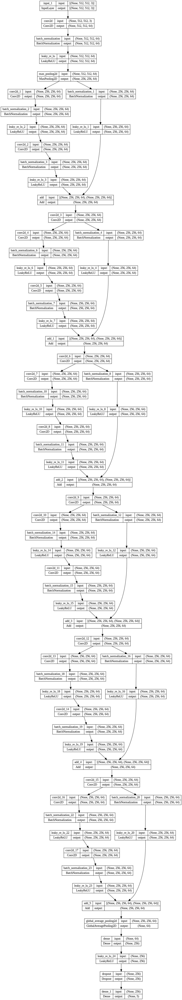

In [ ]:
plot_model(model9, "M9.png", show_shapes=True)

In [ ]:
!pip install visualkeras
import visualkeras
from collections import defaultdict

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 992.0/992.0 kB 52.2 MB/s eta 0:00:00


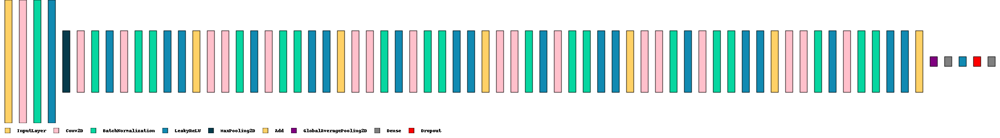

In [ ]:
color_map = defaultdict(dict)
color_map[Dropout]['fill'] = 'red'
color_map[GlobalAveragePooling2D]['fill'] = 'purple'
color_map[Dense]['fill'] = 'gray'
color_map[Conv2D]['fill'] = 'pink'

visualkeras.layered_view(model9, legend=True, scale_xy=0.5, scale_z=0.5, max_z=15, spacing=15, draw_funnel=False, draw_volume=False, color_map=color_map).show() # display using your system viewer

In [ ]:
model9.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 512, 512, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 512, 512, 64  4864        ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 512, 512, 64  256        ['conv2d[0][0]']                 
 alization)                     )                                                             

In [ ]:
history9 = model9.fit(train_image_gen,
                     validation_data = valid_image_gen,
                     callbacks =[earlyStop9], epochs =30)

Epoch 1/30
563/563 [==============================] - 1421s 2s/step - loss: 1.4233 - accuracy: 0.3902 - val_loss: 2.4857 - val_accuracy: 0.3244
Epoch 2/30
563/563 [==============================] - 1390s 2s/step - loss: 1.1914 - accuracy: 0.5192 - val_loss: 1.6787 - val_accuracy: 0.4582
Epoch 3/30
563/563 [==============================] - 1382s 2s/step - loss: 1.0892 - accuracy: 0.5608 - val_loss: 1.2022 - val_accuracy: 0.5284
Epoch 4/30
563/563 [==============================] - 1386s 2s/step - loss: 1.0452 - accuracy: 0.5852 - val_loss: 1.0615 - val_accuracy: 0.5822
Epoch 5/30
563/563 [==============================] - 1383s 2s/step - loss: 1.0082 - accuracy: 0.6067 - val_loss: 1.0961 - val_accuracy: 0.5782
Epoch 6/30
563/563 [==============================] - 1388s 2s/step - loss: 0.9761 - accuracy: 0.6128 - val_loss: 1.4001 - val_accuracy: 0.5102
Epoch 7/30
563/563 [==============================] - 1389s 2s/step - loss: 0.9586 - accuracy: 0.6213 - val_loss: 3.5300 - val_accuracy:

In [ ]:
losses_m9 = pd.DataFrame(model9.history.history).plot(xlabel="Epochs", grid=True);

In [ ]:
scores_m9 = model9.evaluate(test_image_gen)
print("Evaluation Accuracy: ", np.round(scores_m9[1],4))

In [ ]:
model9.save("Project_M9 zip", save_format="tf")
# to download it from Colab to your computer
from google.colab import files
!zip -r Project_M9.zip "Project_M9 zip"/
files.download("Project_M9.zip")

model9.save("Project_M9", save_format="h5")
files.download("Project_M9")

# Stage V Models (M10-M20)

## Model M10

Based on Professor Ligorio's suggestions, model 6 was modified thus:
1. The dense layer of 256 units following the GlobalAveragePooling2D layer was removed.
2. MaxPooling2D layers were added in between convolutional layers.

In [ ]:
from sklearn.metrics import f1_score as f1
from tensorflow.keras import Model, Input
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPool2D, Dense, Flatten, Dropout, add, GlobalAveragePooling2D, BatchNormalization
from tensorflow.keras.utils import plot_model
from tensorflow.keras.callbacks import ModelCheckpoint

from tensorflow.keras.initializers import he_normal #might want to switch to SELU and use LeCun
from tensorflow.keras.callbacks import EarlyStopping
from numpy.random import randint, choice

randomArray = randint(100,size = 18)

# early stopping parameters
earlyStop10 = EarlyStopping(monitor='val_loss', mode='min',
                          verbose = 1, patience=10,
                          restore_best_weights=True)#could change the min_delta

# model checkpoint
checkpoint_filepath = '/content/drive/My Drive/Deep Learning project/model.hdf5'
model_checkpoint = ModelCheckpoint(
    filepath=checkpoint_filepath,
    save_weights_only=True,
    monitor='val_loss',
    mode='min',
    save_best_only=True)


#filters = number of feature maps created
#kernel = size of filter(7,7) deafault stride =1
#using RELU Activation
#padding set to same
#input shape is 512x512 pixel, 1=grayscale (3 for color/rbg img)

#CNN
inputs = Input(shape=(512,512,3))

x = Conv2D(filters=64, kernel_size=5, activation='relu', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(inputs)
x = BatchNormalization()(x)
block_1_output = MaxPool2D(2)(x)

x = Conv2D(filters=64, kernel_size=3, activation='relu', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(block_1_output)
x = Conv2D(filters=64, kernel_size=3, activation='relu', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(x)

x = add([x,block_1_output])
x = BatchNormalization()(x)
x = MaxPool2D(2)(x)

block_2_output = Conv2D(filters=64, kernel_size=3, activation='relu', padding='same',
                        kernel_initializer = he_normal(seed = choice(randomArray)))(x)
x = Conv2D(filters=64, kernel_size=3, activation='relu', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(block_2_output)
x = Conv2D(filters=64, kernel_size=3, activation='relu', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(x)

x = add([x,block_2_output])
x = BatchNormalization()(x)
x = MaxPool2D(2)(x)

block_3_output = Conv2D(filters=64, kernel_size=3, activation='relu', padding='same',
                        kernel_initializer = he_normal(seed = choice(randomArray)))(x)
x = Conv2D(filters=64, kernel_size=3, activation='relu', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(block_3_output)
x = Conv2D(filters=64, kernel_size=3, activation='relu', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(x)

x = add([x,block_3_output])
x = BatchNormalization()(x)
x = MaxPool2D(2)(x)

block_4_output = Conv2D(filters=64, kernel_size=3, activation='relu', padding='same',
                        kernel_initializer = he_normal(seed = choice(randomArray)))(x)
x = Conv2D(filters=64, kernel_size=3, activation='relu', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(block_4_output)
x = Conv2D(filters=64, kernel_size=3, activation='relu', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(x)

x = add([x,block_4_output])
x = BatchNormalization()(x)
x = MaxPool2D(2)(x)

block_5_output = Conv2D(filters=64, kernel_size=3, activation='relu', padding='same',
                        kernel_initializer = he_normal(seed = choice(randomArray)))(x)
x = Conv2D(filters=64, kernel_size=3, activation='relu', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(block_5_output)
x = Conv2D(filters=64, kernel_size=3, activation='relu', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(x)

x = add([x,block_5_output])
x = BatchNormalization()(x)
x = MaxPool2D(2)(x)

block_6_output = Conv2D(filters=64, kernel_size=3, activation='relu', padding='same',
                        kernel_initializer = he_normal(seed = choice(randomArray)))(x)
x = Conv2D(filters=64, kernel_size=3, activation='relu', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(block_6_output)
x = Conv2D(filters=64, kernel_size=3, activation='relu', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(x)

x = add([x,block_6_output])
x = BatchNormalization()(x)
x = MaxPool2D(2)(x)

# DNN
x = GlobalAveragePooling2D()(x)
x = Dropout(0.5)(x)
#x = Dense(64,activation="relu")(x)
#x = Dropout(0.5)(x)
outputs = Dense(5, activation="softmax")(x)

model10 = Model(inputs, outputs)

model10.compile(loss='categorical_crossentropy',  #cat_ent for one-hot encoding classification problem
               optimizer='adam',
               metrics = ["accuracy"])

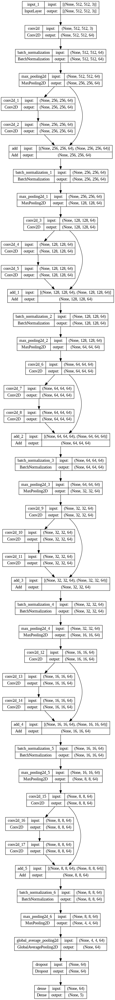

In [ ]:
plot_model(model10, "M10.png", show_shapes=True)

In [ ]:
model10.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 512, 512, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 512, 512, 64  4864        ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 512, 512, 64  256        ['conv2d[0][0]']                 
 alization)                     )                                                             

In [ ]:
!pip install visualkeras
import visualkeras
from collections import defaultdict

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 992.0/992.0 kB 36.9 MB/s eta 0:00:00


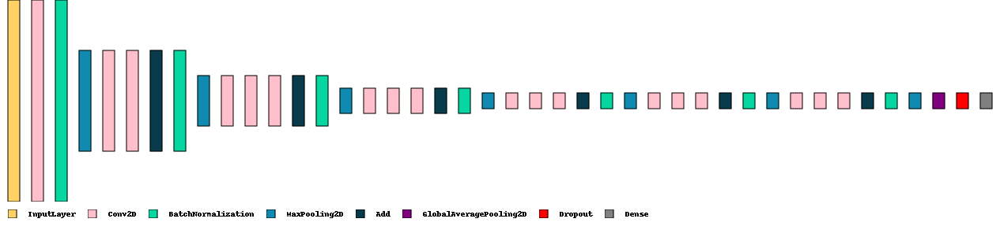

In [ ]:
color_map = defaultdict(dict)
color_map[Dropout]['fill'] = 'red'
color_map[GlobalAveragePooling2D]['fill'] = 'purple'
color_map[Dense]['fill'] = 'gray'
color_map[Conv2D]['fill'] = 'pink'

visualkeras.layered_view(model10, legend=True, scale_xy=0.5, scale_z=0.5, max_z=15, spacing=15, draw_funnel=False, draw_volume=False, color_map=color_map).show() # display using your system viewer

In [ ]:
history10 = model10.fit(train_image_gen,
                     validation_data = valid_image_gen,
                     callbacks =[earlyStop10, model_checkpoint], epochs =30)

Epoch 1/30
563/563 [==============================] - 440s 737ms/step - loss: 1.2600 - accuracy: 0.5144 - val_loss: 1.1527 - val_accuracy: 0.5391
Epoch 2/30
563/563 [==============================] - 403s 715ms/step - loss: 0.7818 - accuracy: 0.7027 - val_loss: 0.8603 - val_accuracy: 0.6542
Epoch 3/30
563/563 [==============================] - 404s 716ms/step - loss: 0.6432 - accuracy: 0.7639 - val_loss: 0.7470 - val_accuracy: 0.7107
Epoch 4/30
563/563 [==============================] - 401s 711ms/step - loss: 0.5534 - accuracy: 0.7976 - val_loss: 0.6282 - val_accuracy: 0.7582
Epoch 5/30
563/563 [==============================] - 404s 717ms/step - loss: 0.5057 - accuracy: 0.8167 - val_loss: 0.7002 - val_accuracy: 0.7391
Epoch 6/30
563/563 [==============================] - 404s 717ms/step - loss: 0.4546 - accuracy: 0.8356 - val_loss: 0.6716 - val_accuracy: 0.7658
Epoch 7/30
563/563 [==============================] - 404s 717ms/step - loss: 0.4012 - accuracy: 0.8554 - val_loss: 0.6236 -

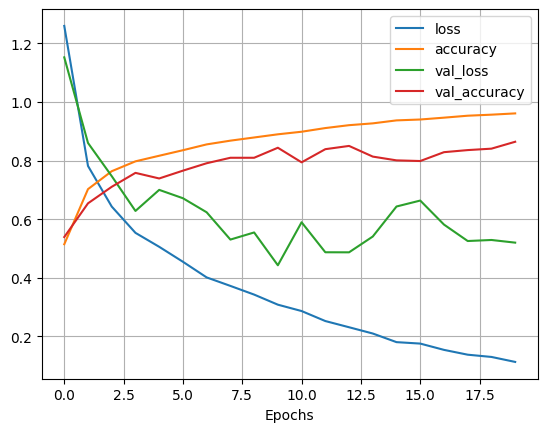

In [ ]:
losses_m10 = pd.DataFrame(model10.history.history).plot(xlabel="Epochs", grid=True);

In [ ]:
scores_m10 = model10.evaluate(test_image_gen)
print("Evaluation Accuracy: ", np.round(scores_m10[1],4))

71/71 [==============================] - 41s 571ms/step - loss: 0.4130 - accuracy: 0.8564
Evaluation Accuracy:  0.8564


In [ ]:
model10.save("Project_M10 zip", save_format="tf")
# to download it from Colab to your computer
from google.colab import files
!zip -r Project_M10.zip "Project_M10 zip"/
files.download("Project_M10.zip")

model10.save("Project_M10", save_format="h5")
files.download("Project_M10")

  adding: Project_M10 zip/ (stored 0%)
  adding: Project_M10 zip/fingerprint.pb (stored 0%)
  adding: Project_M10 zip/assets/ (stored 0%)
  adding: Project_M10 zip/saved_model.pb (deflated 91%)
  adding: Project_M10 zip/variables/ (stored 0%)
  adding: Project_M10 zip/variables/variables.data-00000-of-00001 (deflated 7%)
  adding: Project_M10 zip/variables/variables.index (deflated 77%)
  adding: Project_M10 zip/keras_metadata.pb (deflated 95%)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## Model M11

This model uses the M10 architecture with a change in the number of filters per convolution layer from 64 per layer to 32/64/128 per layer.

In [ ]:
from sklearn.metrics import f1_score as f1
from tensorflow.keras import Model, Input
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPool2D, Dense, Flatten, Dropout, add, GlobalAveragePooling2D, BatchNormalization
from tensorflow.keras.utils import plot_model
from tensorflow.keras.callbacks import ModelCheckpoint

from tensorflow.keras.initializers import he_normal #might want to switch to SELU and use LeCun
from tensorflow.keras.callbacks import EarlyStopping
from numpy.random import randint, choice

randomArray = randint(100,size = 18)

# early stopping parameters
earlyStop11 = EarlyStopping(monitor='val_loss', mode='min',
                          verbose = 1, patience=10,
                          restore_best_weights=True)#could change the min_delta

# model checkpoint
checkpoint_filepath = '/content/drive/My Drive/Deep Learning project/model11.hdf5'
model_checkpoint = ModelCheckpoint(
    filepath=checkpoint_filepath,
    save_weights_only=True,
    monitor='val_loss',
    mode='min',
    save_best_only=True)


#filters = number of feature maps created
#kernel = size of filter(7,7) deafault stride =1
#using RELU Activation
#padding set to same
#input shape is 512x512 pixel, 1=grayscale (3 for color/rbg img)

#CNN
inputs = Input(shape=(512,512,3))

x = Conv2D(filters=32, kernel_size=5, activation='relu', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(inputs)
x = BatchNormalization()(x)
block_1_output = MaxPool2D(2)(x)

x = Conv2D(filters=32, kernel_size=3, activation='relu', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(block_1_output)
x = Conv2D(filters=32, kernel_size=3, activation='relu', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(x)

x = add([x,block_1_output])
x = BatchNormalization()(x)
x = MaxPool2D(2)(x)

block_2_output = Conv2D(filters=32, kernel_size=3, activation='relu', padding='same',
                        kernel_initializer = he_normal(seed = choice(randomArray)))(x)
x = Conv2D(filters=32, kernel_size=3, activation='relu', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(block_2_output)
x = Conv2D(filters=32, kernel_size=3, activation='relu', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(x)

x = add([x,block_2_output])
x = BatchNormalization()(x)
x = MaxPool2D(2)(x)

block_3_output = Conv2D(filters=64, kernel_size=3, activation='relu', padding='same',
                        kernel_initializer = he_normal(seed = choice(randomArray)))(x)
x = Conv2D(filters=64, kernel_size=3, activation='relu', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(block_3_output)
x = Conv2D(filters=64, kernel_size=3, activation='relu', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(x)

x = add([x,block_3_output])
x = BatchNormalization()(x)
x = MaxPool2D(2)(x)

block_4_output = Conv2D(filters=64, kernel_size=3, activation='relu', padding='same',
                        kernel_initializer = he_normal(seed = choice(randomArray)))(x)
x = Conv2D(filters=64, kernel_size=3, activation='relu', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(block_4_output)
x = Conv2D(filters=64, kernel_size=3, activation='relu', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(x)

x = add([x,block_4_output])
x = BatchNormalization()(x)
x = MaxPool2D(2)(x)

block_5_output = Conv2D(filters=128, kernel_size=3, activation='relu', padding='same',
                        kernel_initializer = he_normal(seed = choice(randomArray)))(x)
x = Conv2D(filters=128, kernel_size=3, activation='relu', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(block_5_output)
x = Conv2D(filters=128, kernel_size=3, activation='relu', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(x)

x = add([x,block_5_output])
x = BatchNormalization()(x)
x = MaxPool2D(2)(x)

block_6_output = Conv2D(filters=128, kernel_size=3, activation='relu', padding='same',
                        kernel_initializer = he_normal(seed = choice(randomArray)))(x)
x = Conv2D(filters=128, kernel_size=3, activation='relu', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(block_6_output)
x = Conv2D(filters=128, kernel_size=3, activation='relu', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(x)

x = add([x,block_6_output])
x = BatchNormalization()(x)
x = MaxPool2D(2)(x)

# DNN
x = GlobalAveragePooling2D()(x)
x = Dropout(0.5)(x)
#x = Dense(64,activation="relu")(x)
#x = Dropout(0.5)(x)
outputs = Dense(5, activation="softmax")(x)

model11 = Model(inputs, outputs)

model11.compile(loss='categorical_crossentropy',  #cat_ent for one-hot encoding classification problem
               optimizer='adam',
               metrics = ["accuracy"])

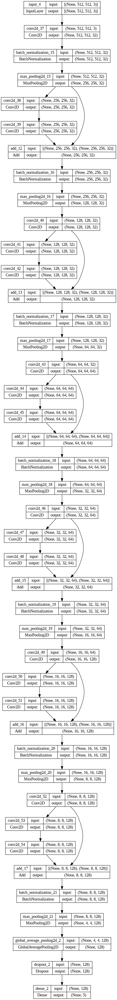

In [ ]:
plot_model(model11, "M11.png", show_shapes=True)

In [ ]:
model11.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_4 (InputLayer)           [(None, 512, 512, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_37 (Conv2D)             (None, 512, 512, 32  2432        ['input_4[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization_15 (BatchN  (None, 512, 512, 32  128        ['conv2d_37[0][0]']              
 ormalization)                  )                                                           

In [ ]:
!pip install visualkeras
import visualkeras
from collections import defaultdict

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


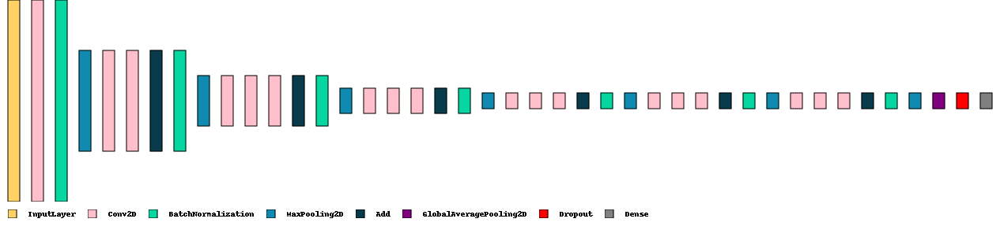

In [ ]:
color_map = defaultdict(dict)
color_map[Dropout]['fill'] = 'red'
color_map[GlobalAveragePooling2D]['fill'] = 'purple'
color_map[Dense]['fill'] = 'gray'
color_map[Conv2D]['fill'] = 'pink'

visualkeras.layered_view(model11, legend=True, scale_xy=0.5, scale_z=0.5, max_z=15, spacing=15, draw_funnel=False, draw_volume=False, color_map=color_map).show() # display using your system viewer

In [ ]:
history11 = model11.fit(train_image_gen,
                     validation_data = valid_image_gen,
                     callbacks =[earlyStop11, model_checkpoint], epochs =30)

Epoch 1/30
563/563 [==============================] - 347s 595ms/step - loss: 1.1845 - accuracy: 0.5481 - val_loss: 0.9996 - val_accuracy: 0.6018
Epoch 2/30
563/563 [==============================] - 332s 589ms/step - loss: 0.7280 - accuracy: 0.7256 - val_loss: 0.6906 - val_accuracy: 0.7440
Epoch 3/30
563/563 [==============================] - 332s 589ms/step - loss: 0.5959 - accuracy: 0.7792 - val_loss: 0.7147 - val_accuracy: 0.7258
Epoch 4/30
563/563 [==============================] - 331s 587ms/step - loss: 0.5307 - accuracy: 0.8060 - val_loss: 0.6630 - val_accuracy: 0.7662
Epoch 5/30
563/563 [==============================] - 330s 586ms/step - loss: 0.4750 - accuracy: 0.8269 - val_loss: 0.5992 - val_accuracy: 0.7858
Epoch 6/30
563/563 [==============================] - 335s 595ms/step - loss: 0.4405 - accuracy: 0.8408 - val_loss: 0.5128 - val_accuracy: 0.8058
Epoch 7/30
563/563 [==============================] - 334s 593ms/step - loss: 0.3852 - accuracy: 0.8608 - val_loss: 0.4518 -

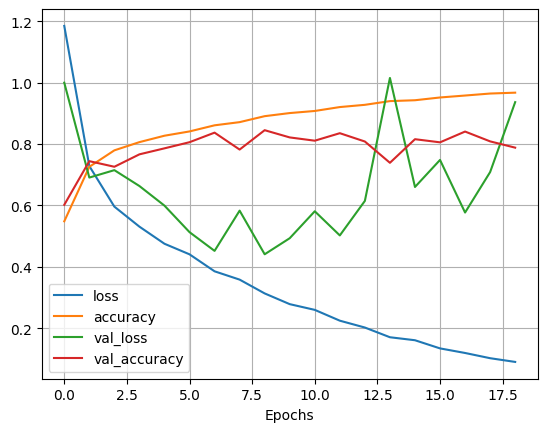

In [ ]:
losses_m11 = pd.DataFrame(model11.history.history).plot(xlabel="Epochs", grid=True);

In [ ]:
scores_m11 = model11.evaluate(test_image_gen)
print("Evaluation Accuracy: ", np.round(scores_m11[1],4))

71/71 [==============================] - 37s 515ms/step - loss: 0.4184 - accuracy: 0.8569
Evaluation Accuracy:  0.8569


In [ ]:
model11.save("Project_M11 zip", save_format="tf")
# to download it from Colab to your computer
from google.colab import files
!zip -r Project_M11.zip "Project_M11 zip"/
files.download("Project_M11.zip")

model11.save("Project_M11", save_format="h5")
files.download("Project_M11")

  adding: Project_M11 zip/ (stored 0%)
  adding: Project_M11 zip/fingerprint.pb (stored 0%)
  adding: Project_M11 zip/assets/ (stored 0%)
  adding: Project_M11 zip/saved_model.pb (deflated 90%)
  adding: Project_M11 zip/variables/ (stored 0%)
  adding: Project_M11 zip/variables/variables.data-00000-of-00001 (deflated 7%)
  adding: Project_M11 zip/variables/variables.index (deflated 75%)
  adding: Project_M11 zip/keras_metadata.pb (deflated 94%)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## Model M12

This model uses the M11 architecture with swish activation function instead of ReLU.

In [ ]:
from sklearn.metrics import f1_score as f1
from tensorflow.keras import Model, Input
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPool2D, Dense, Flatten, Dropout, add, GlobalAveragePooling2D, BatchNormalization
from tensorflow.keras.utils import plot_model
from tensorflow.keras.callbacks import ModelCheckpoint

from tensorflow.keras.initializers import he_normal #might want to switch to SELU and use LeCun
from tensorflow.keras.callbacks import EarlyStopping
from numpy.random import randint, choice

randomArray = randint(100,size = 18)

# early stopping parameters
earlyStop = EarlyStopping(monitor='val_loss', mode='min',
                          verbose = 1, patience=10,
                          restore_best_weights=True)#could change the min_delta

# model checkpoint
checkpoint_filepath = '/content/drive/My Drive/Deep Learning project/model12.hdf5'
model_checkpoint = ModelCheckpoint(
    filepath=checkpoint_filepath,
    save_weights_only=True,
    monitor='val_loss',
    mode='min',
    save_best_only=True)


#filters = number of feature maps created
#kernel = size of filter(7,7) deafault stride =1
#using RELU Activation
#padding set to same
#input shape is 512x512 pixel, 1=grayscale (3 for color/rbg img)

#CNN
inputs = Input(shape=(512,512,3))

x = Conv2D(filters=32, kernel_size=5, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(inputs)
x = BatchNormalization()(x)
block_1_output = MaxPool2D(2)(x)

x = Conv2D(filters=32, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(block_1_output)
x = Conv2D(filters=32, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(x)

x = add([x,block_1_output])
x = BatchNormalization()(x)
x = MaxPool2D(2)(x)

block_2_output = Conv2D(filters=32, kernel_size=3, activation='swish', padding='same',
                        kernel_initializer = he_normal(seed = choice(randomArray)))(x)
x = Conv2D(filters=32, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(block_2_output)
x = Conv2D(filters=32, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(x)

x = add([x,block_2_output])
x = BatchNormalization()(x)
x = MaxPool2D(2)(x)

block_3_output = Conv2D(filters=64, kernel_size=3, activation='swish', padding='same',
                        kernel_initializer = he_normal(seed = choice(randomArray)))(x)
x = Conv2D(filters=64, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(block_3_output)
x = Conv2D(filters=64, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(x)

x = add([x,block_3_output])
x = BatchNormalization()(x)
x = MaxPool2D(2)(x)

block_4_output = Conv2D(filters=64, kernel_size=3, activation='swish', padding='same',
                        kernel_initializer = he_normal(seed = choice(randomArray)))(x)
x = Conv2D(filters=64, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(block_4_output)
x = Conv2D(filters=64, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(x)

x = add([x,block_4_output])
x = BatchNormalization()(x)
x = MaxPool2D(2)(x)

block_5_output = Conv2D(filters=128, kernel_size=3, activation='swish', padding='same',
                        kernel_initializer = he_normal(seed = choice(randomArray)))(x)
x = Conv2D(filters=128, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(block_5_output)
x = Conv2D(filters=128, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(x)

x = add([x,block_5_output])
x = BatchNormalization()(x)
x = MaxPool2D(2)(x)

block_6_output = Conv2D(filters=128, kernel_size=3, activation='swish', padding='same',
                        kernel_initializer = he_normal(seed = choice(randomArray)))(x)
x = Conv2D(filters=128, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(block_6_output)
x = Conv2D(filters=128, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(x)

x = add([x,block_6_output])
x = BatchNormalization()(x)
x = MaxPool2D(2)(x)

# DNN
x = GlobalAveragePooling2D()(x)
x = Dropout(0.5)(x)
outputs = Dense(5, activation="softmax")(x)

model12 = Model(inputs, outputs)

model12.compile(loss='categorical_crossentropy',  #cat_ent for one-hot encoding classification problem
               optimizer='adam',
               metrics = ["accuracy"])

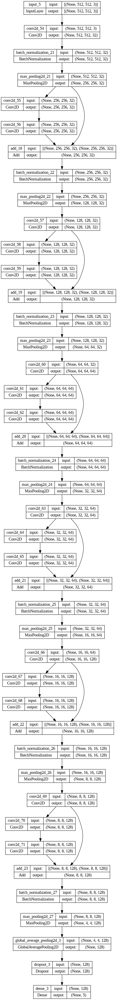

In [ ]:
plot_model(model12, "M12.png", show_shapes=True)

In [ ]:
model12.summary()

Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_5 (InputLayer)           [(None, 512, 512, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_54 (Conv2D)             (None, 512, 512, 32  2432        ['input_5[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization_21 (BatchN  (None, 512, 512, 32  128        ['conv2d_54[0][0]']              
 ormalization)                  )                                                           

In [ ]:
!pip install visualkeras
import visualkeras
from collections import defaultdict

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 993.0/993.0 kB 43.0 MB/s eta 0:00:00


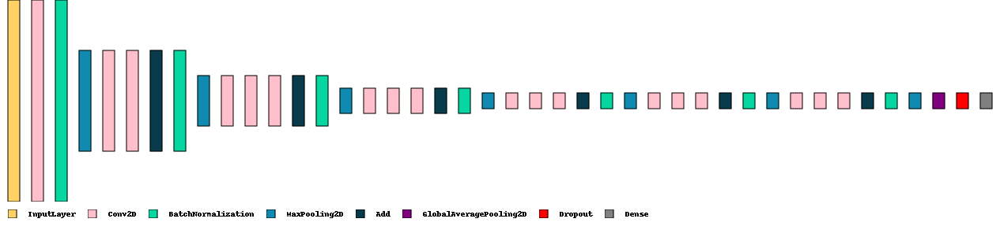

In [ ]:
color_map = defaultdict(dict)
color_map[Dropout]['fill'] = 'red'
color_map[GlobalAveragePooling2D]['fill'] = 'purple'
color_map[Dense]['fill'] = 'gray'
color_map[Conv2D]['fill'] = 'pink'

visualkeras.layered_view(model12, legend=True, scale_xy=0.5, scale_z=0.5, max_z=15, spacing=15, draw_funnel=False, draw_volume=False, color_map=color_map).show() # display using your system viewer

In [ ]:
history12 = model12.fit(train_image_gen,
                     validation_data = valid_image_gen,
                     callbacks =[earlyStop, model_checkpoint], epochs =30)

Epoch 1/30
563/563 [==============================] - 524s 871ms/step - loss: 1.1076 - accuracy: 0.5854 - val_loss: 1.3936 - val_accuracy: 0.5293
Epoch 2/30
563/563 [==============================] - 470s 834ms/step - loss: 0.7249 - accuracy: 0.7264 - val_loss: 1.0072 - val_accuracy: 0.6236
Epoch 3/30
563/563 [==============================] - 468s 831ms/step - loss: 0.6103 - accuracy: 0.7752 - val_loss: 0.8446 - val_accuracy: 0.7027
Epoch 4/30
563/563 [==============================] - 505s 896ms/step - loss: 0.5308 - accuracy: 0.8053 - val_loss: 0.6111 - val_accuracy: 0.7751
Epoch 5/30
563/563 [==============================] - 470s 834ms/step - loss: 0.4825 - accuracy: 0.8236 - val_loss: 0.6041 - val_accuracy: 0.7756
Epoch 6/30
563/563 [==============================] - 472s 838ms/step - loss: 0.4276 - accuracy: 0.8421 - val_loss: 0.5428 - val_accuracy: 0.7978
Epoch 7/30
563/563 [==============================] - 474s 841ms/step - loss: 0.3821 - accuracy: 0.8604 - val_loss: 0.7365 -

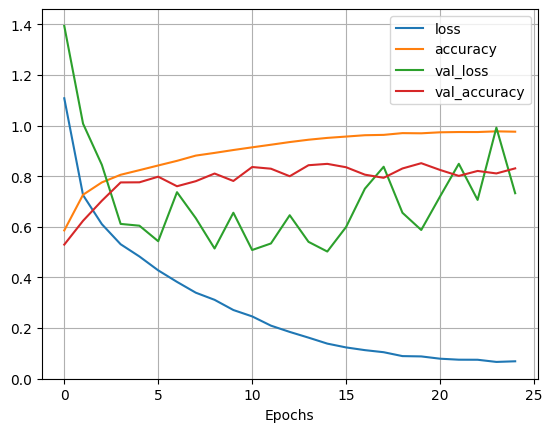

In [ ]:
losses_m12 = pd.DataFrame(model12.history.history).plot(xlabel="Epochs", grid=True);

In [ ]:
scores_m12 = model12.evaluate(test_image_gen)
print("Evaluation Accuracy: ", np.round(scores_m12[1],4))

71/71 [==============================] - 67s 945ms/step - loss: 0.4724 - accuracy: 0.8533
Evaluation Accuracy:  0.8533


In [ ]:
model12.save("Project_M12 zip", save_format="tf")
# to download it from Colab to your computer
from google.colab import files
!zip -r Project_M12.zip "Project_M12 zip"/
files.download("Project_M12.zip")

model12.save("Project_M12", save_format="h5")
files.download("Project_M12")

  adding: Project_M12 zip/ (stored 0%)
  adding: Project_M12 zip/variables/ (stored 0%)
  adding: Project_M12 zip/variables/variables.data-00000-of-00001 (deflated 7%)
  adding: Project_M12 zip/variables/variables.index (deflated 75%)
  adding: Project_M12 zip/saved_model.pb (deflated 91%)
  adding: Project_M12 zip/assets/ (stored 0%)
  adding: Project_M12 zip/fingerprint.pb (stored 0%)
  adding: Project_M12 zip/keras_metadata.pb (deflated 94%)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## Model M13

This model adds data augmentation to M12. It is split into 2 parts because training takes too long to complete in one session. Training begins in Part 1 and a model checkpoint was used to continue training in Part 2.

### Part 1

In [ ]:
from sklearn.metrics import f1_score as f1
from tensorflow.keras import Model, Input
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPool2D, Dense, Flatten, Dropout, add, GlobalAveragePooling2D, BatchNormalization
from tensorflow.keras.utils import plot_model
from tensorflow.keras.callbacks import ModelCheckpoint

from tensorflow.keras.initializers import he_normal #might want to switch to SELU and use LeCun
from tensorflow.keras.callbacks import EarlyStopping
from numpy.random import randint, choice

randomArray = randint(100,size = 18)

# early stopping parameters
earlyStop = EarlyStopping(monitor='val_loss', mode='min',
                          verbose = 1, patience=10,
                          restore_best_weights=True)#could change the min_delta

# model checkpoint
checkpoint_filepath = '/content/drive/My Drive/Deep Learning project/model13.hdf5'
model_checkpoint = ModelCheckpoint(
    filepath=checkpoint_filepath,
    save_weights_only=True,
    monitor='val_loss',
    mode='min',
    save_best_only=True)


#filters = number of feature maps created
#kernel = size of filter(7,7) deafault stride =1
#using RELU Activation
#padding set to same
#input shape is 512x512 pixel, 1=grayscale (3 for color/rbg img)

#CNN
inputs = Input(shape=(512,512,3))

x = Conv2D(filters=32, kernel_size=5, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(inputs)
x = BatchNormalization()(x)
block_1_output = MaxPool2D(2)(x)

x = Conv2D(filters=32, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(block_1_output)
x = Conv2D(filters=32, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(x)

x = add([x,block_1_output])
x = BatchNormalization()(x)
x = MaxPool2D(2)(x)

block_2_output = Conv2D(filters=32, kernel_size=3, activation='swish', padding='same',
                        kernel_initializer = he_normal(seed = choice(randomArray)))(x)
x = Conv2D(filters=32, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(block_2_output)
x = Conv2D(filters=32, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(x)

x = add([x,block_2_output])
x = BatchNormalization()(x)
x = MaxPool2D(2)(x)

block_3_output = Conv2D(filters=64, kernel_size=3, activation='swish', padding='same',
                        kernel_initializer = he_normal(seed = choice(randomArray)))(x)
x = Conv2D(filters=64, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(block_3_output)
x = Conv2D(filters=64, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(x)

x = add([x,block_3_output])
x = BatchNormalization()(x)
x = MaxPool2D(2)(x)

block_4_output = Conv2D(filters=64, kernel_size=3, activation='swish', padding='same',
                        kernel_initializer = he_normal(seed = choice(randomArray)))(x)
x = Conv2D(filters=64, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(block_4_output)
x = Conv2D(filters=64, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(x)

x = add([x,block_4_output])
x = BatchNormalization()(x)
x = MaxPool2D(2)(x)

block_5_output = Conv2D(filters=128, kernel_size=3, activation='swish', padding='same',
                        kernel_initializer = he_normal(seed = choice(randomArray)))(x)
x = Conv2D(filters=128, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(block_5_output)
x = Conv2D(filters=128, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(x)

x = add([x,block_5_output])
x = BatchNormalization()(x)
x = MaxPool2D(2)(x)

block_6_output = Conv2D(filters=128, kernel_size=3, activation='swish', padding='same',
                        kernel_initializer = he_normal(seed = choice(randomArray)))(x)
x = Conv2D(filters=128, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(block_6_output)
x = Conv2D(filters=128, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(x)

x = add([x,block_6_output])
x = BatchNormalization()(x)
x = MaxPool2D(2)(x)

# DNN
x = GlobalAveragePooling2D()(x)
x = Dropout(0.5)(x)
outputs = Dense(5, activation="softmax")(x)

model13 = Model(inputs, outputs)

model13.compile(loss='categorical_crossentropy',  #cat_ent for one-hot encoding classification problem
               optimizer='adam',
               metrics = ["accuracy"])

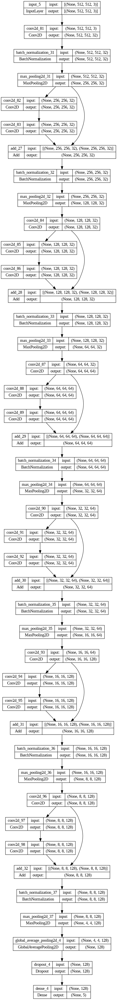

In [ ]:
plot_model(model13, "M13.png", show_shapes=True)

In [ ]:
model13.summary()

Model: "model_4"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_5 (InputLayer)           [(None, 512, 512, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_81 (Conv2D)             (None, 512, 512, 32  2432        ['input_5[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization_31 (BatchN  (None, 512, 512, 32  128        ['conv2d_81[0][0]']              
 ormalization)                  )                                                           

In [ ]:
!pip install visualkeras
import visualkeras
from collections import defaultdict

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


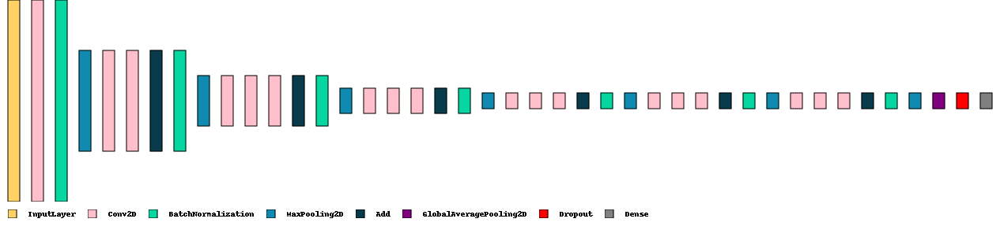

In [ ]:
color_map = defaultdict(dict)
color_map[Dropout]['fill'] = 'red'
color_map[GlobalAveragePooling2D]['fill'] = 'purple'
color_map[Dense]['fill'] = 'gray'
color_map[Conv2D]['fill'] = 'pink'

visualkeras.layered_view(model13, legend=True, scale_xy=0.5, scale_z=0.5, max_z=15, spacing=15, draw_funnel=False, draw_volume=False, color_map=color_map).show() # display using your system viewer

In [ ]:
history13 = model13.fit(train_image_gen,
                     validation_data = valid_image_gen,
                     callbacks =[earlyStop, model_checkpoint], epochs =30)

Epoch 1/30
563/563 [==============================] - 1763s 3s/step - loss: 1.5395 - accuracy: 0.3992 - val_loss: 2.7727 - val_accuracy: 0.3991
Epoch 2/30
563/563 [==============================] - 1700s 3s/step - loss: 1.0995 - accuracy: 0.5723 - val_loss: 1.2289 - val_accuracy: 0.5262
Epoch 3/30
563/563 [==============================] - 1700s 3s/step - loss: 0.9311 - accuracy: 0.6426 - val_loss: 0.9261 - val_accuracy: 0.6467
Epoch 4/30
563/563 [==============================] - 1658s 3s/step - loss: 0.8288 - accuracy: 0.6864 - val_loss: 0.8502 - val_accuracy: 0.6840
Epoch 5/30
563/563 [==============================] - 1703s 3s/step - loss: 0.7585 - accuracy: 0.7167 - val_loss: 0.8064 - val_accuracy: 0.6836
Epoch 6/30
563/563 [==============================] - 1730s 3s/step - loss: 0.7079 - accuracy: 0.7373 - val_loss: 0.7393 - val_accuracy: 0.7196
Epoch 7/30
563/563 [==============================] - 1716s 3s/step - loss: 0.6504 - accuracy: 0.7577 - val_loss: 0.6455 - val_accuracy:

In [ ]:
losses_m13 = pd.DataFrame(model13.history.history).plot(xlabel="Epochs", grid=True);

In [ ]:
scores_m13 = model13.evaluate(test_image_gen)
print("Evaluation Accuracy: ", np.round(scores_m13[1],4))

In [ ]:
model13.save("Project_M13 zip", save_format="tf")
# to download it from Colab to your computer
from google.colab import files
!zip -r Project_M13.zip "Project_M13 zip"/
files.download("Project_M13.zip")

model13.save("Project_M13", save_format="h5")
files.download("Project_M13")

### Part 2

Since the model checkpoint saves the model with the lowest validation loss, it is currently saved at epoch 16/30. Therefore, Part 2 will train the model for another 14 epochs.

In [ ]:
from sklearn.metrics import f1_score as f1
from tensorflow.keras import Model, Input
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPool2D, Dense, Flatten, Dropout, add, GlobalAveragePooling2D, BatchNormalization
from tensorflow.keras.utils import plot_model
from tensorflow.keras.callbacks import ModelCheckpoint

from tensorflow.keras.initializers import he_normal #might want to switch to SELU and use LeCun
from tensorflow.keras.callbacks import EarlyStopping
from numpy.random import randint, choice

import tensorflow as tf

randomArray = randint(100,size = 18)

# early stopping parameters
earlyStop = EarlyStopping(monitor='val_loss', mode='min',
                          verbose = 1, patience=10,
                          restore_best_weights=True)#could change the min_delta

# model checkpoint
checkpoint_filepath = '/content/drive/My Drive/Deep Learning project/model13.hdf5'
model_checkpoint = ModelCheckpoint(
    filepath=checkpoint_filepath,
    save_weights_only=True,
    monitor='val_loss',
    mode='min',
    save_best_only=True)

#filters = number of feature maps created
#kernel = size of filter(7,7) deafault stride =1
#using RELU Activation
#padding set to same
#input shape is 512x512 pixel, 1=grayscale (3 for color/rbg img)

#CNN
inputs = Input(shape=(512,512,3))

x = Conv2D(filters=32, kernel_size=5, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(inputs)
x = BatchNormalization()(x)
block_1_output = MaxPool2D(2)(x)

x = Conv2D(filters=32, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(block_1_output)
x = Conv2D(filters=32, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(x)

x = add([x,block_1_output])
x = BatchNormalization()(x)
x = MaxPool2D(2)(x)

block_2_output = Conv2D(filters=32, kernel_size=3, activation='swish', padding='same',
                        kernel_initializer = he_normal(seed = choice(randomArray)))(x)
x = Conv2D(filters=32, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(block_2_output)
x = Conv2D(filters=32, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(x)

x = add([x,block_2_output])
x = BatchNormalization()(x)
x = MaxPool2D(2)(x)

block_3_output = Conv2D(filters=64, kernel_size=3, activation='swish', padding='same',
                        kernel_initializer = he_normal(seed = choice(randomArray)))(x)
x = Conv2D(filters=64, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(block_3_output)
x = Conv2D(filters=64, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(x)

x = add([x,block_3_output])
x = BatchNormalization()(x)
x = MaxPool2D(2)(x)

block_4_output = Conv2D(filters=64, kernel_size=3, activation='swish', padding='same',
                        kernel_initializer = he_normal(seed = choice(randomArray)))(x)
x = Conv2D(filters=64, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(block_4_output)
x = Conv2D(filters=64, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(x)

x = add([x,block_4_output])
x = BatchNormalization()(x)
x = MaxPool2D(2)(x)

block_5_output = Conv2D(filters=128, kernel_size=3, activation='swish', padding='same',
                        kernel_initializer = he_normal(seed = choice(randomArray)))(x)
x = Conv2D(filters=128, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(block_5_output)
x = Conv2D(filters=128, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(x)

x = add([x,block_5_output])
x = BatchNormalization()(x)
x = MaxPool2D(2)(x)

block_6_output = Conv2D(filters=128, kernel_size=3, activation='swish', padding='same',
                        kernel_initializer = he_normal(seed = choice(randomArray)))(x)
x = Conv2D(filters=128, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(block_6_output)
x = Conv2D(filters=128, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(x)

x = add([x,block_6_output])
x = BatchNormalization()(x)
x = MaxPool2D(2)(x)

# DNN
x = GlobalAveragePooling2D()(x)
x = Dropout(0.5)(x)
outputs = Dense(5, activation="softmax")(x)

model13 = Model(inputs, outputs)

model13.compile(loss='categorical_crossentropy',  #cat_ent for one-hot encoding classification problem
               optimizer='adam',
               metrics = ["accuracy"])

# Recreate the exact same model, including its weights and the optimizer
model13.load_weights(checkpoint_filepath) # model should be located in google drive

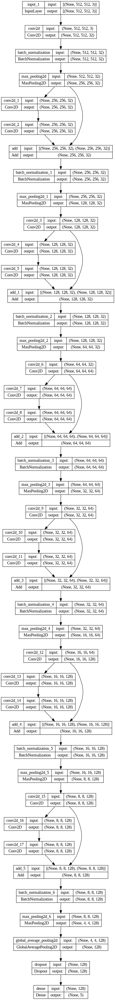

In [ ]:
plot_model(model13, "M13.png", show_shapes=True)

In [ ]:
model13.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 512, 512, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 512, 512, 32  2432        ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 512, 512, 32  128        ['conv2d[0][0]']                 
 alization)                     )                                                             

In [ ]:
!pip install visualkeras
import visualkeras
from collections import defaultdict

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 993.0/993.0 kB 30.0 MB/s eta 0:00:00


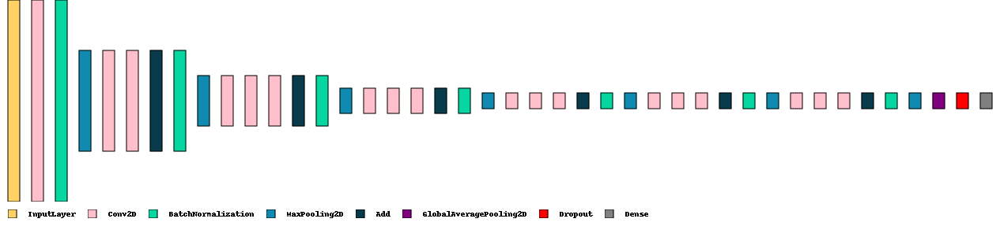

In [ ]:
color_map = defaultdict(dict)
color_map[Dropout]['fill'] = 'red'
color_map[GlobalAveragePooling2D]['fill'] = 'purple'
color_map[Dense]['fill'] = 'gray'
color_map[Conv2D]['fill'] = 'pink'

visualkeras.layered_view(model13, legend=True, scale_xy=0.5, scale_z=0.5, max_z=15, spacing=15, draw_funnel=False, draw_volume=False, color_map=color_map).show() # display using your system viewer

In [ ]:
history13 = model13.fit(train_image_gen,
                     validation_data = valid_image_gen,
                     callbacks =[earlyStop, model_checkpoint], epochs =14)

Epoch 1/14
563/563 [==============================] - 1748s 3s/step - loss: 0.4380 - accuracy: 0.8412 - val_loss: 0.5055 - val_accuracy: 0.8040
Epoch 2/14
563/563 [==============================] - 1691s 3s/step - loss: 0.4276 - accuracy: 0.8468 - val_loss: 0.5314 - val_accuracy: 0.8111
Epoch 3/14
563/563 [==============================] - 1750s 3s/step - loss: 0.4132 - accuracy: 0.8543 - val_loss: 0.5655 - val_accuracy: 0.7996
Epoch 4/14
563/563 [==============================] - 1708s 3s/step - loss: 0.4067 - accuracy: 0.8530 - val_loss: 0.5106 - val_accuracy: 0.8231
Epoch 5/14
563/563 [==============================] - 1699s 3s/step - loss: 0.3977 - accuracy: 0.8597 - val_loss: 0.4523 - val_accuracy: 0.8298
Epoch 6/14
563/563 [==============================] - 1695s 3s/step - loss: 0.3760 - accuracy: 0.8659 - val_loss: 0.4558 - val_accuracy: 0.8360
Epoch 7/14
563/563 [==============================] - 1704s 3s/step - loss: 0.3722 - accuracy: 0.8678 - val_loss: 0.4658 - val_accuracy:

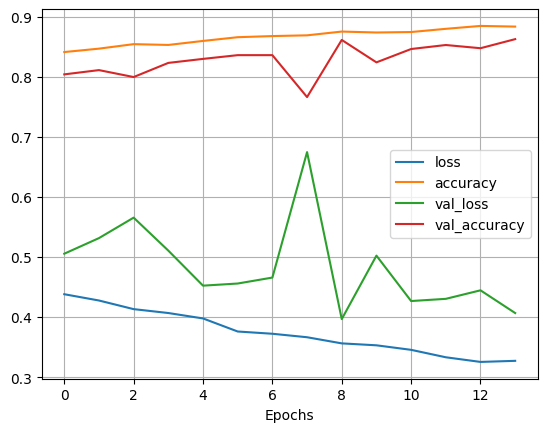

In [ ]:
losses_m13 = pd.DataFrame(model13.history.history).plot(xlabel="Epochs", grid=True);

In [ ]:
scores_m13 = model13.evaluate(test_image_gen)
print("Evaluation Accuracy: ", np.round(scores_m13[1],4))

71/71 [==============================] - 210s 3s/step - loss: 0.4097 - accuracy: 0.8609
Evaluation Accuracy:  0.8609


In [ ]:
model13.save("Project_M13 zip", save_format="tf")
# to download it from Colab to your computer
from google.colab import files
!zip -r Project_M13.zip "Project_M13 zip"/
files.download("Project_M13.zip")

model13.save("Project_M13", save_format="h5")
files.download("Project_M13")

  adding: Project_M13 zip/ (stored 0%)
  adding: Project_M13 zip/keras_metadata.pb (deflated 94%)
  adding: Project_M13 zip/assets/ (stored 0%)
  adding: Project_M13 zip/saved_model.pb (deflated 91%)
  adding: Project_M13 zip/fingerprint.pb (stored 0%)
  adding: Project_M13 zip/variables/ (stored 0%)
  adding: Project_M13 zip/variables/variables.index (deflated 75%)
  adding: Project_M13 zip/variables/variables.data-00000-of-00001 (deflated 7%)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

At this point, the model has trained for 30 epochs total without reaching an early stopping point. In keeping with the philosophy "why fix what isn't broken", we'll continue training the model for another 30 epochs.

In [ ]:
history13b = model13.fit(train_image_gen,
                     validation_data = valid_image_gen,
                     callbacks =[earlyStop, model_checkpoint], epochs =30)

Epoch 1/30
563/563 [==============================] - 1763s 3s/step - loss: 0.3143 - accuracy: 0.8869 - val_loss: 0.5072 - val_accuracy: 0.8244
Epoch 2/30
563/563 [==============================] - 1691s 3s/step - loss: 0.3188 - accuracy: 0.8892 - val_loss: 0.4575 - val_accuracy: 0.8418
Epoch 3/30
563/563 [==============================] - 1698s 3s/step - loss: 0.3061 - accuracy: 0.8907 - val_loss: 0.4154 - val_accuracy: 0.8556
Epoch 4/30
563/563 [==============================] - 1704s 3s/step - loss: 0.3003 - accuracy: 0.8922 - val_loss: 0.3805 - val_accuracy: 0.8609
Epoch 5/30
563/563 [==============================] - 1725s 3s/step - loss: 0.3002 - accuracy: 0.8936 - val_loss: 0.4146 - val_accuracy: 0.8493
Epoch 6/30
563/563 [==============================] - 1729s 3s/step - loss: 0.2886 - accuracy: 0.8961 - val_loss: 0.4416 - val_accuracy: 0.8489
Epoch 7/30
563/563 [==============================] - 1751s 3s/step - loss: 0.2874 - accuracy: 0.8963 - val_loss: 0.3881 - val_accuracy:

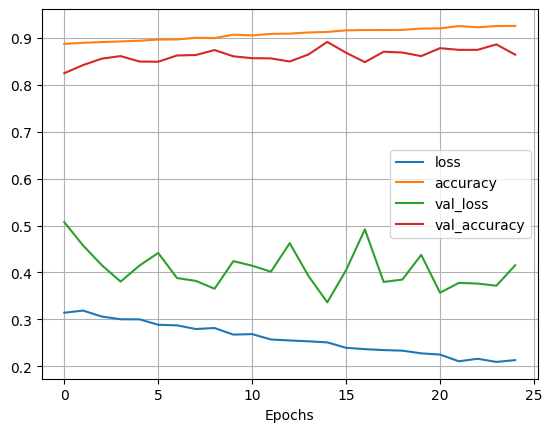

In [ ]:
losses_m13b = pd.DataFrame(model13.history.history).plot(xlabel="Epochs", grid=True);

In [ ]:
scores_m13b = model13.evaluate(test_image_gen)
print("Evaluation Accuracy: ", np.round(scores_m13b[1],4))

71/71 [==============================] - 170s 2s/step - loss: 0.3744 - accuracy: 0.8787
Evaluation Accuracy:  0.8787


In [ ]:
model13.save("Project_M13b zip", save_format="tf")
# to download it from Colab to your computer
from google.colab import files
!zip -r Project_M13b.zip "Project_M13b zip"/
files.download("Project_M13b.zip")

model13.save("Project_M13b", save_format="h5")
files.download("Project_M13b")

  adding: Project_M13b zip/ (stored 0%)
  adding: Project_M13b zip/keras_metadata.pb (deflated 94%)
  adding: Project_M13b zip/assets/ (stored 0%)
  adding: Project_M13b zip/saved_model.pb (deflated 91%)
  adding: Project_M13b zip/fingerprint.pb (stored 0%)
  adding: Project_M13b zip/variables/ (stored 0%)
  adding: Project_M13b zip/variables/variables.index (deflated 75%)
  adding: Project_M13b zip/variables/variables.data-00000-of-00001 (deflated 7%)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## Model M14

This model uses the M12 architecture with L2 regularization with a value of 0.0005 to reduce overfitting. Data augmentation was removed to reduce training time.

In [ ]:
from sklearn.metrics import f1_score as f1
from tensorflow.keras import Model, Input
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPool2D, Dense, Flatten, Dropout, add, GlobalAveragePooling2D, BatchNormalization
from tensorflow.keras.utils import plot_model
from tensorflow.keras.callbacks import ModelCheckpoint

from tensorflow.keras.initializers import he_normal #might want to switch to SELU and use LeCun
from tensorflow.keras.callbacks import EarlyStopping
from numpy.random import randint, choice

from keras.regularizers import l2

randomArray = randint(100,size = 18)

# early stopping parameters
earlyStop = EarlyStopping(monitor='val_loss', mode='min',
                          verbose = 1, patience=10,
                          restore_best_weights=True)#could change the min_delta

# model checkpoint
checkpoint_filepath = '/content/drive/My Drive/Deep Learning project/model14.hdf5'
model_checkpoint = ModelCheckpoint(
    filepath=checkpoint_filepath,
    save_weights_only=True,
    monitor='val_loss',
    mode='min',
    save_best_only=True)


#filters = number of feature maps created
#kernel = size of filter(7,7) deafault stride =1
#using RELU Activation
#padding set to same
#input shape is 512x512 pixel, 1=grayscale (3 for color/rbg img)

#CNN
inputs = Input(shape=(512,512,3))

x = Conv2D(filters=32, kernel_size=5, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)),
           kernel_regularizer=l2(0.0005), bias_regularizer=l2(0.0005))(inputs)
x = BatchNormalization()(x)
block_1_output = MaxPool2D(2)(x)

x = Conv2D(filters=32, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)),
           kernel_regularizer=l2(0.0005), bias_regularizer=l2(0.0005))(block_1_output)
x = Conv2D(filters=32, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)),
           kernel_regularizer=l2(0.0005), bias_regularizer=l2(0.0005))(x)

x = add([x,block_1_output])
x = BatchNormalization()(x)
x = MaxPool2D(2)(x)

block_2_output = Conv2D(filters=32, kernel_size=3, activation='swish', padding='same',
                        kernel_initializer = he_normal(seed = choice(randomArray)),
                        kernel_regularizer=l2(0.0005), bias_regularizer=l2(0.0005))(x)
x = Conv2D(filters=32, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)),
           kernel_regularizer=l2(0.0005), bias_regularizer=l2(0.0005))(block_2_output)
x = Conv2D(filters=32, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)),
           kernel_regularizer=l2(0.0005), bias_regularizer=l2(0.0005))(x)

x = add([x,block_2_output])
x = BatchNormalization()(x)
x = MaxPool2D(2)(x)

block_3_output = Conv2D(filters=64, kernel_size=3, activation='swish', padding='same',
                        kernel_initializer = he_normal(seed = choice(randomArray)),
                        kernel_regularizer=l2(0.0005), bias_regularizer=l2(0.0005))(x)
x = Conv2D(filters=64, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)),
           kernel_regularizer=l2(0.0005), bias_regularizer=l2(0.0005))(block_3_output)
x = Conv2D(filters=64, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)),
           kernel_regularizer=l2(0.0005), bias_regularizer=l2(0.0005))(x)

x = add([x,block_3_output])
x = BatchNormalization()(x)
x = MaxPool2D(2)(x)

block_4_output = Conv2D(filters=64, kernel_size=3, activation='swish', padding='same',
                        kernel_initializer = he_normal(seed = choice(randomArray)),
                        kernel_regularizer=l2(0.0005), bias_regularizer=l2(0.0005))(x)
x = Conv2D(filters=64, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)),
           kernel_regularizer=l2(0.0005), bias_regularizer=l2(0.0005))(block_4_output)
x = Conv2D(filters=64, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)),
           kernel_regularizer=l2(0.0005), bias_regularizer=l2(0.0005))(x)

x = add([x,block_4_output])
x = BatchNormalization()(x)
x = MaxPool2D(2)(x)

block_5_output = Conv2D(filters=128, kernel_size=3, activation='swish', padding='same',
                        kernel_initializer = he_normal(seed = choice(randomArray)),
                        kernel_regularizer=l2(0.0005), bias_regularizer=l2(0.0005))(x)
x = Conv2D(filters=128, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)),
           kernel_regularizer=l2(0.0005), bias_regularizer=l2(0.0005))(block_5_output)
x = Conv2D(filters=128, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)),
           kernel_regularizer=l2(0.0005), bias_regularizer=l2(0.0005))(x)

x = add([x,block_5_output])
x = BatchNormalization()(x)
x = MaxPool2D(2)(x)

block_6_output = Conv2D(filters=128, kernel_size=3, activation='swish', padding='same',
                        kernel_initializer = he_normal(seed = choice(randomArray)),
           kernel_regularizer=l2(0.0005), bias_regularizer=l2(0.0005))(x)
x = Conv2D(filters=128, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)),
           kernel_regularizer=l2(0.0005), bias_regularizer=l2(0.0005))(block_6_output)
x = Conv2D(filters=128, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)),
           kernel_regularizer=l2(0.0005), bias_regularizer=l2(0.0005))(x)

x = add([x,block_6_output])
x = BatchNormalization()(x)
x = MaxPool2D(2)(x)

# DNN
x = GlobalAveragePooling2D()(x)
x = Dropout(0.5)(x)
outputs = Dense(5, activation="softmax")(x)

model14 = Model(inputs, outputs)

model14.compile(loss='categorical_crossentropy',  #cat_ent for one-hot encoding classification problem
               optimizer='adam',
               metrics = ["accuracy"])

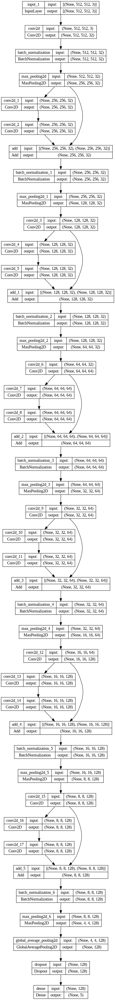

In [ ]:
plot_model(model14, "M14.png", show_shapes=True)

In [ ]:
model14.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 512, 512, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 512, 512, 32  2432        ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 512, 512, 32  128        ['conv2d[0][0]']                 
 alization)                     )                                                             

In [ ]:
!pip install visualkeras
import visualkeras
from collections import defaultdict

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 993.0/993.0 kB 34.5 MB/s eta 0:00:00


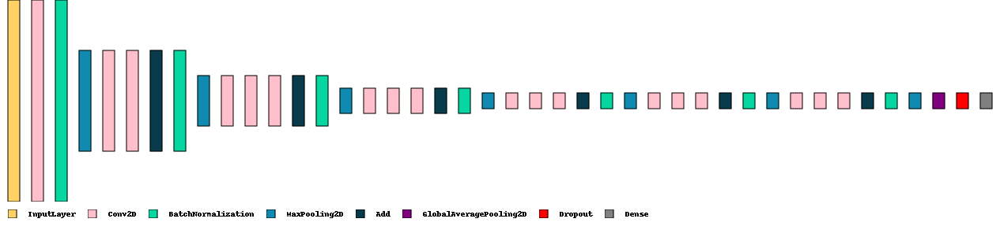

In [ ]:
color_map = defaultdict(dict)
color_map[Dropout]['fill'] = 'red'
color_map[GlobalAveragePooling2D]['fill'] = 'purple'
color_map[Dense]['fill'] = 'gray'
color_map[Conv2D]['fill'] = 'pink'

visualkeras.layered_view(model14, legend=True, scale_xy=0.5, scale_z=0.5, max_z=15, spacing=15, draw_funnel=False, draw_volume=False, color_map=color_map).show() # display using your system viewer

In [ ]:
history14 = model14.fit(train_image_gen,
                     validation_data = valid_image_gen,
                     callbacks =[earlyStop, model_checkpoint], epochs =30)

Epoch 1/30
563/563 [==============================] - 609s 1s/step - loss: 2.3155 - accuracy: 0.5318 - val_loss: 1.8137 - val_accuracy: 0.6240
Epoch 2/30
563/563 [==============================] - 495s 880ms/step - loss: 1.4474 - accuracy: 0.6997 - val_loss: 1.3912 - val_accuracy: 0.6747
Epoch 3/30
563/563 [==============================] - 492s 873ms/step - loss: 1.1319 - accuracy: 0.7377 - val_loss: 1.1874 - val_accuracy: 0.6880
Epoch 4/30
563/563 [==============================] - 484s 860ms/step - loss: 0.9636 - accuracy: 0.7684 - val_loss: 1.0534 - val_accuracy: 0.7262
Epoch 5/30
563/563 [==============================] - 486s 863ms/step - loss: 0.8598 - accuracy: 0.7924 - val_loss: 1.4549 - val_accuracy: 0.5711
Epoch 6/30
563/563 [==============================] - 484s 859ms/step - loss: 0.7999 - accuracy: 0.8066 - val_loss: 0.8299 - val_accuracy: 0.7911
Epoch 7/30
563/563 [==============================] - 486s 864ms/step - loss: 0.7371 - accuracy: 0.8273 - val_loss: 1.1703 - va

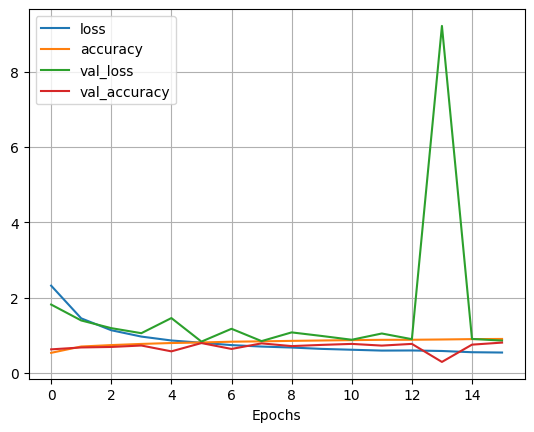

In [ ]:
losses_m14 = pd.DataFrame(model14.history.history).plot(xlabel="Epochs", grid=True);

In [ ]:
scores_m14 = model14.evaluate(test_image_gen)
print("Evaluation Accuracy: ", np.round(scores_m14[1],4))

71/71 [==============================] - 74s 1s/step - loss: 0.8272 - accuracy: 0.7938
Evaluation Accuracy:  0.7938


In [ ]:
model14.save("Project_M14 zip", save_format="tf")
# to download it from Colab to your computer
from google.colab import files
!zip -r Project_M14.zip "Project_M14 zip"/
files.download("Project_M14.zip")

model14.save("Project_M14", save_format="h5")
files.download("Project_M14")

  adding: Project_M14 zip/ (stored 0%)
  adding: Project_M14 zip/keras_metadata.pb (deflated 94%)
  adding: Project_M14 zip/assets/ (stored 0%)
  adding: Project_M14 zip/saved_model.pb (deflated 91%)
  adding: Project_M14 zip/fingerprint.pb (stored 0%)
  adding: Project_M14 zip/variables/ (stored 0%)
  adding: Project_M14 zip/variables/variables.index (deflated 75%)
  adding: Project_M14 zip/variables/variables.data-00000-of-00001 (deflated 7%)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## Model M15

Based on model M14, an L2 regularization of 0.0005 doesn't seem very helpful. Let's try again with a value of 0.005.

In [ ]:
from sklearn.metrics import f1_score as f1
from tensorflow.keras import Model, Input
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPool2D, Dense, Flatten, Dropout, add, GlobalAveragePooling2D, BatchNormalization
from tensorflow.keras.utils import plot_model
from tensorflow.keras.callbacks import ModelCheckpoint

from tensorflow.keras.initializers import he_normal #might want to switch to SELU and use LeCun
from tensorflow.keras.callbacks import EarlyStopping
from numpy.random import randint, choice

from keras.regularizers import l2

randomArray = randint(100,size = 18)

# early stopping parameters
earlyStop = EarlyStopping(monitor='val_loss', mode='min',
                          verbose = 1, patience=10,
                          restore_best_weights=True)#could change the min_delta

# model checkpoint
checkpoint_filepath = '/content/drive/My Drive/Deep Learning project/model15.hdf5'
model_checkpoint = ModelCheckpoint(
    filepath=checkpoint_filepath,
    save_weights_only=True,
    monitor='val_loss',
    mode='min',
    save_best_only=True)


#filters = number of feature maps created
#kernel = size of filter(7,7) deafault stride =1
#using RELU Activation
#padding set to same
#input shape is 512x512 pixel, 1=grayscale (3 for color/rbg img)

#CNN
inputs = Input(shape=(512,512,3))

x = Conv2D(filters=32, kernel_size=5, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)),
           kernel_regularizer=l2(0.005), bias_regularizer=l2(0.005))(inputs)
x = BatchNormalization()(x)
block_1_output = MaxPool2D(2)(x)

x = Conv2D(filters=32, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)),
           kernel_regularizer=l2(0.005), bias_regularizer=l2(0.005))(block_1_output)
x = Conv2D(filters=32, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)),
           kernel_regularizer=l2(0.005), bias_regularizer=l2(0.005))(x)

x = add([x,block_1_output])
x = BatchNormalization()(x)
x = MaxPool2D(2)(x)

block_2_output = Conv2D(filters=32, kernel_size=3, activation='swish', padding='same',
                        kernel_initializer = he_normal(seed = choice(randomArray)),
                        kernel_regularizer=l2(0.005), bias_regularizer=l2(0.005))(x)
x = Conv2D(filters=32, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)),
           kernel_regularizer=l2(0.005), bias_regularizer=l2(0.005))(block_2_output)
x = Conv2D(filters=32, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)),
           kernel_regularizer=l2(0.005), bias_regularizer=l2(0.005))(x)

x = add([x,block_2_output])
x = BatchNormalization()(x)
x = MaxPool2D(2)(x)

block_3_output = Conv2D(filters=64, kernel_size=3, activation='swish', padding='same',
                        kernel_initializer = he_normal(seed = choice(randomArray)),
                        kernel_regularizer=l2(0.005), bias_regularizer=l2(0.005))(x)
x = Conv2D(filters=64, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)),
           kernel_regularizer=l2(0.005), bias_regularizer=l2(0.005))(block_3_output)
x = Conv2D(filters=64, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)),
           kernel_regularizer=l2(0.005), bias_regularizer=l2(0.005))(x)

x = add([x,block_3_output])
x = BatchNormalization()(x)
x = MaxPool2D(2)(x)

block_4_output = Conv2D(filters=64, kernel_size=3, activation='swish', padding='same',
                        kernel_initializer = he_normal(seed = choice(randomArray)),
                        kernel_regularizer=l2(0.005), bias_regularizer=l2(0.005))(x)
x = Conv2D(filters=64, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)),
           kernel_regularizer=l2(0.005), bias_regularizer=l2(0.005))(block_4_output)
x = Conv2D(filters=64, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)),
           kernel_regularizer=l2(0.005), bias_regularizer=l2(0.005))(x)

x = add([x,block_4_output])
x = BatchNormalization()(x)
x = MaxPool2D(2)(x)

block_5_output = Conv2D(filters=128, kernel_size=3, activation='swish', padding='same',
                        kernel_initializer = he_normal(seed = choice(randomArray)),
                        kernel_regularizer=l2(0.005), bias_regularizer=l2(0.005))(x)
x = Conv2D(filters=128, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)),
           kernel_regularizer=l2(0.005), bias_regularizer=l2(0.005))(block_5_output)
x = Conv2D(filters=128, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)),
           kernel_regularizer=l2(0.005), bias_regularizer=l2(0.005))(x)

x = add([x,block_5_output])
x = BatchNormalization()(x)
x = MaxPool2D(2)(x)

block_6_output = Conv2D(filters=128, kernel_size=3, activation='swish', padding='same',
                        kernel_initializer = he_normal(seed = choice(randomArray)),
           kernel_regularizer=l2(0.005), bias_regularizer=l2(0.005))(x)
x = Conv2D(filters=128, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)),
           kernel_regularizer=l2(0.005), bias_regularizer=l2(0.005))(block_6_output)
x = Conv2D(filters=128, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)),
           kernel_regularizer=l2(0.005), bias_regularizer=l2(0.005))(x)

x = add([x,block_6_output])
x = BatchNormalization()(x)
x = MaxPool2D(2)(x)

# DNN
x = GlobalAveragePooling2D()(x)
x = Dropout(0.5)(x)
outputs = Dense(5, activation="softmax")(x)

model15 = Model(inputs, outputs)

model15.compile(loss='categorical_crossentropy',  #cat_ent for one-hot encoding classification problem
               optimizer='adam',
               metrics = ["accuracy"])

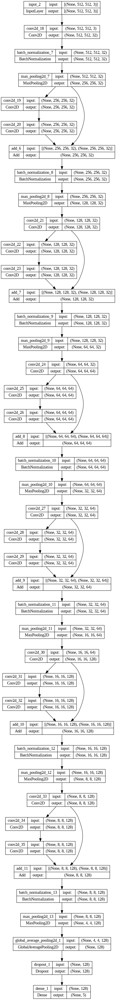

In [ ]:
plot_model(model15, "M15.png", show_shapes=True)

In [ ]:
model15.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 512, 512, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_18 (Conv2D)             (None, 512, 512, 32  2432        ['input_2[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization_7 (BatchNo  (None, 512, 512, 32  128        ['conv2d_18[0][0]']              
 rmalization)                   )                                                           

In [ ]:
!pip install visualkeras
import visualkeras
from collections import defaultdict

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


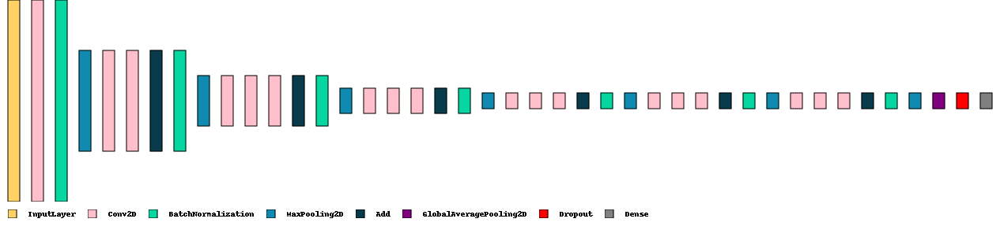

In [ ]:
color_map = defaultdict(dict)
color_map[Dropout]['fill'] = 'red'
color_map[GlobalAveragePooling2D]['fill'] = 'purple'
color_map[Dense]['fill'] = 'gray'
color_map[Conv2D]['fill'] = 'pink'

visualkeras.layered_view(model15, legend=True, scale_xy=0.5, scale_z=0.5, max_z=15, spacing=15, draw_funnel=False, draw_volume=False, color_map=color_map).show() # display using your system viewer

In [ ]:
history15 = model15.fit(train_image_gen,
                     validation_data = valid_image_gen,
                     callbacks =[earlyStop, model_checkpoint], epochs =30)

Epoch 1/30
563/563 [==============================] - 605s 1s/step - loss: 5.7363 - accuracy: 0.5181 - val_loss: 2.2161 - val_accuracy: 0.5876
Epoch 2/30
563/563 [==============================] - 506s 898ms/step - loss: 1.5992 - accuracy: 0.6763 - val_loss: 1.3352 - val_accuracy: 0.6831
Epoch 3/30
563/563 [==============================] - 550s 977ms/step - loss: 1.2225 - accuracy: 0.7166 - val_loss: 1.1914 - val_accuracy: 0.6960
Epoch 4/30
563/563 [==============================] - 493s 876ms/step - loss: 1.1062 - accuracy: 0.7432 - val_loss: 1.4500 - val_accuracy: 0.5391
Epoch 5/30
563/563 [==============================] - 495s 879ms/step - loss: 1.0238 - accuracy: 0.7614 - val_loss: 1.4032 - val_accuracy: 0.5876
Epoch 6/30
563/563 [==============================] - 504s 894ms/step - loss: 1.0004 - accuracy: 0.7698 - val_loss: 1.2905 - val_accuracy: 0.6431
Epoch 7/30
563/563 [==============================] - 497s 883ms/step - loss: 0.9647 - accuracy: 0.7763 - val_loss: 1.0485 - va

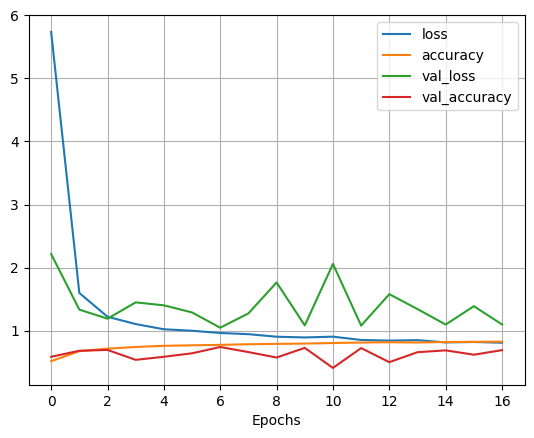

In [ ]:
losses_m15 = pd.DataFrame(model15.history.history).plot(xlabel="Epochs", grid=True);

In [ ]:
scores_m15 = model15.evaluate(test_image_gen)
print("Evaluation Accuracy: ", np.round(scores_m15[1],4))

71/71 [==============================] - 72s 1s/step - loss: 1.0270 - accuracy: 0.7516
Evaluation Accuracy:  0.7516


In [ ]:
model15.save("Project_M15 zip", save_format="tf")
# to download it from Colab to your computer
from google.colab import files
!zip -r Project_M15.zip "Project_M15 zip"/
files.download("Project_M15.zip")

model15.save("Project_M15", save_format="h5")
files.download("Project_M15")

  adding: Project_M15 zip/ (stored 0%)
  adding: Project_M15 zip/keras_metadata.pb (deflated 94%)
  adding: Project_M15 zip/assets/ (stored 0%)
  adding: Project_M15 zip/saved_model.pb (deflated 91%)
  adding: Project_M15 zip/fingerprint.pb (stored 0%)
  adding: Project_M15 zip/variables/ (stored 0%)
  adding: Project_M15 zip/variables/variables.index (deflated 75%)
  adding: Project_M15 zip/variables/variables.data-00000-of-00001 (deflated 7%)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## Model M16

This model slightly changes the M11 architecture. Skip connections now go from max pooling layer to convolution layer instead of convolution to convolution layer.

In [ ]:
from sklearn.metrics import f1_score as f1
from tensorflow.keras import Model, Input
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPool2D, Dense, Flatten, Dropout, add, GlobalAveragePooling2D, BatchNormalization
from tensorflow.keras.utils import plot_model
from tensorflow.keras.callbacks import ModelCheckpoint

from tensorflow.keras.initializers import he_normal #might want to switch to SELU and use LeCun
from tensorflow.keras.callbacks import EarlyStopping
from numpy.random import randint, choice

randomArray = randint(100,size = 18)

# early stopping parameters
earlyStop = EarlyStopping(monitor='val_loss', mode='min',
                          verbose = 1, patience=10,
                          restore_best_weights=True)#could change the min_delta

# model checkpoint
checkpoint_filepath = '/content/drive/My Drive/Deep Learning project/model16.hdf5'
model_checkpoint = ModelCheckpoint(
    filepath=checkpoint_filepath,
    save_weights_only=True,
    monitor='val_loss',
    mode='min',
    save_best_only=True)


#filters = number of feature maps created
#kernel = size of filter(7,7) deafault stride =1
#using RELU Activation
#padding set to same
#input shape is 512x512 pixel, 1=grayscale (3 for color/rbg img)

#CNN
inputs = Input(shape=(512,512,3))

x = Conv2D(filters=64, kernel_size=5, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(inputs)
x = BatchNormalization()(x)
block_1_output = MaxPool2D(2)(x)

x = Conv2D(filters=64, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(block_1_output)
x = Conv2D(filters=64, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(x)

x = add([x,block_1_output])
x = BatchNormalization()(x)
block_2_output = MaxPool2D(2)(x)

x = Conv2D(filters=64, kernel_size=3, activation='swish', padding='same',
                        kernel_initializer = he_normal(seed = choice(randomArray)))(block_2_output)
x = Conv2D(filters=64, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(x)
x = Conv2D(filters=64, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(x)

x = add([x,block_2_output])
x = BatchNormalization()(x)
block_3_output = MaxPool2D(2)(x)

x = Conv2D(filters=64, kernel_size=3, activation='swish', padding='same',
                        kernel_initializer = he_normal(seed = choice(randomArray)))(block_3_output)
x = Conv2D(filters=64, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(x)
x = Conv2D(filters=64, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(x)

x = add([x,block_3_output])
x = BatchNormalization()(x)
block_4_output = MaxPool2D(2)(x)

x = Conv2D(filters=64, kernel_size=3, activation='swish', padding='same',
                        kernel_initializer = he_normal(seed = choice(randomArray)))(block_4_output)
x = Conv2D(filters=64, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(x)
x = Conv2D(filters=64, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(x)

x = add([x,block_4_output])
x = BatchNormalization()(x)
block_5_output = MaxPool2D(2)(x)

x = Conv2D(filters=64, kernel_size=3, activation='swish', padding='same',
                        kernel_initializer = he_normal(seed = choice(randomArray)))(block_5_output)
x = Conv2D(filters=64, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(x)
x = Conv2D(filters=64, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(x)

x = add([x,block_5_output])
x = BatchNormalization()(x)
block_6_output = MaxPool2D(2)(x)

x = Conv2D(filters=64, kernel_size=3, activation='swish', padding='same',
                        kernel_initializer = he_normal(seed = choice(randomArray)))(block_6_output)
x = Conv2D(filters=64, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(x)
x = Conv2D(filters=64, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(x)

x = add([x,block_6_output])
x = BatchNormalization()(x)
x = MaxPool2D(2)(x)

# DNN
x = GlobalAveragePooling2D()(x)
x = Dropout(0.5)(x)
outputs = Dense(5, activation="softmax")(x)

model16 = Model(inputs, outputs)

model16.compile(loss='categorical_crossentropy',  #cat_ent for one-hot encoding classification problem
               optimizer='adam',
               metrics = ["accuracy"])

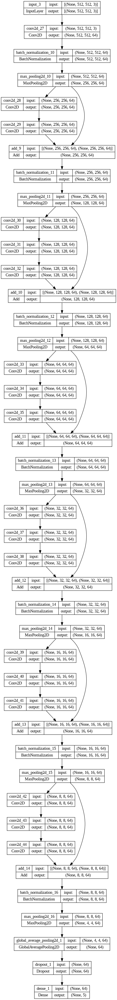

In [ ]:
plot_model(model16, "M16.png", show_shapes=True)

In [ ]:
model16.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 512, 512, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_27 (Conv2D)             (None, 512, 512, 64  4864        ['input_3[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization_10 (BatchN  (None, 512, 512, 64  256        ['conv2d_27[0][0]']              
 ormalization)                  )                                                           

In [ ]:
!pip install visualkeras
import visualkeras
from collections import defaultdict

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 993.0/993.0 kB 17.6 MB/s eta 0:00:00


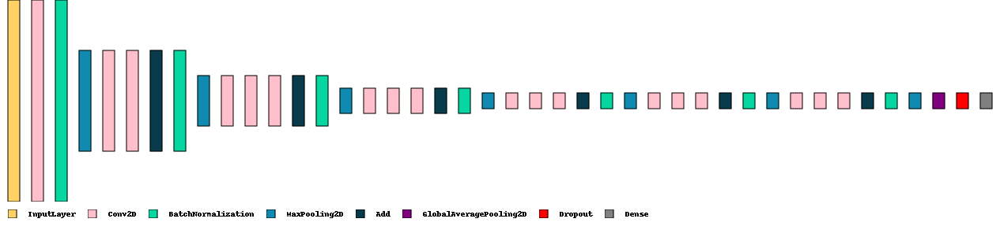

In [ ]:
color_map = defaultdict(dict)
color_map[Dropout]['fill'] = 'red'
color_map[GlobalAveragePooling2D]['fill'] = 'purple'
color_map[Dense]['fill'] = 'gray'
color_map[Conv2D]['fill'] = 'pink'

visualkeras.layered_view(model16, legend=True, scale_xy=0.5, scale_z=0.5, max_z=15, spacing=15, draw_funnel=False, draw_volume=False, color_map=color_map).show() # display using your system viewer

In [ ]:
history16 = model16.fit(train_image_gen,
                     validation_data = valid_image_gen,
                     callbacks =[earlyStop, model_checkpoint], epochs =30)

Epoch 1/30
563/563 [==============================] - 683s 1s/step - loss: 1.1178 - accuracy: 0.5739 - val_loss: 0.8722 - val_accuracy: 0.6742
Epoch 2/30
563/563 [==============================] - 600s 1s/step - loss: 0.7088 - accuracy: 0.7333 - val_loss: 0.8451 - val_accuracy: 0.6929
Epoch 3/30
563/563 [==============================] - 600s 1s/step - loss: 0.5890 - accuracy: 0.7808 - val_loss: 0.8263 - val_accuracy: 0.6911
Epoch 4/30
563/563 [==============================] - 604s 1s/step - loss: 0.5199 - accuracy: 0.8099 - val_loss: 0.5671 - val_accuracy: 0.7898
Epoch 5/30
563/563 [==============================] - 604s 1s/step - loss: 0.4612 - accuracy: 0.8335 - val_loss: 0.7172 - val_accuracy: 0.7351
Epoch 6/30
563/563 [==============================] - 602s 1s/step - loss: 0.4133 - accuracy: 0.8531 - val_loss: 0.4923 - val_accuracy: 0.8169
Epoch 7/30
563/563 [==============================] - 641s 1s/step - loss: 0.3649 - accuracy: 0.8719 - val_loss: 0.5548 - val_accuracy: 0.8067

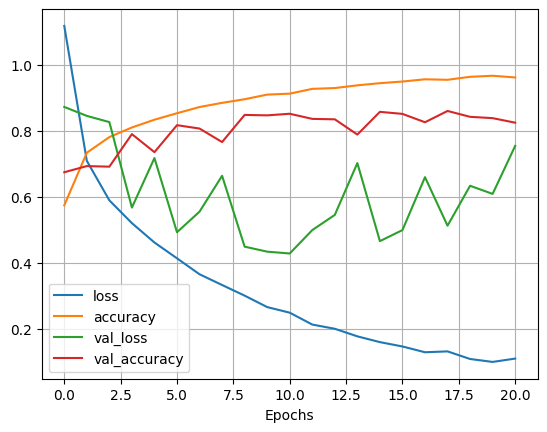

In [ ]:
losses_m16 = pd.DataFrame(model16.history.history).plot(xlabel="Epochs", grid=True);

In [ ]:
scores_m16 = model16.evaluate(test_image_gen)
print("Evaluation Accuracy: ", np.round(scores_m16[1],4))

71/71 [==============================] - 69s 966ms/step - loss: 0.4365 - accuracy: 0.8636
Evaluation Accuracy:  0.8636


In [ ]:
model16.save("Project_M16 zip", save_format="tf")
# to download it from Colab to your computer
from google.colab import files
!zip -r Project_M16.zip "Project_M16 zip"/
files.download("Project_M16.zip")

model16.save("Project_M16", save_format="h5")
files.download("Project_M16")

  adding: Project_M16 zip/ (stored 0%)
  adding: Project_M16 zip/fingerprint.pb (stored 0%)
  adding: Project_M16 zip/variables/ (stored 0%)
  adding: Project_M16 zip/variables/variables.data-00000-of-00001 (deflated 7%)
  adding: Project_M16 zip/variables/variables.index (deflated 77%)
  adding: Project_M16 zip/saved_model.pb (deflated 91%)
  adding: Project_M16 zip/assets/ (stored 0%)
  adding: Project_M16 zip/keras_metadata.pb (deflated 95%)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## Model M17

This uses the M13 architecture with separableconv2D layers plus 3 more separableconv2D layers. The average training time per epoch is 511.8 seconds.

In [ ]:
from sklearn.metrics import f1_score as f1
from tensorflow.keras import Model, Input
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPool2D, Dense, Flatten, Dropout, add, GlobalAveragePooling2D, BatchNormalization, SeparableConv2D
from tensorflow.keras.utils import plot_model
from tensorflow.keras.callbacks import ModelCheckpoint

from tensorflow.keras.initializers import he_normal #might want to switch to SELU and use LeCun
from tensorflow.keras.callbacks import EarlyStopping
from numpy.random import randint, choice

randomArray = randint(100,size = 18)

# early stopping parameters
earlyStop = EarlyStopping(monitor='val_loss', mode='min',
                          verbose = 1, patience=10,
                          restore_best_weights=True)#could change the min_delta

# model checkpoint
checkpoint_filepath = '/content/drive/My Drive/Deep Learning project/model17.hdf5'
model_checkpoint = ModelCheckpoint(
    filepath=checkpoint_filepath,
    save_weights_only=True,
    monitor='val_loss',
    mode='min',
    save_best_only=True)


#filters = number of feature maps created
#kernel = size of filter(7,7) deafault stride =1
#using RELU Activation
#padding set to same
#input shape is 512x512 pixel, 1=grayscale (3 for color/rbg img)

#CNN
inputs = Input(shape=(512,512,3))

x = SeparableConv2D(filters=32, kernel_size=5, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(inputs)
x = BatchNormalization()(x)
block_1_output = MaxPool2D(2)(x)

x = SeparableConv2D(filters=32, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(block_1_output)
x = SeparableConv2D(filters=32, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(x)

x = add([x,block_1_output])
x = BatchNormalization()(x)
x = MaxPool2D(2)(x)

block_2_output = SeparableConv2D(filters=32, kernel_size=3, activation='swish', padding='same',
                        kernel_initializer = he_normal(seed = choice(randomArray)))(x)
x = SeparableConv2D(filters=32, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(block_2_output)
x = SeparableConv2D(filters=32, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(x)

x = add([x,block_2_output])
x = BatchNormalization()(x)
x = MaxPool2D(2)(x)

block_3_output = SeparableConv2D(filters=64, kernel_size=3, activation='swish', padding='same',
                        kernel_initializer = he_normal(seed = choice(randomArray)))(x)
x = SeparableConv2D(filters=64, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(block_3_output)
x = SeparableConv2D(filters=64, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(x)

x = add([x,block_3_output])
x = BatchNormalization()(x)
x = MaxPool2D(2)(x)

block_4_output = SeparableConv2D(filters=64, kernel_size=3, activation='swish', padding='same',
                        kernel_initializer = he_normal(seed = choice(randomArray)))(x)
x = SeparableConv2D(filters=64, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(block_4_output)
x = SeparableConv2D(filters=64, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(x)

x = add([x,block_4_output])
x = BatchNormalization()(x)
x = MaxPool2D(2)(x)

block_5_output = SeparableConv2D(filters=128, kernel_size=3, activation='swish', padding='same',
                        kernel_initializer = he_normal(seed = choice(randomArray)))(x)
x = SeparableConv2D(filters=128, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(block_5_output)
x = SeparableConv2D(filters=128, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(x)

x = add([x,block_5_output])
x = BatchNormalization()(x)
x = MaxPool2D(2)(x)

block_6_output = SeparableConv2D(filters=128, kernel_size=3, activation='swish', padding='same',
                        kernel_initializer = he_normal(seed = choice(randomArray)))(x)
x = SeparableConv2D(filters=128, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(block_6_output)
x = SeparableConv2D(filters=128, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(x)

x = add([x,block_6_output])
x = BatchNormalization()(x)
x = MaxPool2D(2)(x)

block_7_output = SeparableConv2D(filters=128, kernel_size=3, activation='swish', padding='same',
                        kernel_initializer = he_normal(seed = choice(randomArray)))(x)
x = SeparableConv2D(filters=128, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(block_7_output)
x = SeparableConv2D(filters=128, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(x)

x = add([x,block_7_output])
x = BatchNormalization()(x)
x = MaxPool2D(2)(x)

# DNN
x = GlobalAveragePooling2D()(x)
x = Dropout(0.5)(x)
outputs = Dense(5, activation="softmax")(x)

model17 = Model(inputs, outputs)

model17.compile(loss='categorical_crossentropy',  #cat_ent for one-hot encoding classification problem
               optimizer='adam',
               metrics = ["accuracy"])

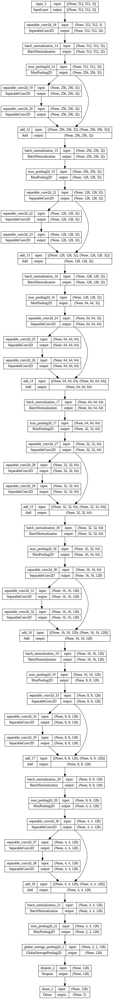

In [ ]:
plot_model(model17, "M17.png", show_shapes=True)

In [ ]:
model17.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 512, 512, 3  0           []                               
                                )]                                                                
                                                                                                  
 separable_conv2d_18 (Separable  (None, 512, 512, 32  203        ['input_3[0][0]']                
 Conv2D)                        )                                                                 
                                                                                                  
 batch_normalization_14 (BatchN  (None, 512, 512, 32  128        ['separable_conv2d_18[0][0]']    
 ormalization)                  )                                                           

In [ ]:
!pip install visualkeras
import visualkeras
from collections import defaultdict

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 993.0/993.0 kB 40.8 MB/s eta 0:00:00


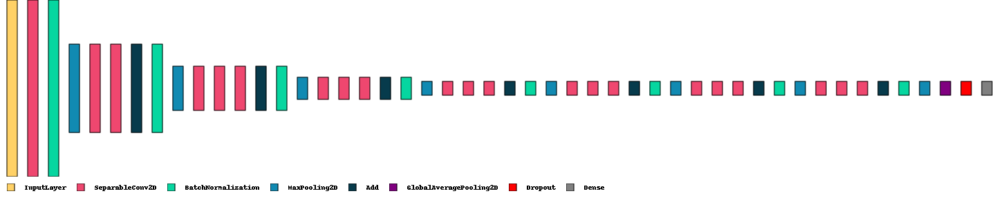

In [ ]:
color_map = defaultdict(dict)
color_map[Dropout]['fill'] = 'red'
color_map[GlobalAveragePooling2D]['fill'] = 'purple'
color_map[Dense]['fill'] = 'gray'
color_map[Conv2D]['fill'] = 'pink'

visualkeras.layered_view(model17, legend=True, scale_xy=0.5, scale_z=0.5, max_z=15, spacing=15, draw_funnel=False, draw_volume=False, color_map=color_map).show() # display using your system viewer

In [ ]:
history17 = model17.fit(train_image_gen,
                     validation_data = valid_image_gen,
                     callbacks =[earlyStop, model_checkpoint], epochs =30)

Epoch 1/30
563/563 [==============================] - 652s 1s/step - loss: 1.1961 - accuracy: 0.5439 - val_loss: 1.4544 - val_accuracy: 0.3449
Epoch 2/30
563/563 [==============================] - 509s 904ms/step - loss: 0.8368 - accuracy: 0.6823 - val_loss: 1.2032 - val_accuracy: 0.6076
Epoch 3/30
563/563 [==============================] - 503s 892ms/step - loss: 0.7153 - accuracy: 0.7331 - val_loss: 0.7427 - val_accuracy: 0.7400
Epoch 4/30
563/563 [==============================] - 497s 883ms/step - loss: 0.6342 - accuracy: 0.7641 - val_loss: 0.7119 - val_accuracy: 0.7480
Epoch 5/30
563/563 [==============================] - 492s 874ms/step - loss: 0.5663 - accuracy: 0.7929 - val_loss: 1.0617 - val_accuracy: 0.6742
Epoch 6/30
563/563 [==============================] - 564s 1s/step - loss: 0.5027 - accuracy: 0.8159 - val_loss: 0.7100 - val_accuracy: 0.7511
Epoch 7/30
563/563 [==============================] - 486s 863ms/step - loss: 0.4534 - accuracy: 0.8347 - val_loss: 0.5890 - val_a

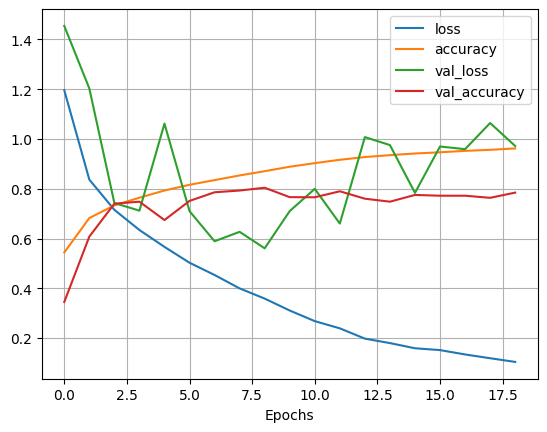

In [ ]:
losses_m17 = pd.DataFrame(model17.history.history).plot(xlabel="Epochs", grid=True);

In [ ]:
scores_m17 = model17.evaluate(test_image_gen)
print("Evaluation Accuracy: ", np.round(scores_m17[1],4))

71/71 [==============================] - 49s 692ms/step - loss: 0.5422 - accuracy: 0.8111
Evaluation Accuracy:  0.8111


In [ ]:
model17.save("Project_M17 zip", save_format="tf")
# to download it from Colab to your computer
from google.colab import files
!zip -r Project_M17.zip "Project_M17 zip"/
files.download("Project_M17.zip")

model17.save("Project_M17", save_format="h5")
files.download("Project_M17")

  adding: Project_M17 zip/ (stored 0%)
  adding: Project_M17 zip/assets/ (stored 0%)
  adding: Project_M17 zip/saved_model.pb (deflated 91%)
  adding: Project_M17 zip/variables/ (stored 0%)
  adding: Project_M17 zip/variables/variables.data-00000-of-00001 (deflated 9%)
  adding: Project_M17 zip/variables/variables.index (deflated 78%)
  adding: Project_M17 zip/keras_metadata.pb (deflated 95%)
  adding: Project_M17 zip/fingerprint.pb (stored 0%)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## Model M18

This uses the M17 architecture with conv2D layers instead of separableconv2d layers. The average training time per epoch is 523 seconds.

In [ ]:
from sklearn.metrics import f1_score as f1
from tensorflow.keras import Model, Input
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPool2D, Dense, Flatten, Dropout, add, GlobalAveragePooling2D, BatchNormalization, SeparableConv2D
from tensorflow.keras.utils import plot_model
from tensorflow.keras.callbacks import ModelCheckpoint

from tensorflow.keras.initializers import he_normal #might want to switch to SELU and use LeCun
from tensorflow.keras.callbacks import EarlyStopping
from numpy.random import randint, choice

randomArray = randint(100,size = 21)

# early stopping parameters
earlyStop = EarlyStopping(monitor='val_loss', mode='min',
                          verbose = 1, patience=10,
                          restore_best_weights=True)#could change the min_delta

# model checkpoint
checkpoint_filepath = '/content/drive/My Drive/Deep Learning project/model18.hdf5'
model_checkpoint = ModelCheckpoint(
    filepath=checkpoint_filepath,
    save_weights_only=True,
    monitor='val_loss',
    mode='min',
    save_best_only=True)


#filters = number of feature maps created
#kernel = size of filter(7,7) deafault stride =1
#using RELU Activation
#padding set to same
#input shape is 512x512 pixel, 1=grayscale (3 for color/rbg img)

#CNN
inputs = Input(shape=(512,512,3))

x = Conv2D(filters=32, kernel_size=5, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(inputs)
x = BatchNormalization()(x)
block_1_output = MaxPool2D(2)(x)

x = Conv2D(filters=32, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(block_1_output)
x = Conv2D(filters=32, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(x)

x = add([x,block_1_output])
x = BatchNormalization()(x)
x = MaxPool2D(2)(x)

block_2_output = Conv2D(filters=32, kernel_size=3, activation='swish', padding='same',
                        kernel_initializer = he_normal(seed = choice(randomArray)))(x)
x = Conv2D(filters=32, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(block_2_output)
x = Conv2D(filters=32, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(x)

x = add([x,block_2_output])
x = BatchNormalization()(x)
x = MaxPool2D(2)(x)

block_3_output = Conv2D(filters=64, kernel_size=3, activation='swish', padding='same',
                        kernel_initializer = he_normal(seed = choice(randomArray)))(x)
x = Conv2D(filters=64, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(block_3_output)
x = Conv2D(filters=64, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(x)

x = add([x,block_3_output])
x = BatchNormalization()(x)
x = MaxPool2D(2)(x)

block_4_output = Conv2D(filters=64, kernel_size=3, activation='swish', padding='same',
                        kernel_initializer = he_normal(seed = choice(randomArray)))(x)
x = Conv2D(filters=64, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(block_4_output)
x = Conv2D(filters=64, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(x)

x = add([x,block_4_output])
x = BatchNormalization()(x)
x = MaxPool2D(2)(x)

block_5_output = Conv2D(filters=128, kernel_size=3, activation='swish', padding='same',
                        kernel_initializer = he_normal(seed = choice(randomArray)))(x)
x = Conv2D(filters=128, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(block_5_output)
x = Conv2D(filters=128, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(x)

x = add([x,block_5_output])
x = BatchNormalization()(x)
x = MaxPool2D(2)(x)

block_6_output = Conv2D(filters=128, kernel_size=3, activation='swish', padding='same',
                        kernel_initializer = he_normal(seed = choice(randomArray)))(x)
x = Conv2D(filters=128, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(block_6_output)
x = Conv2D(filters=128, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(x)

x = add([x,block_6_output])
x = BatchNormalization()(x)
x = MaxPool2D(2)(x)

block_7_output = Conv2D(filters=128, kernel_size=3, activation='swish', padding='same',
                        kernel_initializer = he_normal(seed = choice(randomArray)))(x)
x = Conv2D(filters=128, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(block_7_output)
x = Conv2D(filters=128, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(x)

x = add([x,block_7_output])
x = BatchNormalization()(x)
x = MaxPool2D(2)(x)

# DNN
x = GlobalAveragePooling2D()(x)
x = Dropout(0.5)(x)
outputs = Dense(5, activation="softmax")(x)

model18 = Model(inputs, outputs)

model18.compile(loss='categorical_crossentropy',  #cat_ent for one-hot encoding classification problem
               optimizer='adam',
               metrics = ["accuracy"])

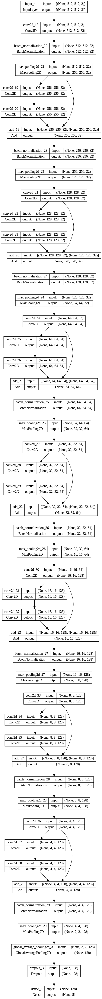

In [ ]:
plot_model(model18, "M18.png", show_shapes=True)

In [ ]:
model18.summary()

Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_4 (InputLayer)           [(None, 512, 512, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_18 (Conv2D)             (None, 512, 512, 32  2432        ['input_4[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization_22 (BatchN  (None, 512, 512, 32  128        ['conv2d_18[0][0]']              
 ormalization)                  )                                                           

In [ ]:
!pip install visualkeras
import visualkeras
from collections import defaultdict

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


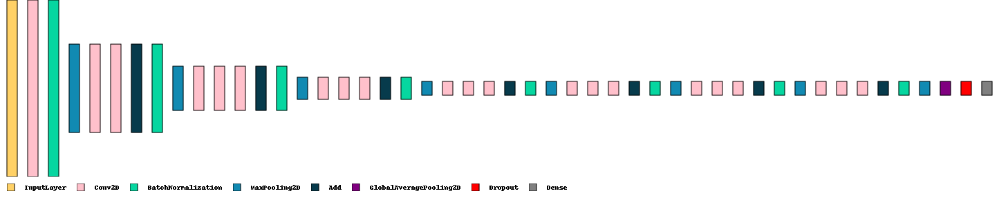

In [ ]:
color_map = defaultdict(dict)
color_map[Dropout]['fill'] = 'red'
color_map[GlobalAveragePooling2D]['fill'] = 'purple'
color_map[Dense]['fill'] = 'gray'
color_map[Conv2D]['fill'] = 'pink'

visualkeras.layered_view(model18, legend=True, scale_xy=0.5, scale_z=0.5, max_z=15, spacing=15, draw_funnel=False, draw_volume=False, color_map=color_map).show() # display using your system viewer

In [ ]:
history18 = model18.fit(train_image_gen,
                     validation_data = valid_image_gen,
                     callbacks =[earlyStop, model_checkpoint], epochs =30)

Epoch 1/30
563/563 [==============================] - 793s 1s/step - loss: 1.2812 - accuracy: 0.5144 - val_loss: 0.9315 - val_accuracy: 0.6236
Epoch 2/30
563/563 [==============================] - 536s 951ms/step - loss: 0.7703 - accuracy: 0.7117 - val_loss: 0.9842 - val_accuracy: 0.6409
Epoch 3/30
563/563 [==============================] - 499s 885ms/step - loss: 0.6065 - accuracy: 0.7780 - val_loss: 0.6084 - val_accuracy: 0.7733
Epoch 4/30
563/563 [==============================] - 499s 886ms/step - loss: 0.5185 - accuracy: 0.8084 - val_loss: 0.6183 - val_accuracy: 0.7862
Epoch 5/30
563/563 [==============================] - 503s 893ms/step - loss: 0.4495 - accuracy: 0.8381 - val_loss: 0.5446 - val_accuracy: 0.8062
Epoch 6/30
563/563 [==============================] - 501s 890ms/step - loss: 0.3967 - accuracy: 0.8573 - val_loss: 0.4903 - val_accuracy: 0.8236
Epoch 7/30
563/563 [==============================] - 501s 889ms/step - loss: 0.3559 - accuracy: 0.8730 - val_loss: 0.4985 - va

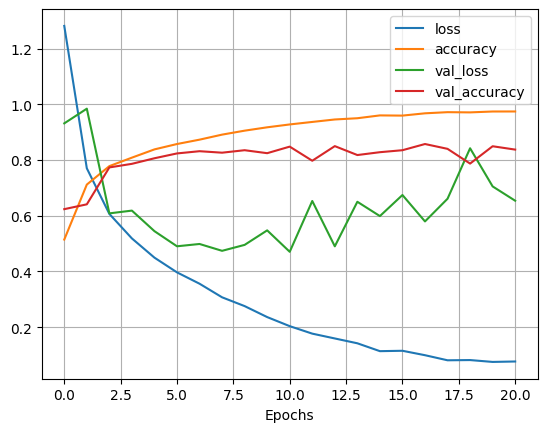

In [ ]:
losses_m18 = pd.DataFrame(model18.history.history).plot(xlabel="Epochs", grid=True);

In [ ]:
scores_m18 = model18.evaluate(test_image_gen)
print("Evaluation Accuracy: ", np.round(scores_m18[1],4))

71/71 [==============================] - 70s 981ms/step - loss: 0.5130 - accuracy: 0.8320
Evaluation Accuracy:  0.832


In [ ]:
model18.save("Project_M18 zip", save_format="tf")
# to download it from Colab to your computer
from google.colab import files
!zip -r Project_M18.zip "Project_M18 zip"/
files.download("Project_M18.zip")

model18.save("Project_M18", save_format="h5")
files.download("Project_M18")

  adding: Project_M18 zip/ (stored 0%)
  adding: Project_M18 zip/assets/ (stored 0%)
  adding: Project_M18 zip/saved_model.pb (deflated 91%)
  adding: Project_M18 zip/variables/ (stored 0%)
  adding: Project_M18 zip/variables/variables.data-00000-of-00001 (deflated 7%)
  adding: Project_M18 zip/variables/variables.index (deflated 76%)
  adding: Project_M18 zip/keras_metadata.pb (deflated 95%)
  adding: Project_M18 zip/fingerprint.pb (stored 0%)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## Model M19 (full dataset)

This model trains the architecture of M16 on the full dataset with data augmentation.


### Load full dataset

In [ ]:
from google.colab import drive

drive.mount('/content/drive/')

Mounted at /content/drive/


In [ ]:
# import the packages we will use
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import tensorflow as tf
import os
import zipfile

from tensorflow.random import set_seed

np.random.seed(15)
set_seed(15)

!ls

drive  M19.png	project_stage345_data_full  sample_data


In [ ]:
with zipfile.ZipFile('/content/drive/My Drive/Deep Learning project/project_stages345_data_full.zip','r') as zip_ref:
  zip_ref.extractall()

!ls

drive  M19.png	project_stage345_data_full  sample_data


In [ ]:
# path to store the stratified copy of the dataset at
train_path = '/content/project_stage345_data_full'

# paths of the test, train, and validation dataset
#test_path = data_path + '/test'
#train_path = data_path + '/train'
#valid_path = data_path + '/val'

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [ ]:
image_shape = (512,512,3) # specify 512 x 512 as the dimensions to resize all images to; will default to (256, 256) if not specified
batch_size = 32 #this is the default

# Training with data augmentation takes a long time because all the image transformations are done by the CPU before being passed to the GPU
# for training. We will instead only use ImageDataGenerator to split the dataset into training and validation sets. The image preprocessing
# will instead be done by adding transformation layers in the model. This should allow the data augmentation to be done by the GPU instead.
image_gen = ImageDataGenerator(fill_mode='nearest', validation_split=0.1, rescale=1./255)

# class_mode='sparse' is used for multi-label classification. 'categorical' is another possibility
train_image_gen = image_gen.flow_from_directory(train_path,
                                                target_size=image_shape[:2],
                                                class_mode='categorical',
                                                batch_size=batch_size,
                                                subset='training')

# loads and iterates validation dataset
valid_image_gen = image_gen.flow_from_directory(train_path,
                                                target_size=image_shape[:2],
                                                class_mode='categorical',
                                                batch_size=batch_size,
                                                shuffle=False,
                                                subset='validation')

Found 20250 images belonging to 5 classes.
Found 2250 images belonging to 5 classes.


### Create and train the model (Part 1)

In [ ]:
from sklearn.metrics import f1_score as f1
from tensorflow.keras import Model, Input
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPool2D, Dense, Flatten, Dropout, add, GlobalAveragePooling2D, BatchNormalization, RandomFlip, RandomRotation, RandomZoom, Rescaling, RandomTranslation, RandomBrightness, RandomHeight, RandomWidth
from tensorflow.keras.utils import plot_model
from tensorflow.keras.callbacks import ModelCheckpoint

from tensorflow.keras.initializers import he_normal #might want to switch to SELU and use LeCun
from tensorflow.keras.callbacks import EarlyStopping
from numpy.random import randint, choice

randomArray = randint(100,size = 18)

# model checkpoint
checkpoint_filepath = '/content/drive/My Drive/Deep Learning project/model19_alt2.hdf5'
model_checkpoint = ModelCheckpoint(
    filepath=checkpoint_filepath,
    save_weights_only=True,
    monitor='val_loss',
    mode='min',
    save_best_only=True)


#filters = number of feature maps created
#kernel = size of filter(7,7) deafault stride =1
#using RELU Activation
#padding set to same
#input shape is 512x512 pixel, 1=grayscale (3 for color/rbg img)

#CNN
inputs = Input(shape=(512,512,3))

# Add the preprocessing/augmentation layers.
x = RandomRotation(0.45)(inputs)
x = RandomTranslation((-0.05, 0.05),(-0.05, 0.05))(x)
x = RandomZoom(.1, .1)(x)
x = RandomFlip(mode='horizontal')(x)
x = RandomBrightness(0.2, value_range=(0.0,1.0))(x)

x = Conv2D(filters=64, kernel_size=5, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(x)
x = BatchNormalization()(x)
block_1_output = MaxPool2D(2)(x)

x = Conv2D(filters=64, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(block_1_output)
x = Conv2D(filters=64, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(x)

x = add([x,block_1_output])
x = BatchNormalization()(x)
block_2_output = MaxPool2D(2)(x)

x = Conv2D(filters=64, kernel_size=3, activation='swish', padding='same',
                        kernel_initializer = he_normal(seed = choice(randomArray)))(block_2_output)
x = Conv2D(filters=64, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(x)
x = Conv2D(filters=64, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(x)

x = add([x,block_2_output])
x = BatchNormalization()(x)
block_3_output = MaxPool2D(2)(x)

x = Conv2D(filters=64, kernel_size=3, activation='swish', padding='same',
                        kernel_initializer = he_normal(seed = choice(randomArray)))(block_3_output)
x = Conv2D(filters=64, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(x)
x = Conv2D(filters=64, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(x)

x = add([x,block_3_output])
x = BatchNormalization()(x)
block_4_output = MaxPool2D(2)(x)

x = Conv2D(filters=64, kernel_size=3, activation='swish', padding='same',
                        kernel_initializer = he_normal(seed = choice(randomArray)))(block_4_output)
x = Conv2D(filters=64, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(x)
x = Conv2D(filters=64, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(x)

x = add([x,block_4_output])
x = BatchNormalization()(x)
block_5_output = MaxPool2D(2)(x)

x = Conv2D(filters=64, kernel_size=3, activation='swish', padding='same',
                        kernel_initializer = he_normal(seed = choice(randomArray)))(block_5_output)
x = Conv2D(filters=64, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(x)
x = Conv2D(filters=64, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(x)

x = add([x,block_5_output])
x = BatchNormalization()(x)
block_6_output = MaxPool2D(2)(x)

x = Conv2D(filters=64, kernel_size=3, activation='swish', padding='same',
                        kernel_initializer = he_normal(seed = choice(randomArray)))(block_6_output)
x = Conv2D(filters=64, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(x)
x = Conv2D(filters=64, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(x)

x = add([x,block_6_output])
x = BatchNormalization()(x)
x = MaxPool2D(2)(x)

# DNN
x = GlobalAveragePooling2D()(x)
x = Dropout(0.5)(x)
outputs = Dense(5, activation="softmax")(x)

model19 = Model(inputs, outputs)

model19.compile(loss='categorical_crossentropy',  #cat_ent for one-hot encoding classification problem
               optimizer='adam',
               metrics = ["accuracy"])

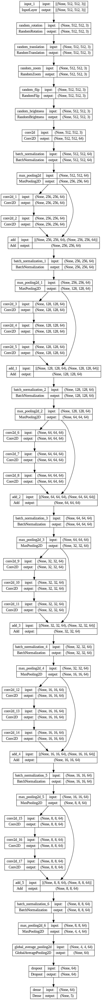

In [ ]:
plot_model(model19, "M19.png", show_shapes=True)

In [ ]:
model19.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 512, 512, 3  0           []                               
                                )]                                                                
                                                                                                  
 random_rotation (RandomRotatio  (None, 512, 512, 3)  0          ['input_1[0][0]']                
 n)                                                                                               
                                                                                                  
 random_translation (RandomTran  (None, 512, 512, 3)  0          ['random_rotation[0][0]']        
 slation)                                                                                     

In [ ]:
!pip install visualkeras
import visualkeras
from collections import defaultdict

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


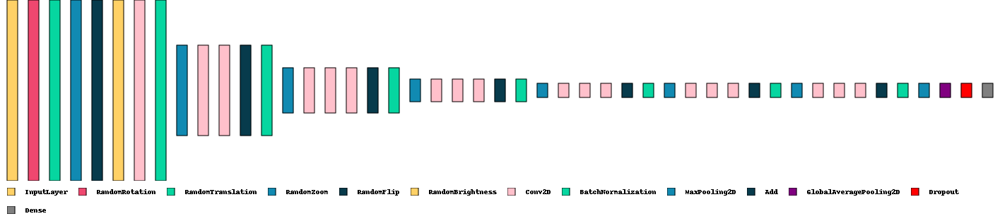

In [ ]:
color_map = defaultdict(dict)
color_map[Dropout]['fill'] = 'red'
color_map[GlobalAveragePooling2D]['fill'] = 'purple'
color_map[Dense]['fill'] = 'gray'
color_map[Conv2D]['fill'] = 'pink'

visualkeras.layered_view(model19, legend=True, scale_xy=0.5, scale_z=0.5, max_z=15, spacing=15, draw_funnel=False, draw_volume=False, color_map=color_map).show() # display using your system viewer

In [ ]:
history19 = model19.fit(train_image_gen,
                     validation_data = valid_image_gen,
                     callbacks =[model_checkpoint], epochs =60,
                     )

Epoch 1/60
633/633 [==============================] - 857s 1s/step - loss: 1.3880 - accuracy: 0.4458 - val_loss: 1.3164 - val_accuracy: 0.4653
Epoch 2/60
633/633 [==============================] - 677s 1s/step - loss: 1.0644 - accuracy: 0.5810 - val_loss: 1.1427 - val_accuracy: 0.5436
Epoch 3/60
633/633 [==============================] - 675s 1s/step - loss: 0.9500 - accuracy: 0.6276 - val_loss: 1.1929 - val_accuracy: 0.5098
Epoch 4/60
633/633 [==============================] - 676s 1s/step - loss: 0.8670 - accuracy: 0.6669 - val_loss: 0.9026 - val_accuracy: 0.6489
Epoch 5/60
633/633 [==============================] - 677s 1s/step - loss: 0.7878 - accuracy: 0.7007 - val_loss: 0.9517 - val_accuracy: 0.6324
Epoch 6/60
633/633 [==============================] - 677s 1s/step - loss: 0.7475 - accuracy: 0.7163 - val_loss: 0.8137 - val_accuracy: 0.6747
Epoch 7/60
633/633 [==============================] - 679s 1s/step - loss: 0.7143 - accuracy: 0.7314 - val_loss: 0.7901 - val_accuracy: 0.7018

### Train model (Part 2)

In [ ]:
history19 = model19.fit(train_image_gen,
                     validation_data = valid_image_gen,
                     callbacks =[model_checkpoint], epochs =100)

Epoch 1/100
633/633 [==============================] - 1102s 2s/step - loss: 0.2974 - accuracy: 0.8945 - val_loss: 0.5528 - val_accuracy: 0.8084
Epoch 2/100
633/633 [==============================] - 807s 1s/step - loss: 0.2993 - accuracy: 0.8952 - val_loss: 0.3760 - val_accuracy: 0.8676
Epoch 3/100
633/633 [==============================] - 677s 1s/step - loss: 0.3012 - accuracy: 0.8909 - val_loss: 0.3697 - val_accuracy: 0.8649
Epoch 4/100
633/633 [==============================] - 678s 1s/step - loss: 0.2929 - accuracy: 0.8960 - val_loss: 0.4108 - val_accuracy: 0.8631
Epoch 5/100
633/633 [==============================] - 851s 1s/step - loss: 0.2923 - accuracy: 0.8979 - val_loss: 0.3977 - val_accuracy: 0.8627
Epoch 6/100
633/633 [==============================] - 678s 1s/step - loss: 0.2805 - accuracy: 0.9006 - val_loss: 0.3296 - val_accuracy: 0.8796
Epoch 7/100
633/633 [==============================] - 679s 1s/step - loss: 0.2922 - accuracy: 0.8971 - val_loss: 0.3395 - val_accuracy

### Save Model (Part 3)

In [ ]:
from sklearn.metrics import f1_score as f1
from tensorflow.keras import Model, Input
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPool2D, Dense, Flatten, Dropout, add, GlobalAveragePooling2D, BatchNormalization, RandomFlip, RandomRotation, RandomZoom, Rescaling, RandomTranslation, RandomBrightness, RandomHeight, RandomWidth
from tensorflow.keras.utils import plot_model
from tensorflow.keras.callbacks import ModelCheckpoint

from tensorflow.keras.initializers import he_normal #might want to switch to SELU and use LeCun
from tensorflow.keras.callbacks import EarlyStopping
from numpy.random import randint, choice

randomArray = randint(100,size = 18)

# model checkpoint
checkpoint_filepath = '/content/drive/My Drive/Deep Learning project/model19_alt2.hdf5'
model_checkpoint = ModelCheckpoint(
    filepath=checkpoint_filepath,
    save_weights_only=True,
    monitor='val_loss',
    mode='min',
    save_best_only=True)


#filters = number of feature maps created
#kernel = size of filter(7,7) deafault stride =1
#using RELU Activation
#padding set to same
#input shape is 512x512 pixel, 1=grayscale (3 for color/rbg img)

#CNN
inputs = Input(shape=(512,512,3))

# Add the preprocessing/augmentation layers.
x = RandomRotation(0.45)(inputs)
x = RandomTranslation((-0.05, 0.05),(-0.05, 0.05))(x)
x = RandomZoom(.1, .1)(x)
x = RandomFlip(mode='horizontal')(x)
x = RandomBrightness(0.2, value_range=(0.0,1.0))(x)

x = Conv2D(filters=64, kernel_size=5, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(x)
x = BatchNormalization()(x)
block_1_output = MaxPool2D(2)(x)

x = Conv2D(filters=64, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(block_1_output)
x = Conv2D(filters=64, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(x)

x = add([x,block_1_output])
x = BatchNormalization()(x)
block_2_output = MaxPool2D(2)(x)

x = Conv2D(filters=64, kernel_size=3, activation='swish', padding='same',
                        kernel_initializer = he_normal(seed = choice(randomArray)))(block_2_output)
x = Conv2D(filters=64, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(x)
x = Conv2D(filters=64, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(x)

x = add([x,block_2_output])
x = BatchNormalization()(x)
block_3_output = MaxPool2D(2)(x)

x = Conv2D(filters=64, kernel_size=3, activation='swish', padding='same',
                        kernel_initializer = he_normal(seed = choice(randomArray)))(block_3_output)
x = Conv2D(filters=64, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(x)
x = Conv2D(filters=64, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(x)

x = add([x,block_3_output])
x = BatchNormalization()(x)
block_4_output = MaxPool2D(2)(x)

x = Conv2D(filters=64, kernel_size=3, activation='swish', padding='same',
                        kernel_initializer = he_normal(seed = choice(randomArray)))(block_4_output)
x = Conv2D(filters=64, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(x)
x = Conv2D(filters=64, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(x)

x = add([x,block_4_output])
x = BatchNormalization()(x)
block_5_output = MaxPool2D(2)(x)

x = Conv2D(filters=64, kernel_size=3, activation='swish', padding='same',
                        kernel_initializer = he_normal(seed = choice(randomArray)))(block_5_output)
x = Conv2D(filters=64, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(x)
x = Conv2D(filters=64, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(x)

x = add([x,block_5_output])
x = BatchNormalization()(x)
block_6_output = MaxPool2D(2)(x)

x = Conv2D(filters=64, kernel_size=3, activation='swish', padding='same',
                        kernel_initializer = he_normal(seed = choice(randomArray)))(block_6_output)
x = Conv2D(filters=64, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(x)
x = Conv2D(filters=64, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(x)

x = add([x,block_6_output])
x = BatchNormalization()(x)
x = MaxPool2D(2)(x)

# DNN
x = GlobalAveragePooling2D()(x)
x = Dropout(0.5)(x)
outputs = Dense(5, activation="softmax")(x)

model19 = Model(inputs, outputs)

model19.compile(loss='categorical_crossentropy',  #cat_ent for one-hot encoding classification problem
               optimizer='adam',
               metrics = ["accuracy"])

# Recreate the exact same model, including its weights and the optimizer
model19.load_weights(checkpoint_filepath) # model should be located in google drive

In [ ]:
history19 = model19.fit(train_image_gen,
                     validation_data = valid_image_gen,
                     callbacks =[model_checkpoint], epochs =100)

In [ ]:
losses_m19 = pd.DataFrame(model19.history.history).plot(xlabel="Epochs", grid=True);

In [ ]:
model19.save("Project_M19_alt2_4 zip", save_format="tf")
# to download it from Colab to your computer
from google.colab import files
!zip -r Project_M19_alt2_4.zip "Project_M19_alt2_4 zip"/
files.download("Project_M19_alt2_4.zip")

  adding: Project_M19_alt2_4 zip/ (stored 0%)
  adding: Project_M19_alt2_4 zip/assets/ (stored 0%)
  adding: Project_M19_alt2_4 zip/saved_model.pb (deflated 91%)
  adding: Project_M19_alt2_4 zip/variables/ (stored 0%)
  adding: Project_M19_alt2_4 zip/variables/variables.data-00000-of-00001 (deflated 8%)
  adding: Project_M19_alt2_4 zip/variables/variables.index (deflated 74%)
  adding: Project_M19_alt2_4 zip/keras_metadata.pb (deflated 94%)
  adding: Project_M19_alt2_4 zip/fingerprint.pb (stored 0%)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## Model M20 (full dataset, final)

This model trains the architecture of M13 on the full dataset with data augmentation.

### Load full dataset

In [ ]:
from google.colab import drive

drive.mount('/content/drive/')

Mounted at /content/drive/


In [ ]:
# import the packages we will use
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import tensorflow as tf
import os
import zipfile

from tensorflow.random import set_seed

np.random.seed(15)
set_seed(15)

!ls

drive  sample_data


In [ ]:
with zipfile.ZipFile('/content/drive/My Drive/Deep Learning project/project_stages345_data_full.zip','r') as zip_ref:
  zip_ref.extractall()

!ls

drive  project_stage345_data_full  sample_data


In [ ]:
# path to store the stratified copy of the dataset at
train_path = '/content/project_stage345_data_full'

# paths of the test, train, and validation dataset
#test_path = data_path + '/test'
#train_path = data_path + '/train'
#valid_path = data_path + '/val'

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [ ]:
image_shape = (512,512,3) # specify 512 x 512 as the dimensions to resize all images to; will default to (256, 256) if not specified
batch_size = 32 #this is the default

# Training with data augmentation takes a long time because all the image transformations are done by the CPU before being passed to the GPU
# for training. We will instead only use ImageDataGenerator to split the dataset into training and validation sets. The image preprocessing
# will instead be done by adding transformation layers in the model. This should allow the data augmentation to be done by the GPU instead.
image_gen = ImageDataGenerator(fill_mode='nearest', validation_split=0.1, rescale=1./255)

# class_mode='sparse' is used for multi-label classification. 'categorical' is another possibility
train_image_gen = image_gen.flow_from_directory(train_path,
                                                target_size=image_shape[:2],
                                                class_mode='categorical',
                                                batch_size=batch_size,
                                                subset='training')

# loads and iterates validation dataset
valid_image_gen = image_gen.flow_from_directory(train_path,
                                                target_size=image_shape[:2],
                                                class_mode='categorical',
                                                batch_size=batch_size,
                                                shuffle=False,
                                                subset='validation')

Found 20250 images belonging to 5 classes.
Found 2250 images belonging to 5 classes.


### Create and train the model (Part 1)

In [ ]:
from sklearn.metrics import f1_score as f1
from tensorflow.keras import Model, Input
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import SeparableConv2D, Conv2D, MaxPool2D, Dense, Flatten, Dropout, add, GlobalAveragePooling2D, BatchNormalization, RandomFlip, RandomRotation, RandomZoom, Rescaling, RandomTranslation, RandomBrightness, RandomHeight, RandomWidth
from tensorflow.keras.utils import plot_model
from tensorflow.keras.callbacks import ModelCheckpoint, LearningRateScheduler

from tensorflow.keras.initializers import he_normal #might want to switch to SELU and use LeCun
from tensorflow.keras.callbacks import EarlyStopping
from numpy.random import randint, choice
from tensorflow.keras.optimizers import SGD, Adam

randomArray = randint(100,size = 18)

# early stopping parameters
earlyStop = EarlyStopping(monitor='val_loss', mode='min',
                          verbose = 1, patience=15,
                          restore_best_weights=True)#could change the min_delta

# model checkpoint
checkpoint_filepath_1 = '/content/drive/My Drive/Deep Learning project/model20a.hdf5'
model_checkpoint_1 = ModelCheckpoint(
    filepath=checkpoint_filepath_1,
    save_weights_only=True,
    monitor='val_loss',
    mode='min',
    save_best_only=True)

# model checkpoint
checkpoint_filepath_2 = '/content/drive/My Drive/Deep Learning project/model20b.hdf5'
model_checkpoint_2 = ModelCheckpoint(
    filepath=checkpoint_filepath_2,
    save_weights_only=True,
    monitor='val_accuracy',
    mode='max',
    save_best_only=True)

#filters = number of feature maps created
#kernel = size of filter(7,7) deafault stride =1
#using RELU Activation
#padding set to same
#input shape is 512x512 pixel, 1=grayscale (3 for color/rbg img)

#CNN
inputs = Input(shape=(512,512,3))

# Add the preprocessing/augmentation layers.
x = RandomRotation(0.45)(inputs)
x = RandomTranslation((-0.05, 0.05),(-0.05, 0.05))(x)
x = RandomZoom(.1, .1)(x)
x = RandomFlip(mode='horizontal')(x)
x = RandomBrightness(0.2, value_range=(0.0,1.0))(x)

x = Conv2D(filters=32, kernel_size=5, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(x)
x = BatchNormalization()(x)
block_1_output = MaxPool2D(2)(x)

x = Conv2D(filters=32, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(block_1_output)
x = Conv2D(filters=32, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(x)

x = add([x,block_1_output])
x = BatchNormalization()(x)
x = MaxPool2D(2)(x)

block_2_output = Conv2D(filters=32, kernel_size=3, activation='swish', padding='same',
                        kernel_initializer = he_normal(seed = choice(randomArray)))(x)
x = Conv2D(filters=32, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(block_2_output)
x = Conv2D(filters=32, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(x)

x = add([x,block_2_output])
x = BatchNormalization()(x)
x = MaxPool2D(2)(x)

block_3_output = Conv2D(filters=64, kernel_size=3, activation='swish', padding='same',
                        kernel_initializer = he_normal(seed = choice(randomArray)))(x)
x = Conv2D(filters=64, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(block_3_output)
x = Conv2D(filters=64, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(x)

x = add([x,block_3_output])
x = BatchNormalization()(x)
x = MaxPool2D(2)(x)

block_4_output = Conv2D(filters=64, kernel_size=3, activation='swish', padding='same',
                        kernel_initializer = he_normal(seed = choice(randomArray)))(x)
x = Conv2D(filters=64, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(block_4_output)
x = Conv2D(filters=64, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(x)

x = add([x,block_4_output])
x = BatchNormalization()(x)
x = MaxPool2D(2)(x)

block_5_output = Conv2D(filters=128, kernel_size=3, activation='swish', padding='same',
                        kernel_initializer = he_normal(seed = choice(randomArray)))(x)
x = Conv2D(filters=128, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(block_5_output)
x = Conv2D(filters=128, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(x)

x = add([x,block_5_output])
x = BatchNormalization()(x)
x = MaxPool2D(2)(x)

block_6_output = Conv2D(filters=128, kernel_size=3, activation='swish', padding='same',
                        kernel_initializer = he_normal(seed = choice(randomArray)))(x)
x = Conv2D(filters=128, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(block_6_output)
x = Conv2D(filters=128, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(x)

x = add([x,block_6_output])
x = BatchNormalization()(x)
x = MaxPool2D(2)(x)

# DNN
x = GlobalAveragePooling2D()(x)
x = Dropout(0.50)(x)
outputs = Dense(5, activation="softmax")(x)

model20 = Model(inputs, outputs)

model20.compile(loss='categorical_crossentropy',  #cat_ent for one-hot encoding classification problem
               optimizer='adam',
               metrics = ["accuracy"])

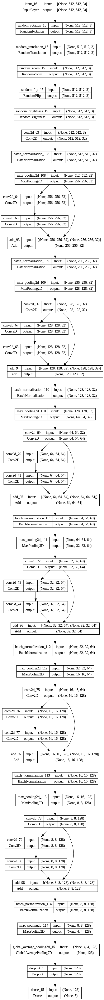

In [ ]:
plot_model(model20, "M20.png", show_shapes=True)

In [ ]:
model20.summary()

Model: "model_15"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_16 (InputLayer)          [(None, 512, 512, 3  0           []                               
                                )]                                                                
                                                                                                  
 random_rotation_15 (RandomRota  (None, 512, 512, 3)  0          ['input_16[0][0]']               
 tion)                                                                                            
                                                                                                  
 random_translation_15 (RandomT  (None, 512, 512, 3)  0          ['random_rotation_15[0][0]']     
 ranslation)                                                                               

In [ ]:
!pip install visualkeras
import visualkeras
from collections import defaultdict

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


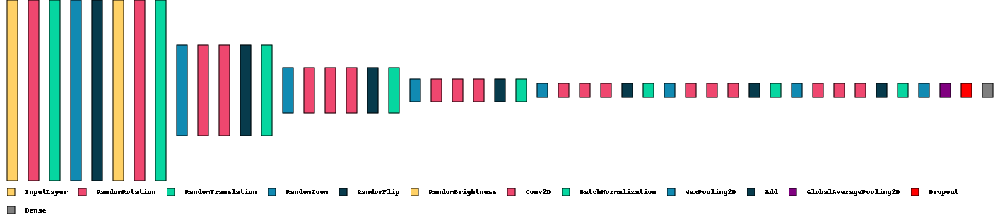

In [ ]:
color_map = defaultdict(dict)
color_map[Dropout]['fill'] = 'red'
color_map[GlobalAveragePooling2D]['fill'] = 'purple'
color_map[Dense]['fill'] = 'gray'
color_map[SeparableConv2D]['fill'] = 'pink'

visualkeras.layered_view(model20, legend=True, scale_xy=0.5, scale_z=0.5, max_z=15, spacing=15, draw_funnel=False, draw_volume=False, color_map=color_map).show() # display using your system viewer

In [ ]:
history20 = model20.fit(train_image_gen,
                     validation_data = valid_image_gen,
                     callbacks =[earlyStop, model_checkpoint_1, model_checkpoint_2], epochs =50,
                     )

Epoch 1/50
633/633 [==============================] - 737s 1s/step - loss: 1.4437 - accuracy: 0.4318 - val_loss: 1.3957 - val_accuracy: 0.4124
Epoch 2/50
633/633 [==============================] - 577s 912ms/step - loss: 1.0997 - accuracy: 0.5644 - val_loss: 1.3837 - val_accuracy: 0.4822
Epoch 3/50
633/633 [==============================] - 541s 853ms/step - loss: 0.9777 - accuracy: 0.6187 - val_loss: 1.0683 - val_accuracy: 0.5871
Epoch 4/50
633/633 [==============================] - 547s 864ms/step - loss: 0.8990 - accuracy: 0.6547 - val_loss: 0.9027 - val_accuracy: 0.6533
Epoch 5/50
633/633 [==============================] - 548s 865ms/step - loss: 0.8249 - accuracy: 0.6874 - val_loss: 0.9645 - val_accuracy: 0.6227
Epoch 6/50
633/633 [==============================] - 540s 852ms/step - loss: 0.7693 - accuracy: 0.7069 - val_loss: 0.9485 - val_accuracy: 0.6431
Epoch 7/50
633/633 [==============================] - 662s 1s/step - loss: 0.7401 - accuracy: 0.7208 - val_loss: 1.2428 - val_a

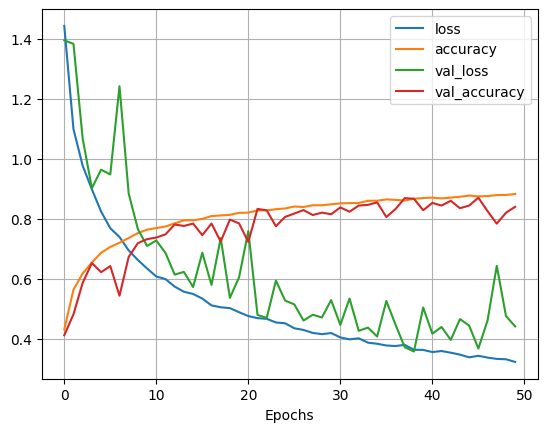

In [ ]:
losses_m20 = pd.DataFrame(model20.history.history).plot(xlabel="Epochs", grid=True);

In [ ]:
model20.save("Project_M20 zip", save_format="tf")
# to download it from Colab to your computer
from google.colab import files
!zip -r Project_M20.zip "Project_M20 zip"/
files.download("Project_M20.zip")

  adding: Project_M20 zip/ (stored 0%)
  adding: Project_M20 zip/assets/ (stored 0%)
  adding: Project_M20 zip/saved_model.pb (deflated 90%)
  adding: Project_M20 zip/variables/ (stored 0%)
  adding: Project_M20 zip/variables/variables.data-00000-of-00001 (deflated 7%)
  adding: Project_M20 zip/variables/variables.index (deflated 75%)
  adding: Project_M20 zip/keras_metadata.pb (deflated 94%)
  adding: Project_M20 zip/fingerprint.pb (stored 0%)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

### Continue training model (part 2)

In [ ]:
history20b = model20.fit(train_image_gen,
                     validation_data = valid_image_gen,
                     callbacks =[earlyStop, model_checkpoint_1, model_checkpoint_2], epochs =50,
                     )

Epoch 1/50
633/633 [==============================] - 540s 852ms/step - loss: 0.3314 - accuracy: 0.8803 - val_loss: 0.3857 - val_accuracy: 0.8524
Epoch 2/50
633/633 [==============================] - 547s 863ms/step - loss: 0.3212 - accuracy: 0.8830 - val_loss: 0.3949 - val_accuracy: 0.8653
Epoch 3/50
633/633 [==============================] - 668s 1s/step - loss: 0.3182 - accuracy: 0.8838 - val_loss: 0.4061 - val_accuracy: 0.8547
Epoch 4/50
633/633 [==============================] - 546s 863ms/step - loss: 0.3156 - accuracy: 0.8860 - val_loss: 0.3603 - val_accuracy: 0.8658
Epoch 5/50
633/633 [==============================] - 542s 855ms/step - loss: 0.3069 - accuracy: 0.8898 - val_loss: 0.4426 - val_accuracy: 0.8396
Epoch 6/50
633/633 [==============================] - 579s 914ms/step - loss: 0.3034 - accuracy: 0.8931 - val_loss: 0.4233 - val_accuracy: 0.8396
Epoch 7/50
633/633 [==============================] - 541s 854ms/step - loss: 0.3092 - accuracy: 0.8897 - val_loss: 0.3919 - va

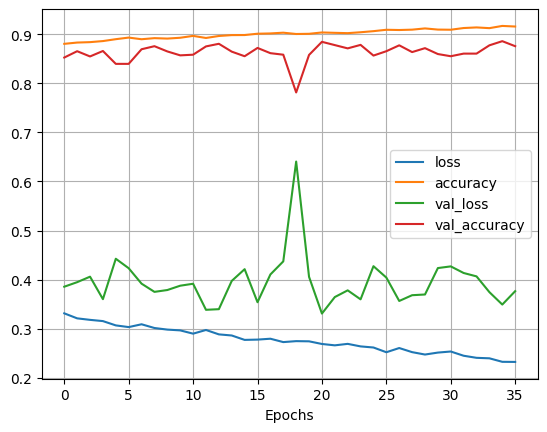

In [ ]:
losses_m20b = pd.DataFrame(model20.history.history).plot(xlabel="Epochs", grid=True);

In [ ]:
from sklearn.metrics import f1_score as f1
from tensorflow.keras import Model, Input
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import SeparableConv2D, Conv2D, MaxPool2D, Dense, Flatten, Dropout, add, GlobalAveragePooling2D, BatchNormalization, RandomFlip, RandomRotation, RandomZoom, Rescaling, RandomTranslation, RandomBrightness, RandomHeight, RandomWidth
from tensorflow.keras.utils import plot_model
from tensorflow.keras.callbacks import ModelCheckpoint, LearningRateScheduler

from tensorflow.keras.initializers import he_normal #might want to switch to SELU and use LeCun
from tensorflow.keras.callbacks import EarlyStopping
from numpy.random import randint, choice
from tensorflow.keras.optimizers import SGD, Adam

randomArray = randint(100,size = 18)

# early stopping parameters
earlyStop = EarlyStopping(monitor='val_loss', mode='min',
                          verbose = 1, patience=15,
                          restore_best_weights=True)#could change the min_delta

# model checkpoint
checkpoint_filepath_1 = '/content/drive/My Drive/Deep Learning project/model20a.hdf5'
model_checkpoint_1 = ModelCheckpoint(
    filepath=checkpoint_filepath_1,
    save_weights_only=True,
    monitor='val_loss',
    mode='min',
    save_best_only=True)

# model checkpoint
checkpoint_filepath_2 = '/content/drive/My Drive/Deep Learning project/model20b.hdf5'
model_checkpoint_2 = ModelCheckpoint(
    filepath=checkpoint_filepath_2,
    save_weights_only=True,
    monitor='val_accuracy',
    mode='max',
    save_best_only=True)

#filters = number of feature maps created
#kernel = size of filter(7,7) deafault stride =1
#using RELU Activation
#padding set to same
#input shape is 512x512 pixel, 1=grayscale (3 for color/rbg img)

#CNN
inputs = Input(shape=(512,512,3))

# Add the preprocessing/augmentation layers.
# x = RandomRotation(0.45)(inputs)
# x = RandomTranslation((-0.05, 0.05),(-0.05, 0.05))(x)
# x = RandomZoom(.1, .1)(x)
# x = RandomFlip(mode='horizontal')(x)
# x = RandomBrightness(0.2, value_range=(0.0,1.0))(x)

x = Conv2D(filters=32, kernel_size=5, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(inputs)
x = BatchNormalization()(x)
block_1_output = MaxPool2D(2)(x)

x = Conv2D(filters=32, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(block_1_output)
x = Conv2D(filters=32, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(x)

x = add([x,block_1_output])
x = BatchNormalization()(x)
x = MaxPool2D(2)(x)

block_2_output = Conv2D(filters=32, kernel_size=3, activation='swish', padding='same',
                        kernel_initializer = he_normal(seed = choice(randomArray)))(x)
x = Conv2D(filters=32, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(block_2_output)
x = Conv2D(filters=32, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(x)

x = add([x,block_2_output])
x = BatchNormalization()(x)
x = MaxPool2D(2)(x)

block_3_output = Conv2D(filters=64, kernel_size=3, activation='swish', padding='same',
                        kernel_initializer = he_normal(seed = choice(randomArray)))(x)
x = Conv2D(filters=64, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(block_3_output)
x = Conv2D(filters=64, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(x)

x = add([x,block_3_output])
x = BatchNormalization()(x)
x = MaxPool2D(2)(x)

block_4_output = Conv2D(filters=64, kernel_size=3, activation='swish', padding='same',
                        kernel_initializer = he_normal(seed = choice(randomArray)))(x)
x = Conv2D(filters=64, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(block_4_output)
x = Conv2D(filters=64, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(x)

x = add([x,block_4_output])
x = BatchNormalization()(x)
x = MaxPool2D(2)(x)

block_5_output = Conv2D(filters=128, kernel_size=3, activation='swish', padding='same',
                        kernel_initializer = he_normal(seed = choice(randomArray)))(x)
x = Conv2D(filters=128, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(block_5_output)
x = Conv2D(filters=128, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(x)

x = add([x,block_5_output])
x = BatchNormalization()(x)
x = MaxPool2D(2)(x)

block_6_output = Conv2D(filters=128, kernel_size=3, activation='swish', padding='same',
                        kernel_initializer = he_normal(seed = choice(randomArray)))(x)
x = Conv2D(filters=128, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(block_6_output)
x = Conv2D(filters=128, kernel_size=3, activation='swish', padding='same',
           kernel_initializer = he_normal(seed = choice(randomArray)))(x)

x = add([x,block_6_output])
x = BatchNormalization()(x)
x = MaxPool2D(2)(x)

# DNN
x = GlobalAveragePooling2D()(x)
x = Dropout(0.50)(x)
outputs = Dense(5, activation="softmax")(x)

model20 = Model(inputs, outputs)

model20.compile(loss='categorical_crossentropy',  #cat_ent for one-hot encoding classification problem
               optimizer='adam',
               metrics = ["accuracy"])

# Restore the weights resulting in the highest validation accuracy
model20.load_weights(checkpoint_filepath_2) # model should be located in google drive

In [ ]:
model20.save("Project_M20 zip", save_format="tf")
# to download it from Colab to your computer
from google.colab import files
!zip -r Project_M20.zip "Project_M20 zip"/
files.download("Project_M20.zip")

  adding: Project_M20 zip/ (stored 0%)
  adding: Project_M20 zip/fingerprint.pb (stored 0%)
  adding: Project_M20 zip/saved_model.pb (deflated 91%)
  adding: Project_M20 zip/variables/ (stored 0%)
  adding: Project_M20 zip/variables/variables.data-00000-of-00001 (deflated 8%)
  adding: Project_M20 zip/variables/variables.index (deflated 72%)
  adding: Project_M20 zip/assets/ (stored 0%)
  adding: Project_M20 zip/keras_metadata.pb (deflated 94%)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

### Continue training model (part 2.5)

Although the model was further trained after the early stopping point, the results of this training were unable to be tested on Gradescope. The submission for the project on Gradescope is instead the results of the previous training in part 2.

In [ ]:
history20c = model20.fit(train_image_gen,
                     validation_data = valid_image_gen,
                     callbacks =[earlyStop, model_checkpoint_1, model_checkpoint_2], epochs =50,
                     )

Epoch 1/50
633/633 [==============================] - 636s 1s/step - loss: 0.2721 - accuracy: 0.9014 - val_loss: 0.3455 - val_accuracy: 0.8827
Epoch 2/50
633/633 [==============================] - 538s 850ms/step - loss: 0.2591 - accuracy: 0.9077 - val_loss: 0.3516 - val_accuracy: 0.8782
Epoch 3/50
633/633 [==============================] - 536s 847ms/step - loss: 0.2695 - accuracy: 0.9020 - val_loss: 0.3817 - val_accuracy: 0.8702
Epoch 4/50
633/633 [==============================] - 547s 865ms/step - loss: 0.2560 - accuracy: 0.9074 - val_loss: 0.3427 - val_accuracy: 0.8818
Epoch 5/50
633/633 [==============================] - 548s 865ms/step - loss: 0.2568 - accuracy: 0.9073 - val_loss: 0.4168 - val_accuracy: 0.8636
Epoch 6/50
633/633 [==============================] - 548s 866ms/step - loss: 0.2514 - accuracy: 0.9100 - val_loss: 0.3490 - val_accuracy: 0.8818
Epoch 7/50
633/633 [==============================] - 547s 863ms/step - loss: 0.2524 - accuracy: 0.9084 - val_loss: 0.3412 - va

In [ ]:
# Restore the weights leading to the highest validation accuracy
model20.load_weights(checkpoint_filepath_2) # model should be located in google drive

In [ ]:
model20.save("Project_M20_3 zip", save_format="tf")
# to download it from Colab to your computer
from google.colab import files
!zip -r Project_M20_3.zip "Project_M20_3 zip"/
files.download("Project_M20_3.zip")

  adding: Project_M20_3 zip/ (stored 0%)
  adding: Project_M20_3 zip/fingerprint.pb (stored 0%)
  adding: Project_M20_3 zip/saved_model.pb (deflated 90%)
  adding: Project_M20_3 zip/variables/ (stored 0%)
  adding: Project_M20_3 zip/variables/variables.data-00000-of-00001 (deflated 8%)
  adding: Project_M20_3 zip/variables/variables.index (deflated 72%)
  adding: Project_M20_3 zip/assets/ (stored 0%)
  adding: Project_M20_3 zip/keras_metadata.pb (deflated 94%)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>